In [1]:
# necessary imports

import os
import re

# import gseapy as gp

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas.api.types import CategoricalDtype

import seaborn as sns

from sklearn.metrics import mean_squared_error, precision_recall_curve
from scipy.stats import pearsonr, ttest_ind, mannwhitneyu

from plotnine import *

# is used in many cells later
types_data = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_data.type)


def calculate_average(purity_df, consensus_df, metric_name):
    """
        Input: purity_df with columns as methods + optionally, 'type' as a column (drops it)
        Output: df with averaged metrics
        
        Calculates average metric for each method specified in the purity_df columns.
    """
    metric_dfs = []
    
    if 'type' in purity_df.columns:
        methods = purity_df.columns.drop(['type'])
    else:
        methods = purity_df.columns    
    
    purity_df = purity_df.join(consensus_df)
    
    for m in methods:
        
        if metric_name == 'rmse':
            metric = (np.sqrt(mean_squared_error(purity_df['purity'], purity_df[m])))
            
        if metric_name == 'correlation':
            metric = np.corrcoef(purity_df['purity'], purity_df[m])[0][1]
        
        metric_dfs.append(pd.DataFrame(data=[metric], index=[m], columns=[metric_name]))

    metric_df = pd.concat(metric_dfs, axis=0) # concatenate separate metric dfs into one
    
    return metric_df


def calculate_average_by_type(purity_df, consensus_df, types_df, metric_name):
    """ 
        Input: dataframe of purities with at least two methods' results in columns
        Output: dataframe with metric by type
        
        Calculates similarity between methods (columns in purity df) grouped by cancer types 
    """
    frames = []
    
    methods = purity_df.columns
    try:
        purity_df = purity_df.join(types_df)
    except ValueError:
        pass
    
    for ctype in set(purity_df['type']):
        pur_by_type = purity_df[purity_df['type'] == ctype]
        df = calculate_average(pur_by_type, consensus_df, metric_name)
        df['type'] = ctype
        
        frames.append(df)
        
    df_total = pd.concat(frames, axis=0)

    return df_total

metric_name = 'rmse' # the default metric

## Supplementary figures

### Supp. Fig. S1: Agreement of the DNA and gene expression-based purity estimation methods

#### TCGA-train

/tmp/ipykernel_26017/1825490166.py:51: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_text : Removed 66 rows containing missing values.


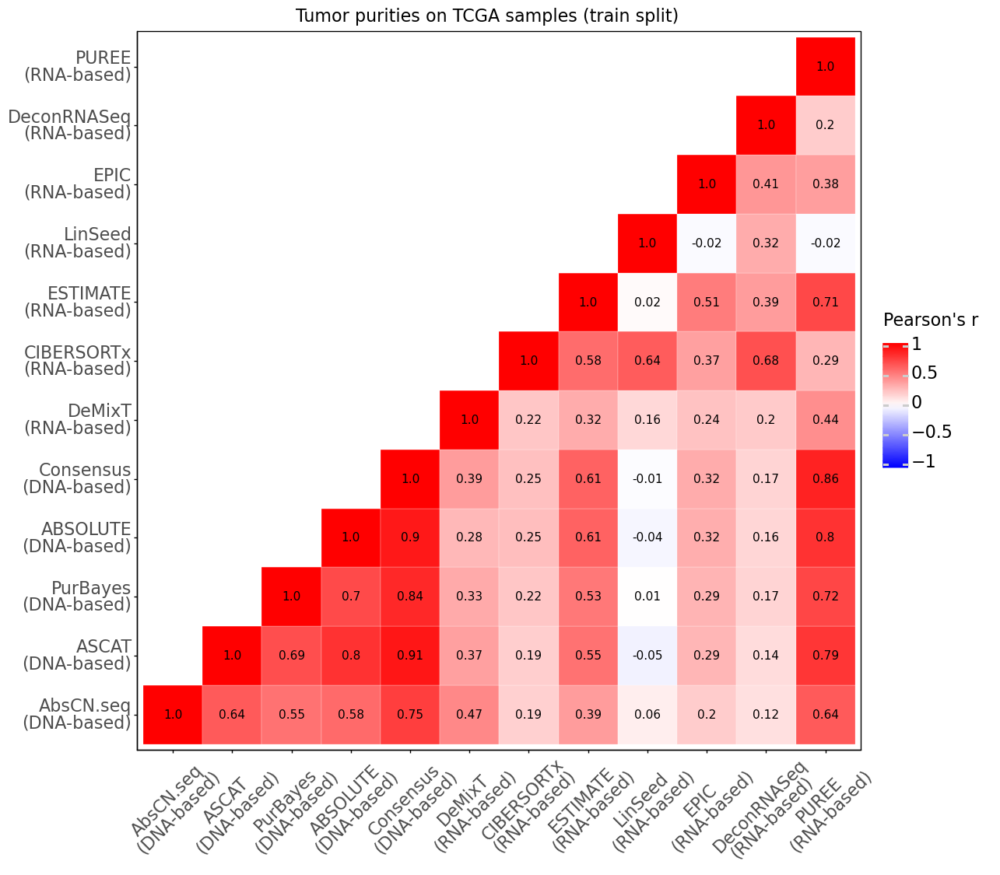

<ggplot: (8764010008077)>

In [2]:
purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

dataset_type = 'train'

feature_set = 'wf_full_linear-rt_chrom_filt' # 158 fs

model = 'LinearRegression'
for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, [model]])
        break

predicted_purity_df.columns = ['PUREE']
idx = predicted_purity_df.index

predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df > 1).PUREE].index] = 1
predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df < 0).PUREE].index] = 0

types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df['type'])

# lasso_10k = ''
estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
demixt_pur = pd.read_csv("../data/purities/TCGA_8K/DeMixT_{0}_purities.csv".format(dataset_type), index_col=0)
cibersort_pur = pd.read_csv("../data/purities/TCGA_8K/CIBERSORTx_{0}_purities.csv".format(dataset_type), index_col=0)
linseed_pur = 1 - pd.read_csv("../data/purities/TCGA_8K/LinSeed_{0}_proportions.csv".format(dataset_type), index_col=0).iloc[:,[0]]
linseed_pur.columns = ['LinSeed']
epic_pur = pd.read_csv("../data/purities/TCGA_8K/EPIC_{0}_purities.csv".format(dataset_type), index_col=0)
deconrnaseq_pur = pd.read_csv("../data/purities/TCGA_8K/DeconRNASeq_{0}_purities.csv".format(dataset_type), index_col=0)

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
consensus_df = consensus_df.loc[predicted_purity_df.index, :]
consensus_df.columns = ['Consensus']

purities_masterlist = pd.read_csv("../data/purities/TCGA_8K/meta_purity_genomic_7865.tsv", sep='\t').loc[consensus_df.index]
purities_masterlist = (purities_masterlist.loc[:, ['AbsCN.seq', 'ASCAT', 'PurBayes', 'ABSOLUTE']]
                         .join(consensus_df)
                         .join(demixt_pur)
                         .join(cibersort_pur)
                         .join(estimate_pur)
                         .join(linseed_pur)
                         .join(epic_pur)
                         .join(deconrnaseq_pur)
                         .join(predicted_purity_df)
                         .rename({'purity':'Consensus'}, axis=1)).loc[predicted_purity_df.index]

purities_masterlist.columns = [*(purities_masterlist.columns[:5] + '\n(DNA-based)'), \
                               *(purities_masterlist.columns[5:] + '\n(RNA-based)')]

df = purities_masterlist.corr().where(np.tril(np.ones(purities_masterlist.corr().shape)).astype(np.bool))
corr_df_melted = df.reset_index().melt(id_vars='index')
corr_df_melted['value_rounded'] = np.round(corr_df_melted['value'], 2)

x_order = purities_masterlist.columns

p = (ggplot(corr_df_melted, aes(x='index', y='variable'))
    + geom_tile(aes(fill='value'), color='white')
    + geom_text(aes(label='value_rounded'))
    + scale_fill_gradient2(low = "blue", high = "red", mid = "white", 
       midpoint = 0, limits=(-1,1), na_value = 'white', 
       name="Pearson's r\n")
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=16), 
            axis_text_x=element_text(rotation=45, hjust=0.45),
            figure_size=(12, 12))
    + scale_x_discrete(limits=x_order)
    + scale_y_discrete(limits=x_order)
    + labs(x='', y='', title='Tumor purities on TCGA samples ({0} split)'.format(dataset_type))
    )

p

# p.save('../plots/supplementary/S1a.pdf')
p

#### TCGA-test

/tmp/ipykernel_4142/686444349.py:51: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/1b.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_text : Removed 66 rows containing missing values.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_text : Removed 66 rows containi

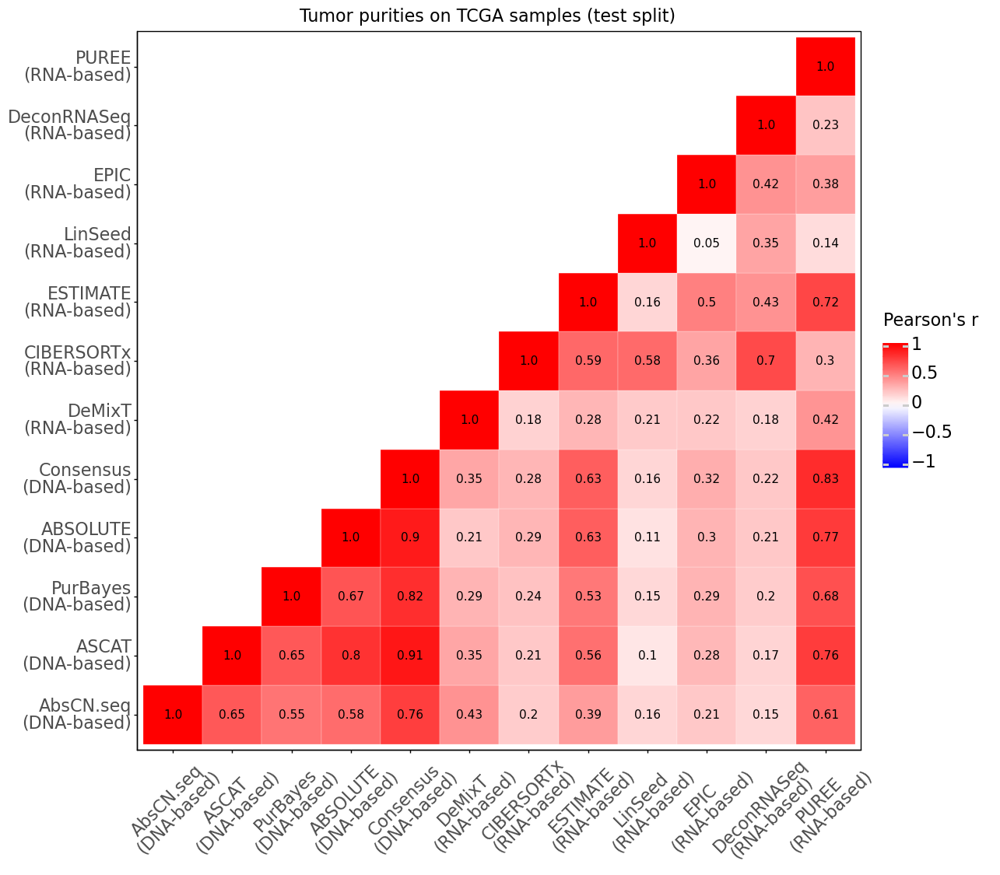

<ggplot: (8792876034768)>

In [173]:
purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

dataset_type = 'test'

feature_set = 'wf_full_linear-rt_chrom_filt' # 158 fs

model = 'LinearRegression'
for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, [model]])
        break

predicted_purity_df.columns = ['PUREE']
idx = predicted_purity_df.index

predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df > 1).PUREE].index] = 1
predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df < 0).PUREE].index] = 0

types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df['type'])

# lasso_10k = ''
estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
demixt_pur = pd.read_csv("../data/purities/TCGA_8K/DeMixT_{0}_purities.csv".format(dataset_type), index_col=0)
cibersort_pur = pd.read_csv("../data/purities/TCGA_8K/CIBERSORTx_{0}_purities.csv".format(dataset_type), index_col=0)
linseed_pur = 1 - pd.read_csv("../data/purities/TCGA_8K/LinSeed_{0}_proportions.csv".format(dataset_type), index_col=0).iloc[:,[0]]
linseed_pur.columns = ['LinSeed']
epic_pur = pd.read_csv("../data/purities/TCGA_8K/EPIC_{0}_purities.csv".format(dataset_type), index_col=0)
deconrnaseq_pur = pd.read_csv("../data/purities/TCGA_8K/DeconRNASeq_{0}_purities.csv".format(dataset_type), index_col=0)

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
consensus_df = consensus_df.loc[predicted_purity_df.index, :]
consensus_df.columns = ['Consensus']

purities_masterlist = pd.read_csv("../data/purities/TCGA_8K/meta_purity_genomic_7865.tsv", sep='\t').loc[consensus_df.index]
purities_masterlist = (purities_masterlist.loc[:, ['AbsCN.seq', 'ASCAT', 'PurBayes', 'ABSOLUTE']]
                         .join(consensus_df)
                         .join(demixt_pur)
                         .join(cibersort_pur)
                         .join(estimate_pur)
                         .join(linseed_pur)
                         .join(epic_pur)
                         .join(deconrnaseq_pur)
                         .join(predicted_purity_df)
                         .rename({'purity':'Consensus'}, axis=1)).loc[predicted_purity_df.index]

purities_masterlist.columns = [*(purities_masterlist.columns[:5] + '\n(DNA-based)'), \
                               *(purities_masterlist.columns[5:] + '\n(RNA-based)')]

df = purities_masterlist.corr().where(np.tril(np.ones(purities_masterlist.corr().shape)).astype(np.bool))
corr_df_melted = df.reset_index().melt(id_vars='index')
corr_df_melted['value_rounded'] = np.round(corr_df_melted['value'], 2)

x_order = purities_masterlist.columns

p = (ggplot(corr_df_melted, aes(x='index', y='variable'))
    + geom_tile(aes(fill='value'), color='white')
    + geom_text(aes(label='value_rounded'))
    + scale_fill_gradient2(low = "blue", high = "red", mid = "white", 
       midpoint = 0, limits=(-1,1), na_value = 'white', 
       name="Pearson's r\n")
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=16), 
            axis_text_x=element_text(rotation=45, hjust=0.45),
            figure_size=(12, 12))
    + scale_x_discrete(limits=x_order)
    + scale_y_discrete(limits=x_order)
    + labs(x='', y='', title='Tumor purities on TCGA samples ({0} split)'.format(dataset_type))
    )

p

# p.save('../plots/supplementary/S1b.pdf')
p

### Supp. Fig. S2: Exploring the range of machine learning methods for the PUREE approach

#### Correlation - a

In [174]:
feature_set = '20k_tpmf_full_linear-rt_chrom_filt' # change this for different feature sets
model = 'Lasso'

##### Test

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S2a_test.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


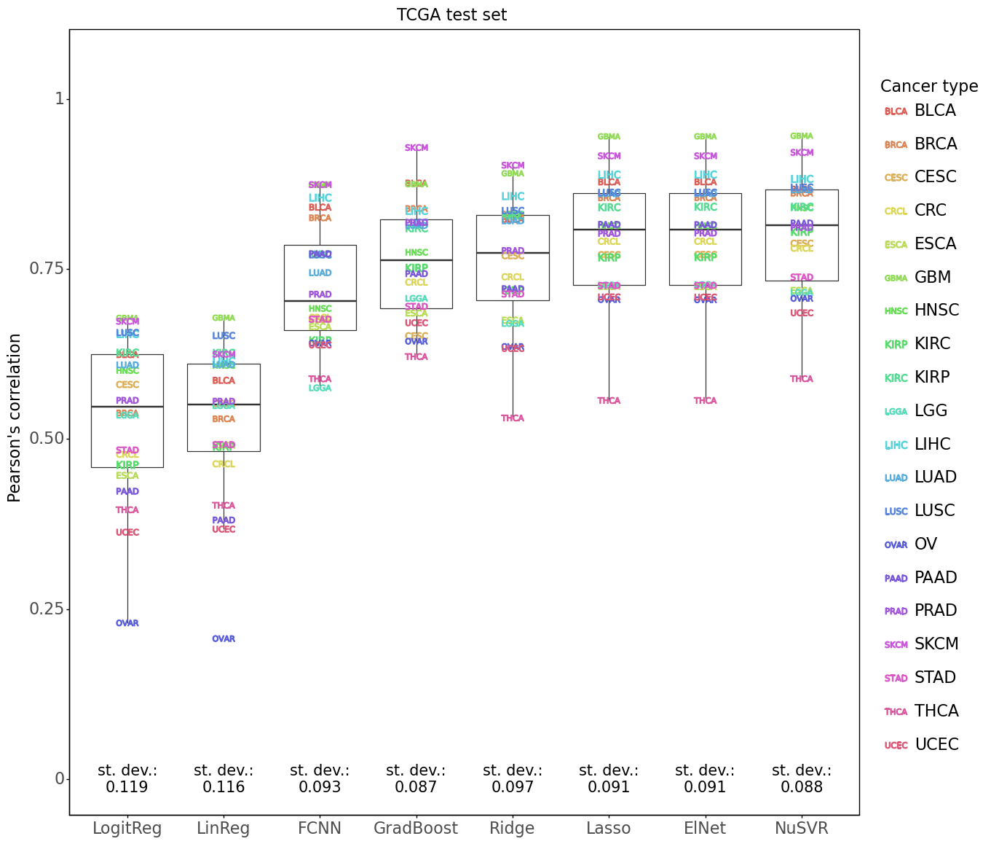

<ggplot: (8792872910370)>

In [179]:
metric_name = 'correlation' # change this for different metrics (correlation/rmse)
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.index
metric_t = metric_t_df.sort_values(by=metric_name, ascending=False)

x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=True).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=0, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + ylim(0,1.05)
 + labs(y="Pearson's correlation",
        title='TCGA {0} set'.format(dataset_type,metric_name.upper()),
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S2a_test.pdf')
p

##### Train - test (bias-variance) plot

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S3_diff.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarn

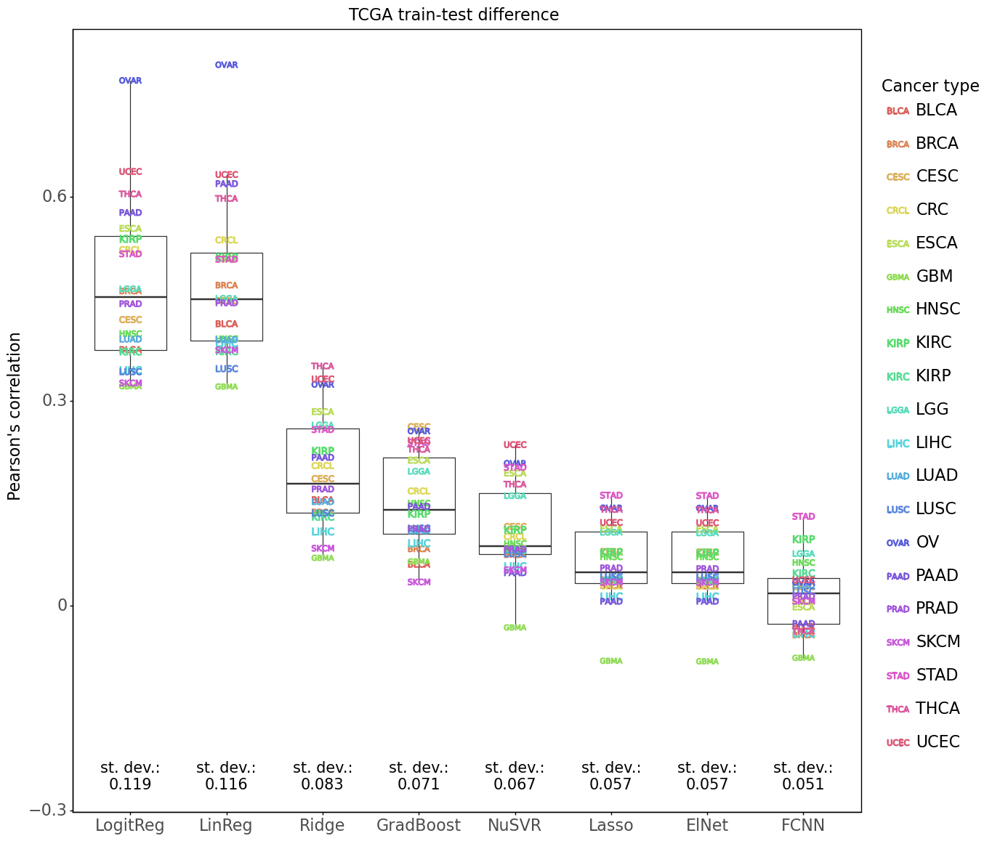

<ggplot: (8792873424833)>

In [181]:
metric_name = 'correlation' # change this for different metrics (correlation/rmse)
dataset_type = 'train' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_train = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

### test
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_test = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

metric_t = metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')
metric_t[metric_name] = (metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name] - \
    metric_t_df_test.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name])

metric_t = metric_t.sort_values(by=metric_name, ascending=False)


x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=False).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=-0.25, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + labs(y="Pearson's correlation",
        title='TCGA train-test difference',
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S3_diff.pdf')
p

#### RMSE - b

In [182]:
feature_set = '20k_tpmf_full_linear-rt_chrom_filt' # change this for different feature sets
model = 'Lasso'

##### Test

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S3b_test.pdf


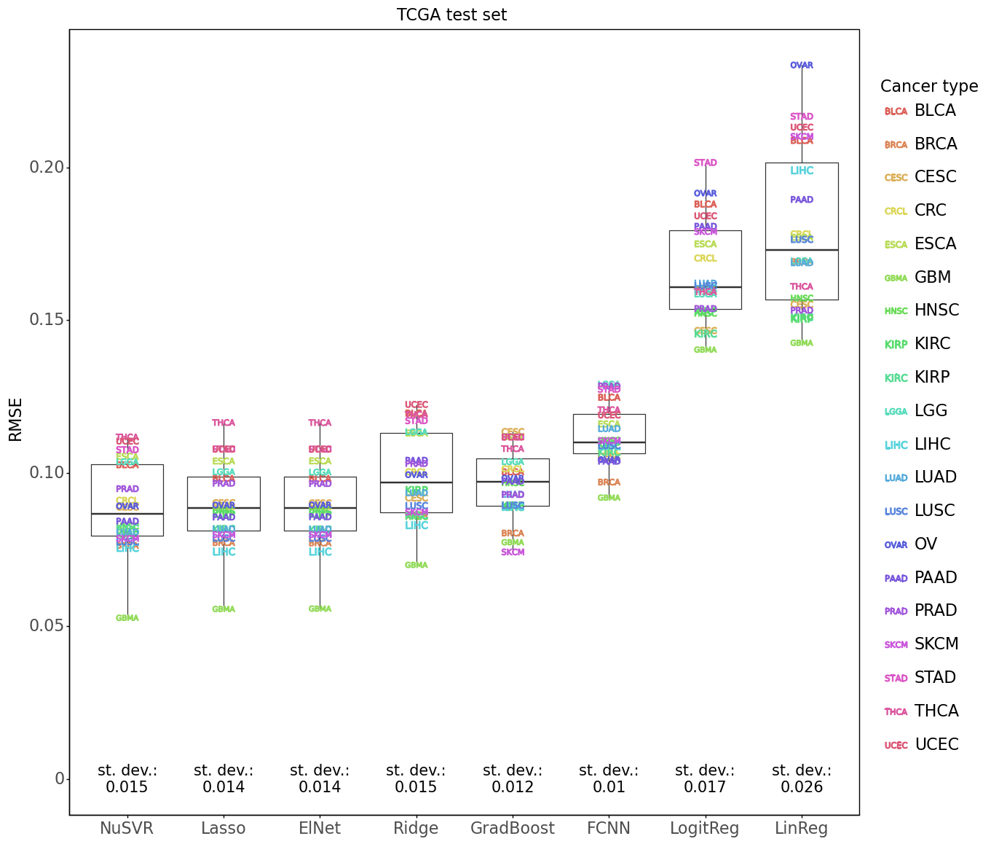

<ggplot: (8792875983580)>

In [184]:
metric_name = 'rmse' # change this for different metrics (correlation/rmse)
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.index
metric_t = metric_t_df.sort_values(by=metric_name, ascending=False)

x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=True).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=0, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + labs(y="RMSE",
        title='TCGA {0} set'.format(dataset_type,metric_name.upper()),
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S2b_test.pdf')
p

##### Train - test (bias-variance) plot

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S3b_diff.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWar

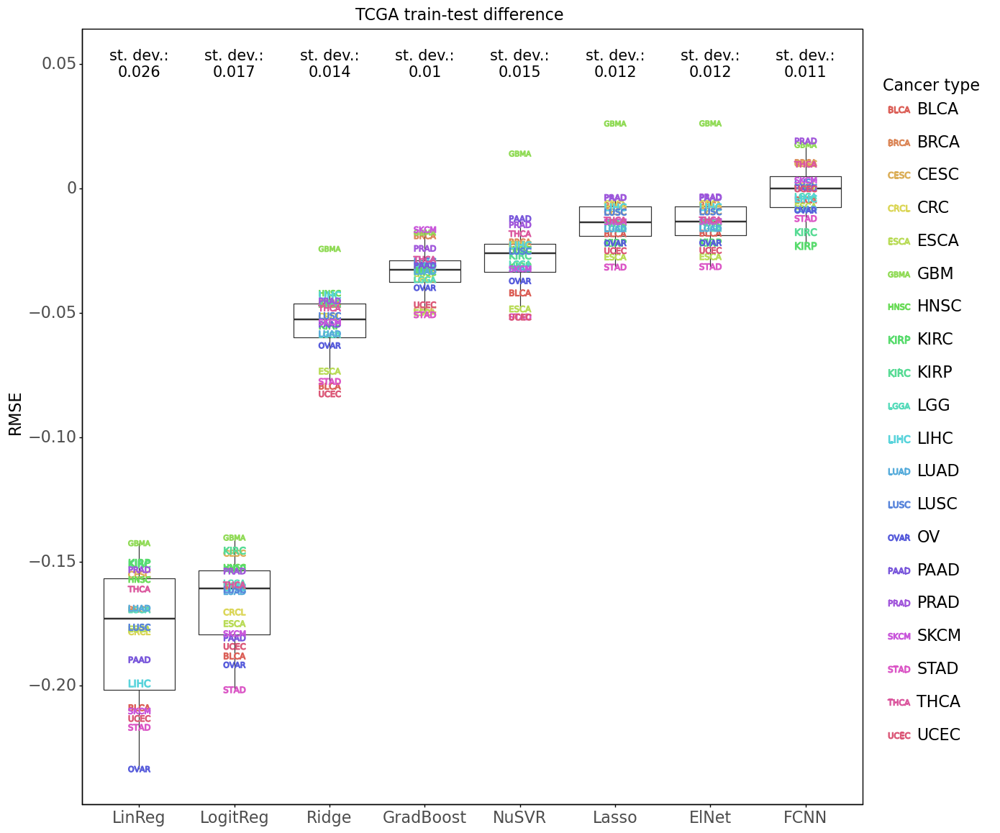

<ggplot: (8792880253133)>

In [188]:
metric_name = 'rmse' # change this for different metrics (correlation/rmse)
dataset_type = 'train' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_train = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

### test
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_test = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

metric_t = metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')
metric_t[metric_name] = (metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name] - \
    metric_t_df_test.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name])

metric_t = metric_t.sort_values(by=metric_name, ascending=False)


x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=True).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=0.05, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + labs(y="RMSE",
        title='TCGA train-test difference',
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S2b_diff.pdf')
p

#### Correlation - c

In [189]:
feature_set = 'wf_full_linear-rt_chrom_filt' # 158 fs
model = 'LinReg'

##### Test

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S2c_test.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


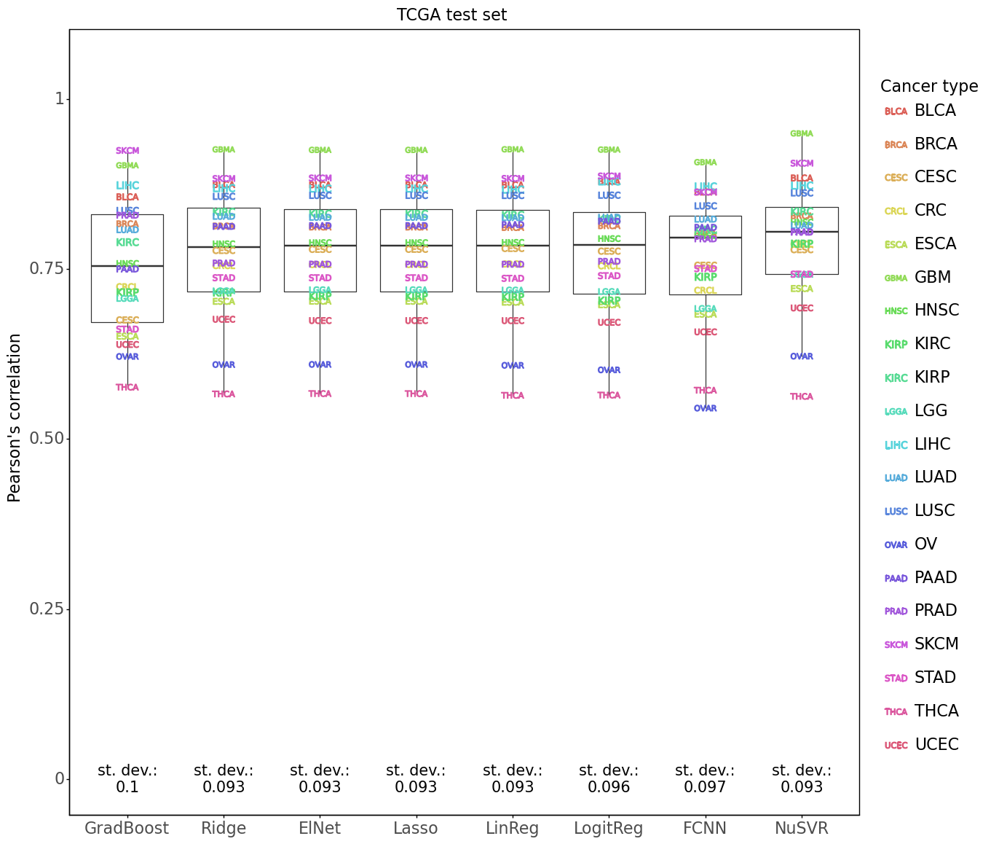

<ggplot: (8792875521356)>

In [191]:
metric_name = 'correlation' # change this for different metrics (correlation/rmse)
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

# results = dict()
consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.index
metric_t = metric_t_df.sort_values(by=metric_name, ascending=False)

x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=True).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=0, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + ylim(0,1.05)
 + labs(y="Pearson's correlation",
        title='TCGA {0} set'.format(dataset_type,metric_name.upper()),
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S2c_test.pdf')
p

##### Train - test (bias-variance) plot

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S2c_diff.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms

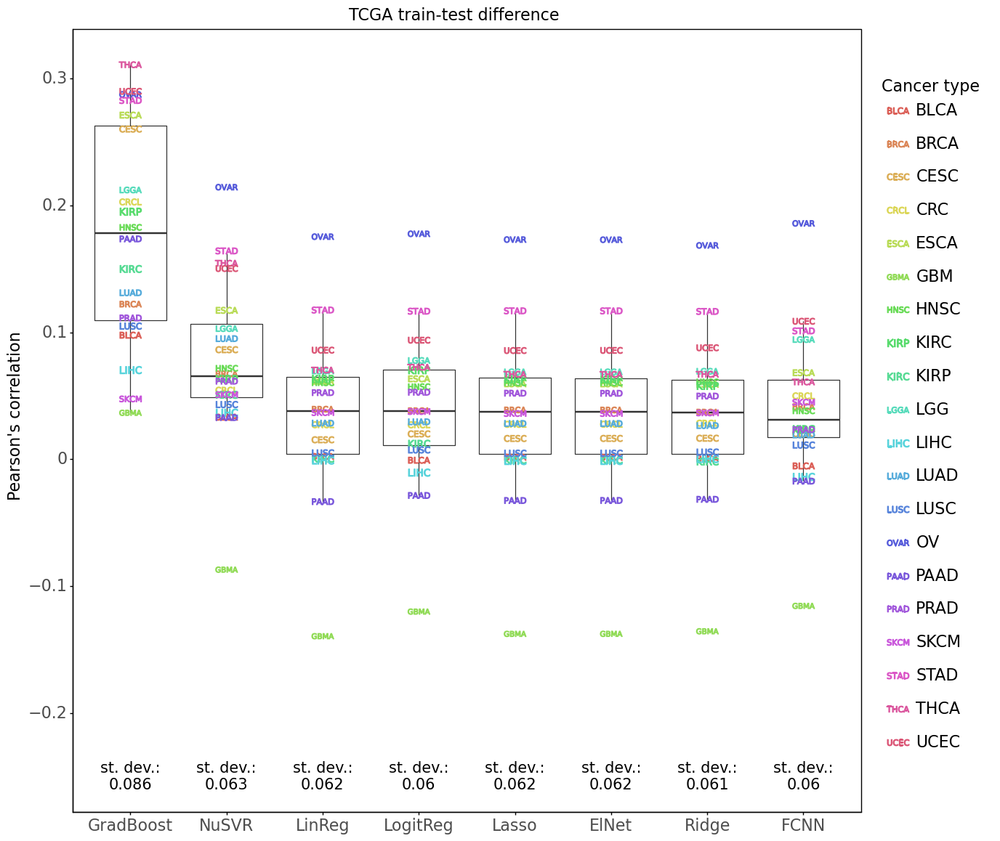

<ggplot: (8792874936128)>

In [192]:
metric_name = 'correlation' # change this for different metrics (correlation/rmse)
dataset_type = 'train' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_train = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

### test
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_test = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

metric_t = metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')
metric_t[metric_name] = (metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name] - \
    metric_t_df_test.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name])

metric_t = metric_t.sort_values(by=metric_name, ascending=False)


x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=False).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=-0.25, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + labs(y="Pearson's correlation",
        title='TCGA train-test difference',
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S2c_diff.pdf')
p

#### RMSE - d

In [195]:
feature_set = 'wf_full_linear-rt_chrom_filt' # 158 fs
model = 'LinReg'

##### Test

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S2d_test.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWar

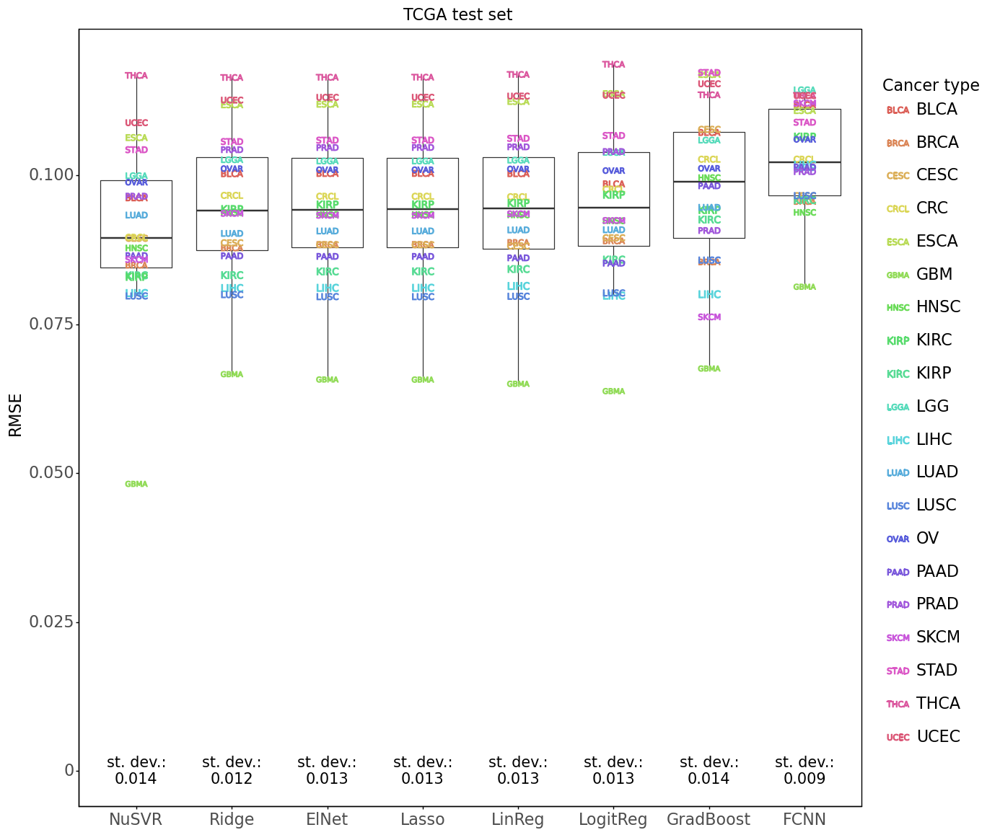

<ggplot: (8792872254389)>

In [196]:
metric_name = 'rmse' # change this for different metrics (correlation/rmse)
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.index
metric_t = metric_t_df.sort_values(by=metric_name, ascending=False)

x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=True).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=0, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + labs(y="RMSE",
        title='TCGA {0} set'.format(dataset_type,metric_name.upper()),
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S2d_test.pdf')
p

##### Train - test (bias-variance) plot

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S2d_diff.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWar

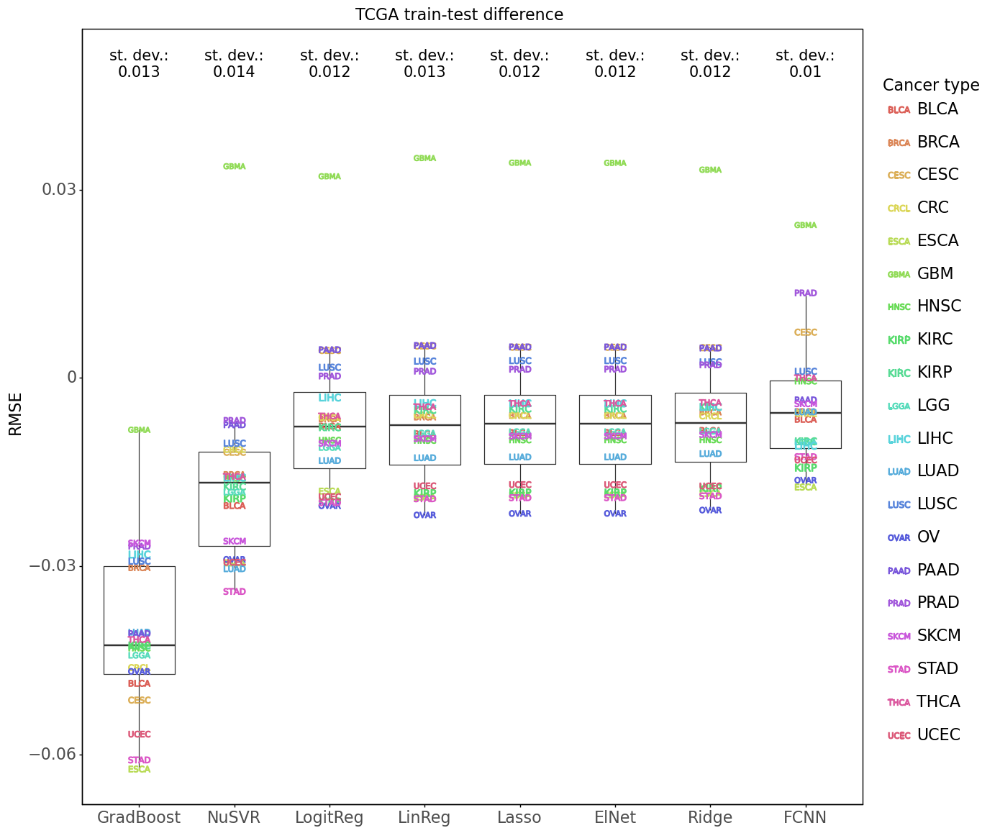

<ggplot: (8792875027080)>

In [197]:
metric_name = 'rmse' # change this for different metrics (correlation/rmse)
dataset_type = 'train' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_train = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

### test
dataset_type = 'test' # change this for different TCGA splits (train/test)

purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, :])
        break

rename_dict = {'fcNN-Keras':'fcNN',
       'LinearRegression':'LinReg',
       'GradientBoostingRegressor':'GradBoost',
               'NuSVR':'NuSVR',
               'ElasticNetCV':'ElNet',
               'LogitRegression':'LogitReg',
               'LassoCV':'Lasso',
               'RidgeCV':'Ridge'
              }
predicted_purity_df = predicted_purity_df.rename(rename_dict, axis=1)

metric_t = []
metric_t_df_test = calculate_average_by_type(predicted_purity_df, consensus_df, 
                                        types_df, metric_name)

metric_t = metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')
metric_t[metric_name] = (metric_t_df_train.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name] - \
    metric_t_df_test.reset_index().sort_values(['type', 'index']).set_index('index')[metric_name])

metric_t = metric_t.sort_values(by=metric_name, ascending=False)


x_order = metric_t.groupby([metric_t.index]).median(metric_name).sort_values(metric_name, ascending=True).index

best_models_p_val = stats.wilcoxon(metric_t.loc['NuSVR'].sort_values('type')[metric_name], 
               metric_t.loc[model].sort_values('type')[metric_name])[1]
median_delta = np.abs(np.subtract(metric_t.loc['NuSVR'].sort_values('type')[metric_name].median(), 
                                  metric_t.loc[model].sort_values('type')[metric_name].median()))

std_df = metric_t.groupby(metric_t.index).std()
std_df[metric_name] = 'st. dev.:\n' + np.round(std_df[metric_name], 3).astype('str')

colors = [
    '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
    '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff',
    '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1',
    '#000075', '#808080', '#ffffff', '#000000'
] # colors for cancer types

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot()
 + geom_boxplot(aes(x=metric_t.index, y=metric_name), data=metric_t, outlier_shape='')
 + geom_point(aes(x=metric_t.index, y=metric_name, color=metric_t.type, shape=metric_t.type),
              data = metric_t,
              size=12)
 + geom_text(aes(x=std_df.index, y=0.05, label=metric_name), data = std_df, size=15)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + labs(y="RMSE",
        title='TCGA train-test difference',
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S2d_diff.pdf')
p

### Supp. Fig. S3: Hallmark pathway analysis of 158 genes used in the final model
We are not providing the full analysis here, but you can see the general function used for generating the data in the cell below

In [ ]:
enr = gp.enrichr(gene_list=list(genes),
                 gene_sets = '../data/misc/enrichment_analysis/hallmark_gene_set_hgnc.gmt',
                 organism='human', # don't forget to set organism
                 outdir='../results/enrichment_analysis',
                 background = list(background_features_hgnc),
                 cutoff=0.05 # method=benjamini-hochberg
                )

p_value= 'Adjusted P-value'

top_pathways = enr.results.sort_values(by=p_value).iloc[:10]
top_pathways['Term'] = top_pathways['Term'].str.replace('_',' ')
top_pathways['-log10(P-value)'] = -np.log10(top_pathways[p_value])
top_pathways['Number of genes found'] = top_pathways['Genes'].str.split(';').apply(len)

#### a) All genes 

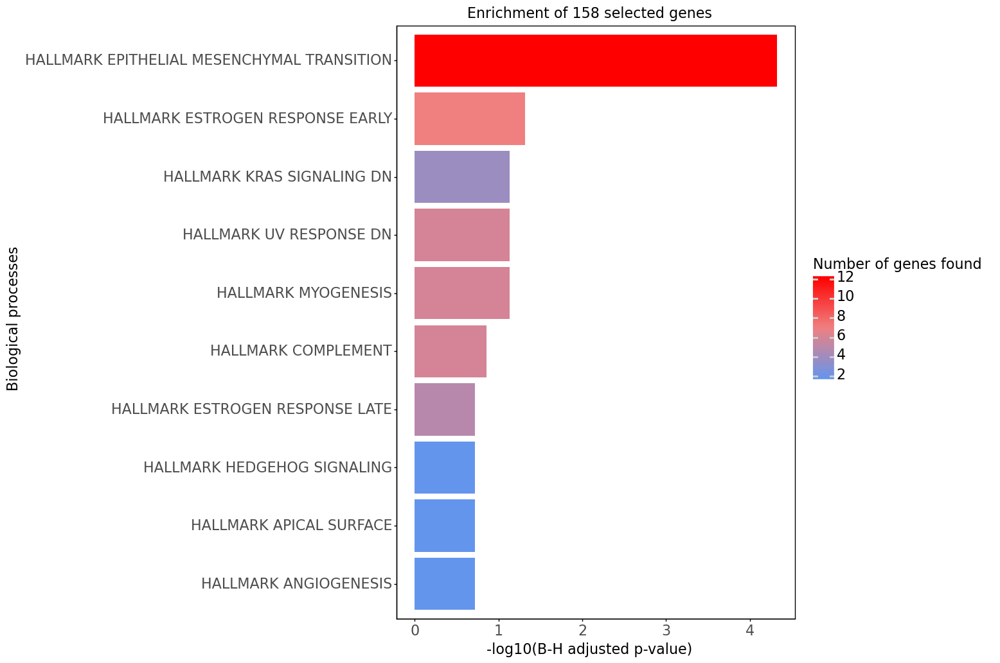

<ggplot: (8764010009775)>

In [6]:
# load the pathway analysis results precomputed with gseapy
top_pathways = pd.read_csv('../data/misc/gsea_top_10_pathways_158.csv', index_col=0)

p = (ggplot(top_pathways)
    + geom_bar(aes(x='Term', y='-log10(P-value)', fill='Number of genes found'),
               stat='identity', 
               position=position_dodge())
    + coord_flip()
    + labs(y='-log10(B-H adjusted p-value)', x="Biological processes", 
          title = 'Enrichment of 158 selected genes'
          )
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=16), 
            figure_size=(8, 12))
    + scale_fill_gradientn(colors=('cornflowerblue', 'lightcoral', 'red'))
    + scale_x_discrete(limits=top_pathways["Term"][::-1])
)

# p.save('../plots/supplementary/S3a.pdf')
p

#### b) Top 30% genes by correlation

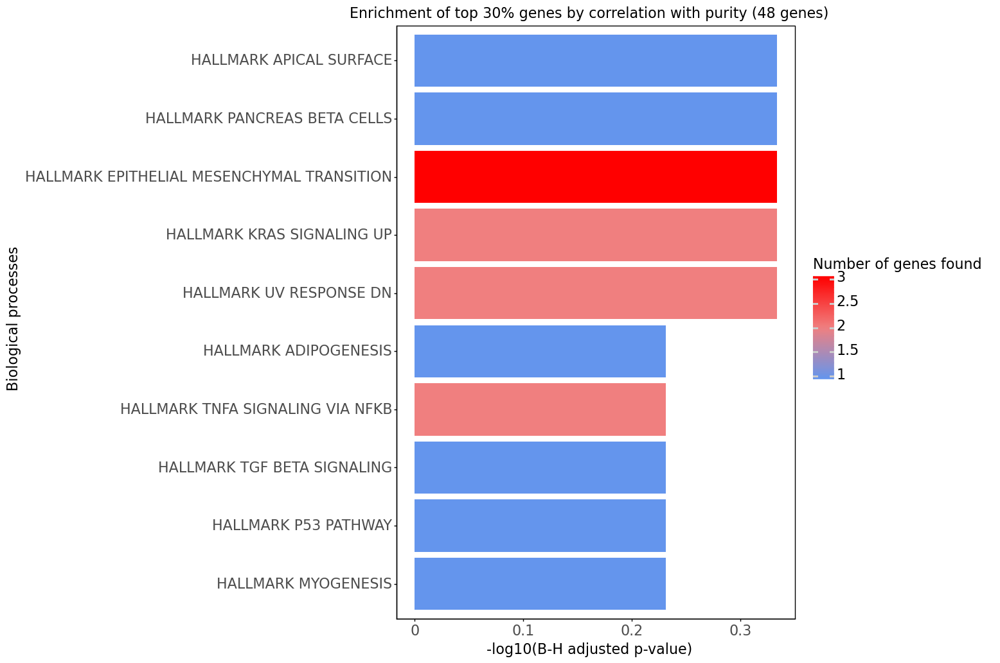

<ggplot: (8763990495955)>

In [19]:
# load the pathway analysis results precomputed with gseapy
top_pathways = pd.read_csv('../data/misc/gsea_top_10_pathways_top30.csv', index_col=0)

p = (ggplot(top_pathways)
    + geom_bar(aes(x='Term', y='-log10(P-value)', fill='Number of genes found'),
               stat='identity', 
               position=position_dodge())
    + coord_flip()
    + labs(y='-log10(B-H adjusted p-value)', x="Biological processes", 
          title = 'Enrichment of top 30% genes by correlation with purity (48 genes)'
          )
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=16), 
            figure_size=(8, 12))
    + scale_fill_gradientn(colors=('cornflowerblue', 'lightcoral', 'red'))
    + scale_x_discrete(limits=top_pathways["Term"][::-1])
)

# p.save('../plots/supplementary/S3b.pdf')
p

#### c) Bottom 30% genes by correlation

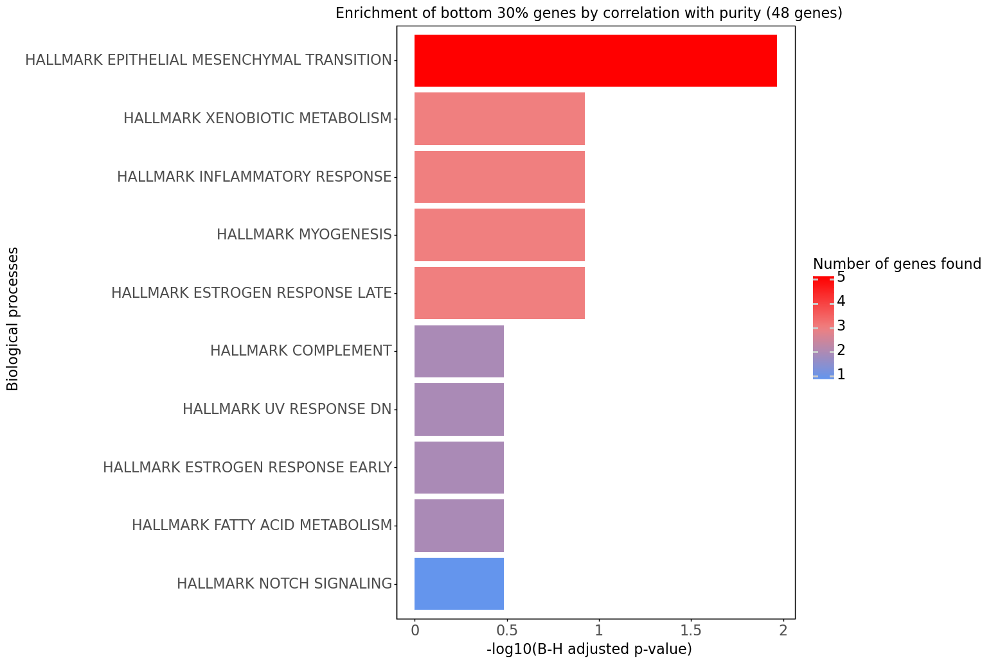

<ggplot: (8763990480610)>

In [21]:
# load the pathway analysis results precomputed with gseapy
top_pathways = pd.read_csv('../data/misc/gsea_top_10_pathways_bottom30.csv', index_col=0)

p = (ggplot(top_pathways)
    + geom_bar(aes(x='Term', y='-log10(P-value)', fill='Number of genes found'),
               stat='identity', 
               position=position_dodge())
    + coord_flip()
    + labs(y='-log10(B-H adjusted p-value)', x="Biological processes", 
          title = 'Enrichment of bottom 30% genes by correlation with purity (48 genes)'
          )
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=16), 
            figure_size=(8, 12))
    + scale_fill_gradientn(colors=('cornflowerblue', 'lightcoral', 'red'))
    + scale_x_discrete(limits=top_pathways["Term"][::-1])
)

# p.save('../plots/supplementary/S3c.pdf')
p

#### d) Mid 30-70% genes by correlation

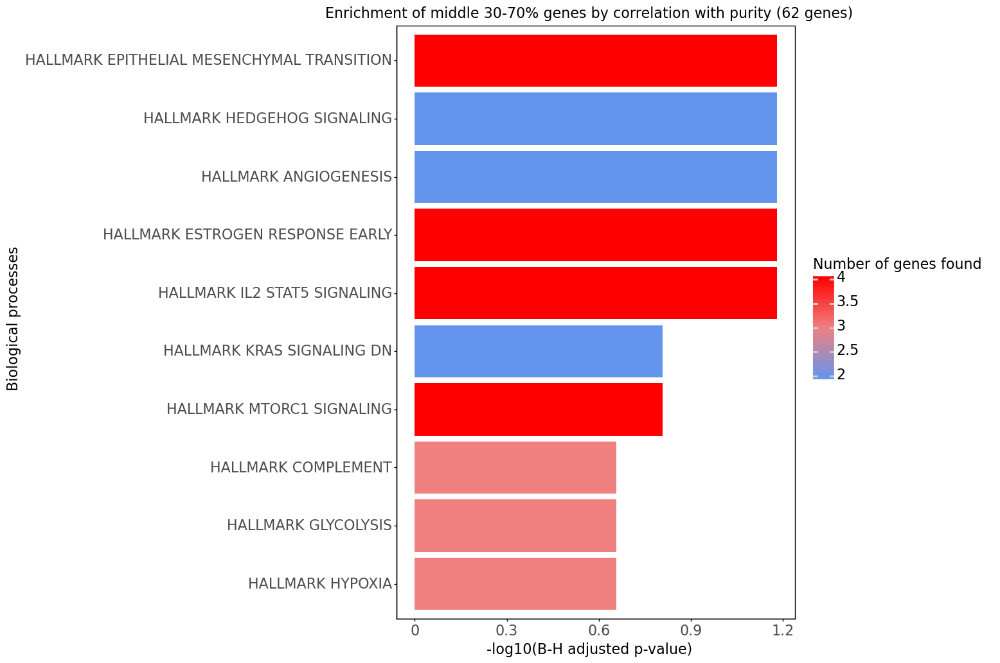

<ggplot: (8763990395838)>

In [27]:
# load the pathway analysis results precomputed with gseapy
top_pathways = pd.read_csv('../data/misc/gsea_top_10_pathways_middle30-70.csv', index_col=0)

p = (ggplot(top_pathways)
    + geom_bar(aes(x='Term', y='-log10(P-value)', fill='Number of genes found'),
               stat='identity', 
               position=position_dodge())
    + coord_flip()
    + labs(y='-log10(B-H adjusted p-value)', x="Biological processes", 
          title = 'Enrichment of middle 30-70% genes by correlation with purity (62 genes)'
          )
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=16), 
            figure_size=(8, 12))
    + scale_fill_gradientn(colors=('cornflowerblue', 'lightcoral', 'red'))
    + scale_x_discrete(limits=top_pathways["Term"][::-1])
)

# p.save('../plots/supplementary/S3d.pdf')
p

### Supp. Fig. S4: Raw data of purity predictions of PUREE across 20 cancer types from TCGA
Change 'set_type' parameter to build different plots

#### a) Train

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 16 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S4a.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3

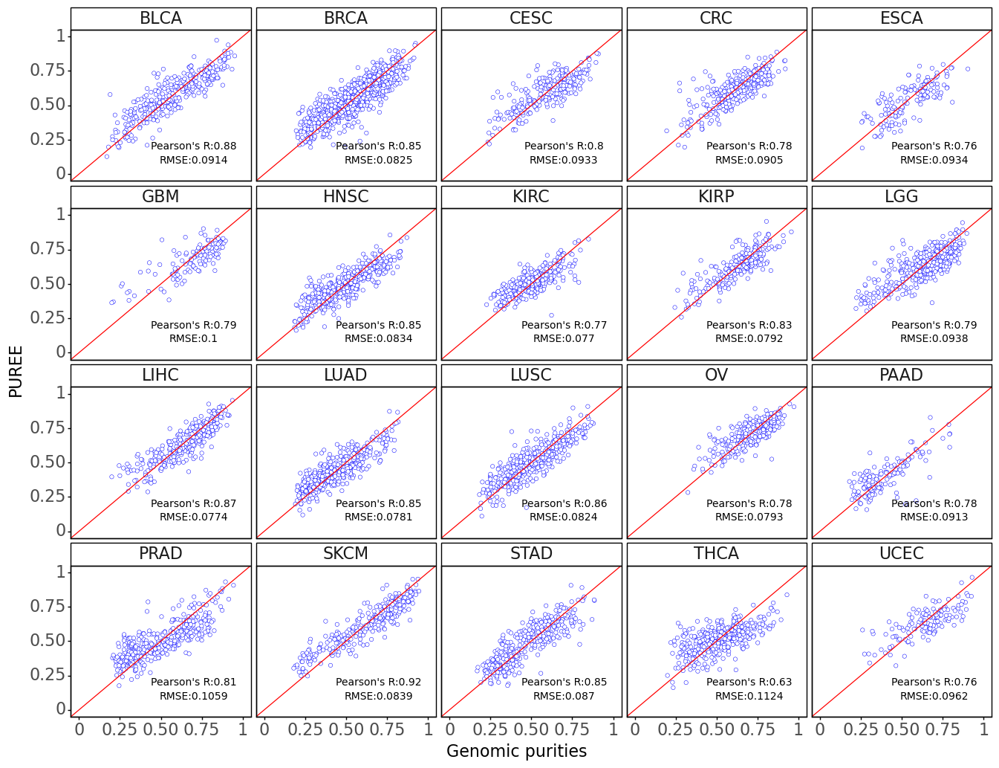

<ggplot: (8792873109730)>

In [223]:
FONT_SIZE = 12
plt.rcParams.update({'font.size': FONT_SIZE})

prediction_method = 'PUREE'
comparison_method = 'consensus'
set_type = 'train' #

# loading data
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
absolute_pur = pd.read_csv("../data/purities/TCGA_8K/ABSOLUTE_purities.tsv", sep='\t')
estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
consensus_df = (pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
                .rename({'purity':'consensus'}, axis=1))

feature_set = 'wf'
model_name = 'LinearRegression'


predicted_pur = pd.read_csv('../data/purities/TCGA_8K/model_tests/full/purities_{0}_full_linear-rt_chrom_filt.csv'.format(feature_set), 
                            index_col=[0,1]).loc[set_type, [model_name]]

predicted_pur.columns = ['PUREE']

predicted_pur.loc[predicted_pur[(predicted_pur > 1).PUREE].index] = 1
predicted_pur.loc[predicted_pur[(predicted_pur < 0).PUREE].index] = 0

all_pur_df = (predicted_pur
                  .join(consensus_df) #!
                  .dropna()
                  .join(types_df)
                  .sort_values('type'))


# preparing data

all_pur_df_melted = all_pur_df.melt(id_vars=['type', prediction_method])
all_pur_df_melted.rename({'variable':'method', 'value':comparison_method}, 
                         axis=1, inplace=True)

## plotting
# decorations

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 4)
    return ("Pearson's R:{0}".format(p_r), "RMSE:{0}".format(rmse))

metrics_df = all_pur_df_melted.groupby('type').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

# plot
p = (ggplot(all_pur_df_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.2)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('type')
    + geom_text(aes(x = 0.7, y = 0.2, label = 'corr'), data = metrics_df, size = 10)
    + geom_text(aes(x = 0.7, y = 0.1, label = 'rmse'), data = metrics_df, size = 10)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text=element_text(size=16),
            figure_size=(16,12))
    + labs(x='Genomic purities'
    )
)

# p.save('../plots/supplementary/S4a.pdf')
p

#### b) Test

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 16 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S4b.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3

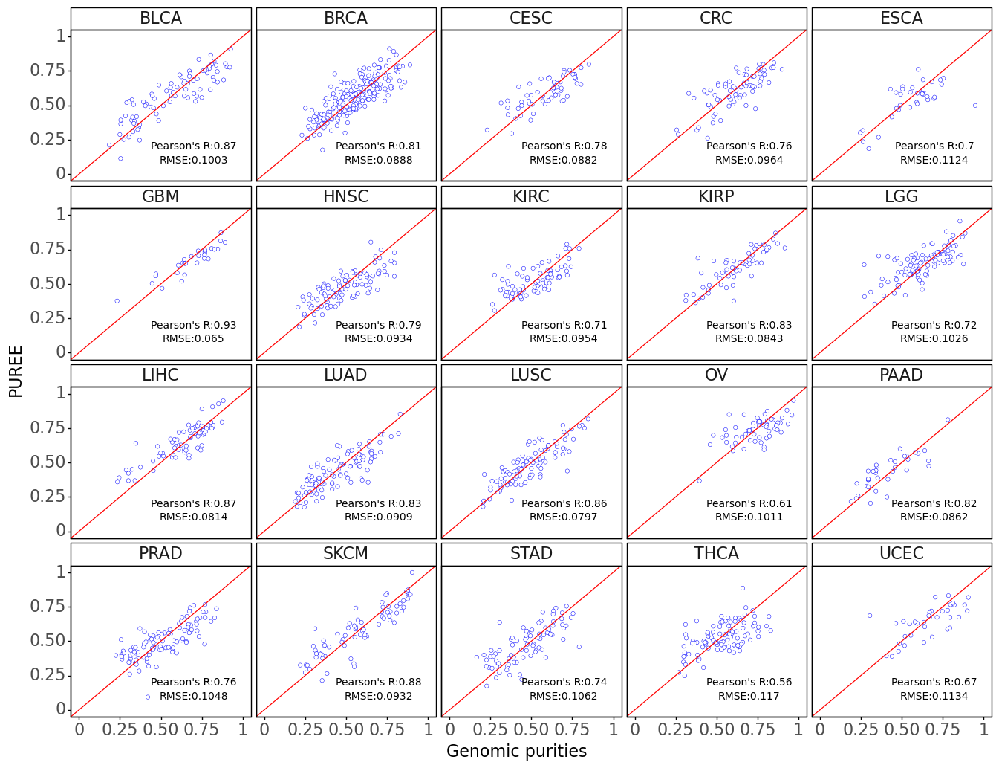

<ggplot: (8792874188538)>

In [224]:
FONT_SIZE = 12
plt.rcParams.update({'font.size': FONT_SIZE})

prediction_method = 'PUREE'
comparison_method = 'consensus'
set_type = 'test' #

# loading data
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
absolute_pur = pd.read_csv("../data/purities/TCGA_8K/ABSOLUTE_purities.tsv", sep='\t')
estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
consensus_df = (pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
                .rename({'purity':'consensus'}, axis=1))

feature_set = 'wf'
model_name = 'LinearRegression'


predicted_pur = pd.read_csv('../data/purities/TCGA_8K/model_tests/full/purities_{0}_full_linear-rt_chrom_filt.csv'.format(feature_set), 
                            index_col=[0,1]).loc[set_type, [model_name]]

predicted_pur.columns = ['PUREE']

predicted_pur.loc[predicted_pur[(predicted_pur > 1).PUREE].index] = 1
predicted_pur.loc[predicted_pur[(predicted_pur < 0).PUREE].index] = 0

all_pur_df = (predicted_pur
                  .join(consensus_df) #!
                  .dropna()
                  .join(types_df)
                  .sort_values('type'))


# preparing data

all_pur_df_melted = all_pur_df.melt(id_vars=['type', prediction_method])
all_pur_df_melted.rename({'variable':'method', 'value':comparison_method}, 
                         axis=1, inplace=True)

## plotting
# decorations

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 4)
    return ("Pearson's R:{0}".format(p_r), "RMSE:{0}".format(rmse))

metrics_df = all_pur_df_melted.groupby('type').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

# plot
p = (ggplot(all_pur_df_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.2)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('type')
    + geom_text(aes(x = 0.7, y = 0.2, label = 'corr'), data = metrics_df, size = 10)
    + geom_text(aes(x = 0.7, y = 0.1, label = 'rmse'), data = metrics_df, size = 10)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text=element_text(size=16),
            figure_size=(16,12))
    + labs(x='Genomic purities'
    )
)

# p.save('../plots/supplementary/S4b.pdf')
p

### Supp. Fig. S5: Raw data of purity predictions of cancer-specific models, PUREE and ESTIMATE across 20 cancer types from TCGA
Change the 'selected_set' parameter to build the plot for different TCGA splits

#### Train

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 16 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S5a.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3

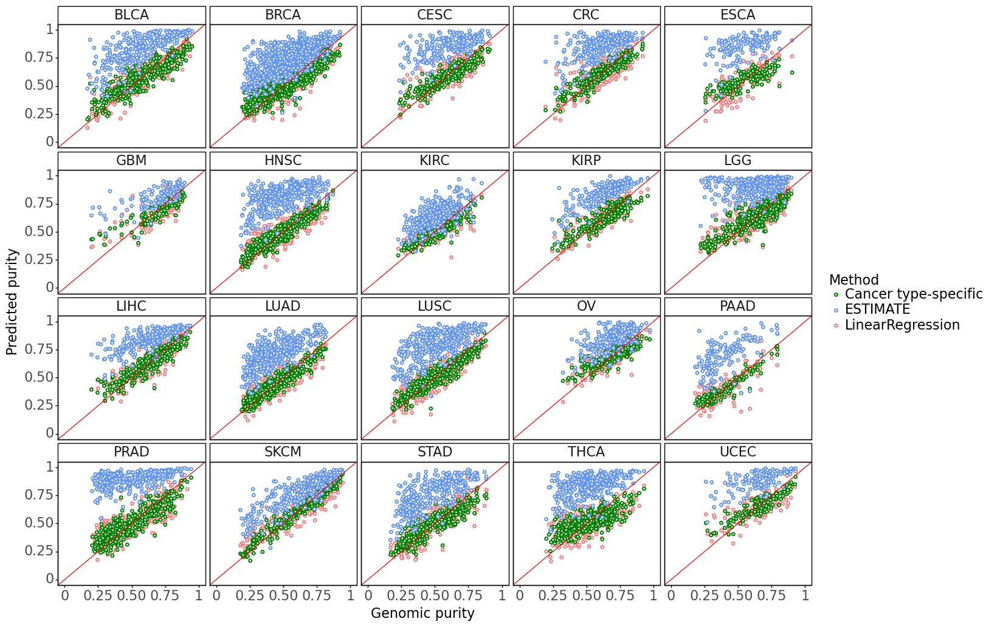

<ggplot: (8792872121438)>

In [228]:
model_name = 'LinearRegression'
ctype_model_name = 'LassoCV'
feature_set = '20k_tpmf_full_linear-rt_chrom_filt'
selected_set = 'train'

## reading results for cancer-specific models 
### loading the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/subtyped/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)

# pancancer/PUREE

purity_df_pancan = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/purities_wf_full_linear-rt_chrom_filt.csv', index_col=[0,1])
    .loc[selected_set, [model_name]])
selected_idx = purity_df_pancan.index

# cancer-specific
results_ctype = dict()
for file in os.listdir(purities_save_path):
    if feature_set in file:
        res = pd.read_csv(purities_save_path + file, index_col=[0,1])
        ctype = re.split('_|\\.', file)[-2]
        results_ctype[ctype] = res
        
purity_df_ctype = pd.concat(results_ctype, axis=0).droplevel(0, axis=0).loc[selected_set, :]
purity_df_ctype.columns = ['Cancer type-specific']

estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')

# preparing data

all_pur_df = (consensus_df.loc[selected_idx, :].join(types_df)
              .join(purity_df_pancan)
              .join(purity_df_ctype)
              .join(estimate_pur))

all_pur_df_melted = all_pur_df.melt(id_vars=['type', 'purity'])
all_pur_df_melted.rename({'variable':'method', 'value':'predicted purity', 'purity':'consensus purity'}, 
                         axis=1, inplace=True)

# plots

cat_dtype = CategoricalDtype(np.sort(all_pur_df_melted['method'].unique()), ordered=True)
all_pur_df_melted['method'] = all_pur_df_melted['method'].astype(cat_dtype)

all_pur_df_melted.method = all_pur_df_melted.method.replace({'LassoCV':'PUREE'})

p = (ggplot(all_pur_df_melted, aes('consensus purity', 'predicted purity'))
    + geom_point(aes(color='method'), fill='white', size=1.2, stroke=0.8, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('type')
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=16),
            figure_size=(16,12))
    + labs(
        x = 'Genomic purity',
        y = 'Predicted purity',
        color = 'Method'
    )
    + scale_color_manual(values=["green", "cornflowerblue", "lightcoral"])
)

# p.save('../plots/supplementary/S5a.pdf')
p

#### Test

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 16 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S5b.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3

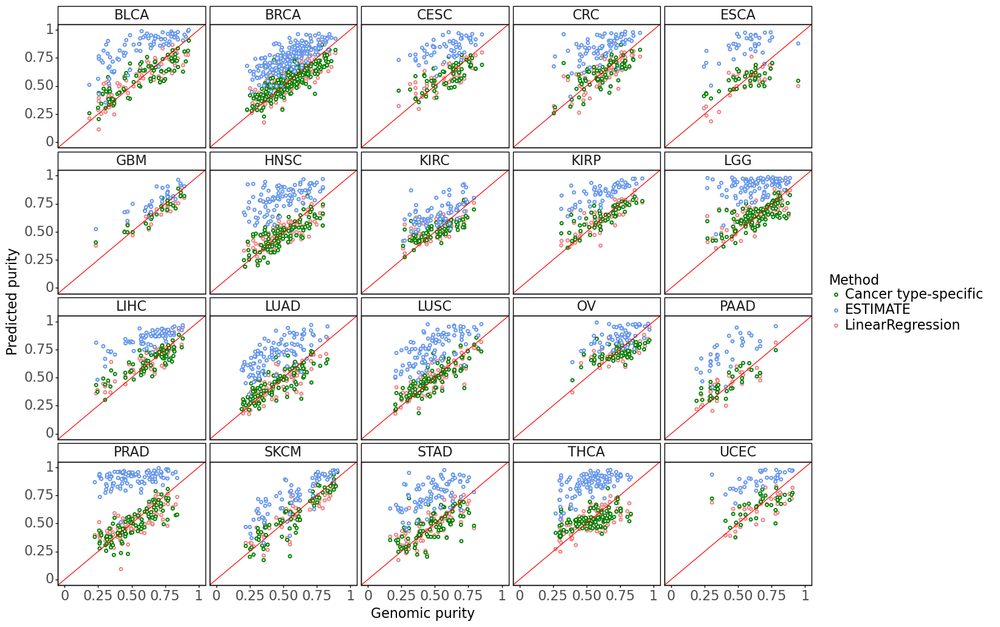

<ggplot: (8792876068681)>

In [229]:
model_name = 'LinearRegression'
ctype_model_name = 'LassoCV'
feature_set = '20k_tpmf_full_linear-rt_chrom_filt'
selected_set = 'test'

## reading results for cancer-specific models 
### loading the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/subtyped/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)

# pancancer/PUREE

purity_df_pancan = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/purities_wf_full_linear-rt_chrom_filt.csv', index_col=[0,1])
    .loc[selected_set, [model_name]])
selected_idx = purity_df_pancan.index

# cancer-specific
results_ctype = dict()
for file in os.listdir(purities_save_path):
    if feature_set in file:
        res = pd.read_csv(purities_save_path + file, index_col=[0,1])
        ctype = re.split('_|\\.', file)[-2]
        results_ctype[ctype] = res
        
purity_df_ctype = pd.concat(results_ctype, axis=0).droplevel(0, axis=0).loc[selected_set, :]
purity_df_ctype.columns = ['Cancer type-specific']

estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')

# preparing data

all_pur_df = (consensus_df.loc[selected_idx, :].join(types_df)
              .join(purity_df_pancan)
              .join(purity_df_ctype)
              .join(estimate_pur))

all_pur_df_melted = all_pur_df.melt(id_vars=['type', 'purity'])
all_pur_df_melted.rename({'variable':'method', 'value':'predicted purity', 'purity':'consensus purity'}, 
                         axis=1, inplace=True)

# plots

cat_dtype = CategoricalDtype(np.sort(all_pur_df_melted['method'].unique()), ordered=True)
all_pur_df_melted['method'] = all_pur_df_melted['method'].astype(cat_dtype)

all_pur_df_melted.method = all_pur_df_melted.method.replace({'LassoCV':'PUREE'})

p = (ggplot(all_pur_df_melted, aes('consensus purity', 'predicted purity'))
    + geom_point(aes(color='method'), fill='white', size=1.2, stroke=0.8, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('type')
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=16),
            figure_size=(16,12))
    + labs(
        x = 'Genomic purity',
        y = 'Predicted purity',
        color = 'Method'
    )
    + scale_color_manual(values=["green", "cornflowerblue", "lightcoral"])
)

# p.save('../plots/supplementary/S5b.pdf')
p

### Supp. Fig. S6: delta(Cancer specific, Pancancer), scatterplot

x-axis is cancer-type-specific correlation MINUS pan-cancer correlation. y-axis is RMSE. Or maybe there is a smarter way to show this. But point is, the cancer types that are easier to predict with pan-cancer model will show up in one quadrant of the plot, and those that are easier with cancer-type specific will show up in the other quadrant.

"In general, we observe no systematic difference between the accuracy of the pan-cancer and cancer-specific models. For some cancer types the pan-cancer model is better (e.g. STAD), for other cancer types the cancer-specific model is better (e.g. SKCM). To further address the reviewers comment, we have highlighted cancer types that have better performance with the cancer-type specific and pan-cancer models, respectively, in a new supplementary figure (Figure SX)."

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 16 x 16 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S6.pdf


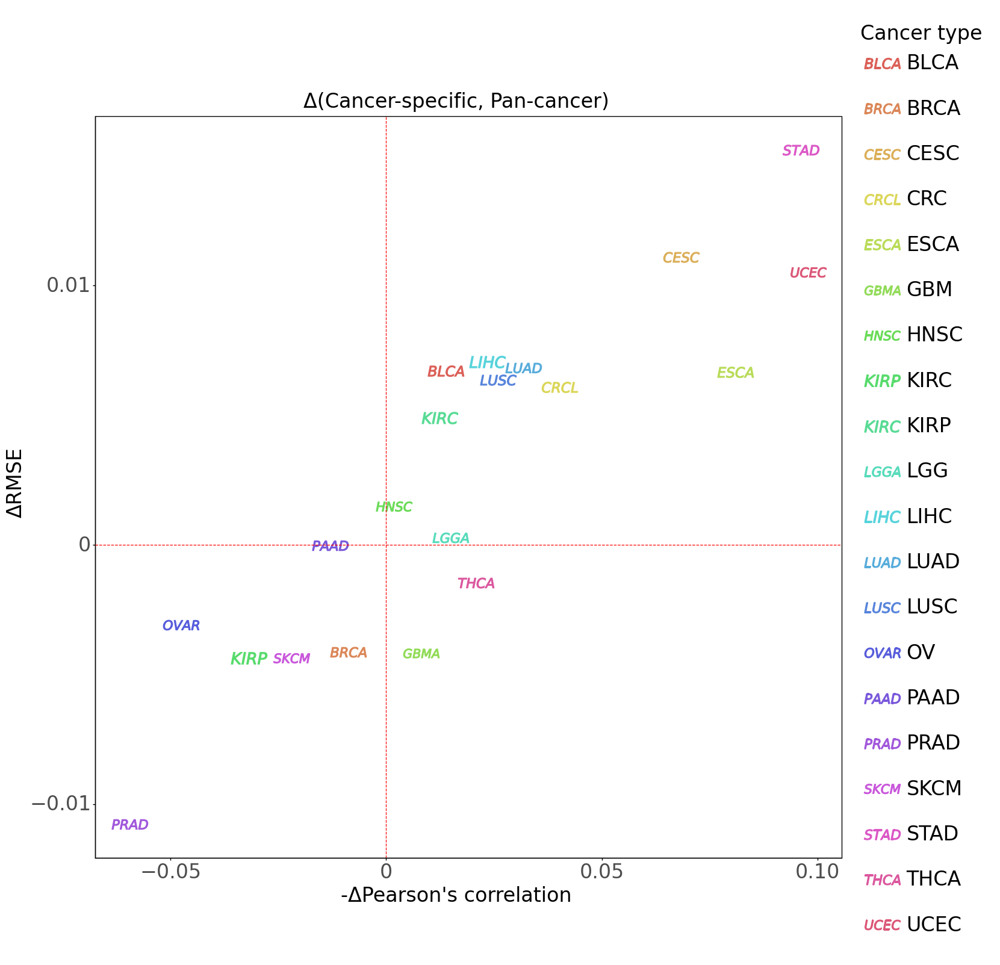

<ggplot: (8792870766430)>

In [234]:
metric_name = 'correlation' # change this to 'rmse' for rmse plots
set_type = 'test' # change this to 'test' for test plots

model_name = 'LinearRegression'
ctype_model_name = 'LassoCV'
feature_set = '20k_tpmf_full_linear-rt' # use all available features for cancer-specific models

## reading results for cancer-specific models 
### loading the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/subtyped/"

results_ctype = dict()
consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df['type'])

for file in os.listdir(purities_save_path):
    if feature_set in file:
        res = pd.read_csv(purities_save_path + file, index_col=[0,1])
        ctype = re.split('_|\\.', file)[-2]
        results_ctype[ctype] = res
        
# cancer-specific
purity_df_ctype = pd.concat(results_ctype, axis=0).droplevel(0, axis=0).loc[set_type, :]

# pancancer
purity_df_pancan = pd.read_csv('../data/purities/TCGA_8K/model_tests/full/purities_wf_full_linear-rt_chrom_filt.csv', index_col=[0,1]).loc['test', [model_name]]

metric_name = 'correlation'
### preparing ctype results
metric_t_ctype = calculate_average_by_type(purity_df_ctype, consensus_df, types_df, metric_name=metric_name).sort_values('type')
metric_t_ctype['model_type'] = 'cancer-type-specific'

### preparing pancancer results
metric_t_pancan = calculate_average_by_type(purity_df_pancan, consensus_df, types_df, metric_name=metric_name)
metric_t_pancan = metric_t_pancan.loc[metric_t_pancan.index == model_name, :].sort_values('type')
metric_t_pancan['model_type'] = 'pancancer'

# ctype-pancan delta
corr_delta_df = pd.DataFrame(metric_t_ctype.sort_values(by='type')[metric_name].values 
                 - metric_t_pancan.sort_values(by='type')[metric_name].values, 
                        index=metric_t_pancan.sort_values(by='type')['type'].values).rename({0:'corr_delta'}, axis=1)

metric_name = 'rmse'
### preparing ctype results
metric_t_ctype = calculate_average_by_type(purity_df_ctype, consensus_df, types_df, metric_name=metric_name).sort_values('type')
metric_t_ctype['model_type'] = 'cancer-type-specific'

### preparing pancancer results
metric_t_pancan = calculate_average_by_type(purity_df_pancan, consensus_df, types_df, metric_name=metric_name)
metric_t_pancan = metric_t_pancan.loc[metric_t_pancan.index == model_name, :].sort_values('type')
metric_t_pancan['model_type'] = 'pancancer'

# ctype-pancan delta
rmse_delta_df = pd.DataFrame(metric_t_ctype.sort_values(by='type')[metric_name].values 
                 - metric_t_pancan.sort_values(by='type')[metric_name].values, 
                        index=metric_t_pancan.sort_values(by='type')['type'].values).rename({0:'rmse_delta'}, axis=1)

shapes = ["$BLCA$", "$BRCA$", "$CESC$", "$CRCL$", "$ESCA$", "$GBMA$", 
          "$HNSC$", "$KIRP$", "$KIRC$", "$LGGA$", "$LIHC$", "$LUAD$", "$LUSC$",
         "$OVAR$", "$PAAD$", "$PRAD$", "$SKCM$", "$STAD$", "$THCA$", "$UCEC$"]

df = corr_delta_df.join(rmse_delta_df)
df['rmse_delta_neg'] = -df['rmse_delta']
df['corr_delta_neg'] = -df['corr_delta']

p = (ggplot(df, aes(x='corr_delta_neg', y='rmse_delta'))
      + geom_point(aes(color=df.index, shape=df.index), size=24)
      + geom_vline(xintercept=0, color='red', linetype='dashed')
     + geom_hline(yintercept=0, color='red', linetype='dashed')
     + scale_shape_manual(name='Cancer type', values=shapes)
#      + scale_y_reverse()
     + theme_classic()
     + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(16, 16))
     + labs(title='\u0394(Cancer-specific, Pan-cancer)', x="-\u0394Pearson's correlation", 
            y='\u0394RMSE', color='Cancer type')
)

# p.save('../plots/supplementary/S6.pdf')
p

### Supp. Fig. S7: One cancer type excluded test

#### Correlation

##### a) Boxplots of average metrics per feature set

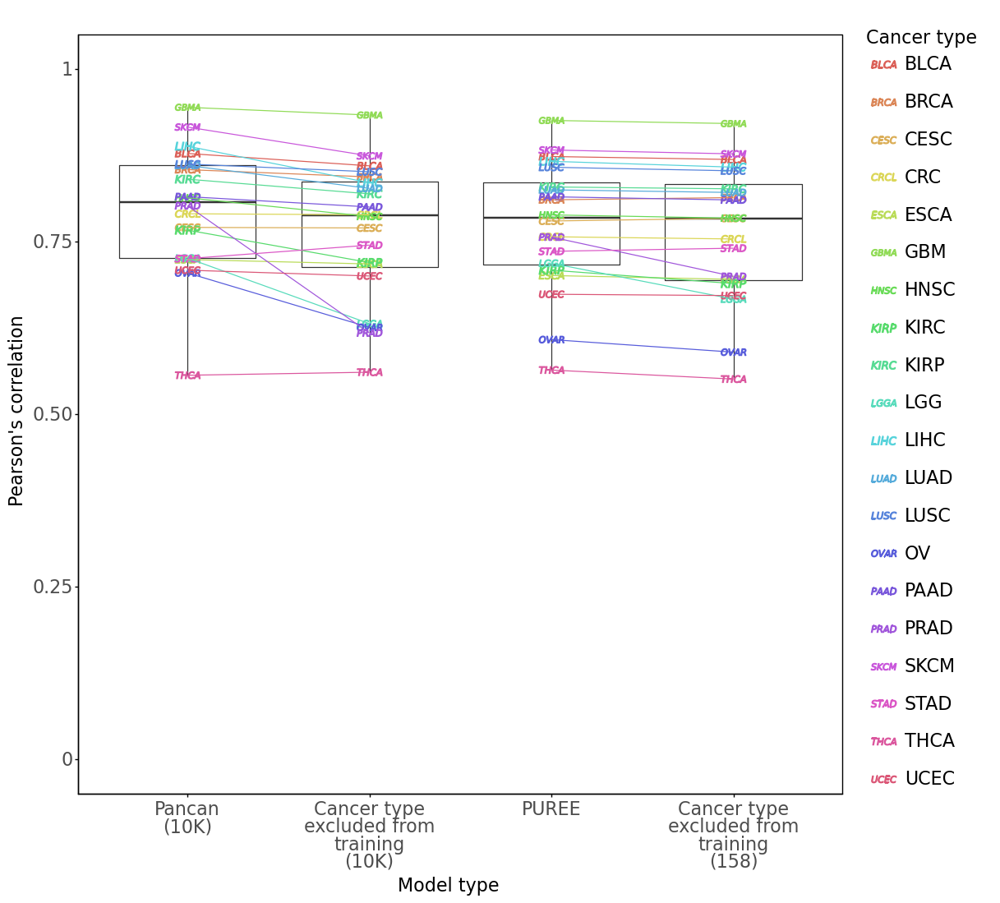

<ggplot: (8792871109307)>

In [244]:
metric_name = metric_type = 'correlation'

## 20k log-rt
import re

experiment_type = 'one_ctype_out'
model_name = 'LassoCV'
feature_set = '20k_tpmf_full_linear-rt_chrom_filt'
data_type = 'full'
# load the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/{0}/{1}/".format(experiment_type, model_name)
set_type = 'test'

results_one_out = dict()
consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)

paths = [file for file in os.listdir(purities_save_path) if (feature_set in file) and (data_type in file)]

for file in paths:
    res = pd.read_csv(purities_save_path + file, index_col=[0,1])
    ctype = re.split('_|\\.', file)[-2]
    results_one_out[ctype] = res

# pancancer
purity_df_pancan = pd.read_csv('../data//purities/TCGA_8K/model_tests/full/purities_20k_tpmf_full_linear-rt_chrom_filt.csv', 
                               index_col=[0,1]).loc[set_type, [model_name]].join(types_data)

purity_df_lasso_all_ctypes_20k = purity_df_pancan.copy().drop('type', axis=1) # not needed here, but used later
purity_df_lasso_all_ctypes_20k.columns = [model_name + '_' + feature_set + '_' + 'all_ctypes']

metric_name = metric_name

### preparing ctype results
purity_one_out_frames = []
purity_pancan_frames = []
purity_one_out_df_frames = []

test_index = purity_df_pancan.index

for ctype in set(types_df.type):
    # CURRENT VERSION: OO is tested on test subset of ctype samples
    temp_oo = results_one_out[ctype].loc[set_type, :]
    temp_oo = temp_oo.loc[np.intersect1d(temp_oo.index, test_index), :] #!
    purity_one_out_df_frames.append(temp_oo)
    
    # PANCAN IS TESTED ON the test subset of ctype samples
    temp_pancan = purity_df_pancan.loc[purity_df_pancan.type == ctype, :]
    
    purity_one_out_tempdf = calculate_average(temp_oo.loc[
        temp_oo.join(types_df).type == ctype, :], consensus_df, metric_name)
    purity_pancan_tempdf = calculate_average(temp_pancan, consensus_df, metric_name)
    
    purity_one_out_tempdf['type'] = ctype
    purity_pancan_tempdf['type'] = ctype
    
    purity_one_out_frames.append(purity_one_out_tempdf)
    purity_pancan_frames.append(purity_pancan_tempdf)

# one-type-out results
metric_t_one_out = pd.concat(purity_one_out_frames)
metric_t_one_out['model_type'] = 'one_ctype_out'

# not used here, but needed for scatterplots later
purity_df_lasso_octp_out_20k = pd.concat(purity_one_out_df_frames)
purity_df_lasso_octp_out_20k.columns = [model_name + '_' + feature_set + '_' + 'one_out']

# pancan results
metric_t_pancan = pd.concat(purity_pancan_frames)
metric_t_pancan = metric_t_pancan.loc[metric_t_pancan.index == model_name, :]
metric_t_pancan['model_type'] = 'pancan'

metric_t = pd.concat([metric_t_pancan, metric_t_one_out])
metric_t['training_mode'] = metric_t.model_type # for connected barplots later
metric_t.model_type = metric_t.model_type.map(lambda x: x+'_{0}_{1}'.format(model_name, feature_set))

### used later, in "several models - 1 plot"
metric_t_20k_lassocv = metric_t.copy()


import re

experiment_type = 'one_ctype_out'
model_name = 'LinearRegression'
pancan_model_name = model_name
feature_set = 'wf_full_linear-rt_chrom_filt'
data_type = 'full'
# load the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/{0}/{1}/".format(experiment_type, model_name)
set_type = 'test'

results_one_out = dict()
consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)

paths = [file for file in os.listdir(purities_save_path) if (feature_set in file) and (data_type in file)]

for file in paths:
    res = pd.read_csv(purities_save_path + file, index_col=[0,1])
    ctype = re.split('_|\\.', file)[-2]
    results_one_out[ctype] = res
    
# pancancer
purity_df_pancan = pd.read_csv('../data//purities/TCGA_8K/model_tests/full/purities_wf_full_linear-rt_chrom_filt.csv', 
                               index_col=[0,1]).loc[set_type, [pancan_model_name]].join(types_data)

metric_name = metric_name
purity_df_ls_all_ctypes = purity_df_pancan.copy().drop('type', axis=1) # not needed here, but used later
purity_df_ls_all_ctypes.columns = [model_name + '_' + feature_set + '_' + 'all_ctypes']

### preparing ctype results
purity_one_out_frames = []
purity_pancan_frames = []

purity_one_out_df_frames = [] # needed for plots later

test_index = purity_df_pancan.index

for ctype in set(types_df.type):
    # CURRENT VERSION: OO is tested on test subset of ctype samples
    temp_oo = results_one_out[ctype].loc[set_type, :]
    temp_oo = temp_oo.loc[np.intersect1d(temp_oo.index, test_index), :] #!
    purity_one_out_df_frames.append(temp_oo)
    
    # PANCAN IS TESTED ON the test subset of ctype samples
    temp_pancan = purity_df_pancan.loc[purity_df_pancan.type == ctype, :]
    
    purity_one_out_tempdf = calculate_average(temp_oo.loc[
        temp_oo.join(types_df).type == ctype, :], consensus_df, metric_name)
    purity_pancan_tempdf = calculate_average(temp_pancan, consensus_df, metric_name)
    
    purity_one_out_tempdf['type'] = ctype
    purity_pancan_tempdf['type'] = ctype
    
    purity_one_out_frames.append(purity_one_out_tempdf)
    purity_pancan_frames.append(purity_pancan_tempdf)

# one-type-out results
metric_t_one_out = pd.concat(purity_one_out_frames)
metric_t_one_out['model_type'] = 'one_ctype_out'

# not used here, but needed for scatterplots later
purity_df_ls_octp_out = pd.concat(purity_one_out_df_frames)
purity_df_ls_octp_out.columns = [model_name + '_' + feature_set + '_' + 'one_out']

# pancan results
metric_t_pancan = pd.concat(purity_pancan_frames)
metric_t_pancan = metric_t_pancan.loc[metric_t_pancan.index == pancan_model_name, :] ###!!! don't forget model name
metric_t_pancan['model_type'] = 'pancan'

metric_t = pd.concat([metric_t_pancan, metric_t_one_out])
metric_t['training_mode'] = metric_t.model_type # for connected barplots later
metric_t.model_type = metric_t.model_type.map(lambda x: x+'_{0}_{1}'.format(model_name, feature_set))

### used later, in "several models - 1 plot"
metric_t_eqst_lassocv = metric_t.copy()

### plot building ###
metric_t_20k_lassocv_mod = metric_t_20k_lassocv.copy()
metric_t_20k_lassocv_mod['training_mode_ct'] = metric_t_20k_lassocv_mod['type'] + '_' + metric_t_20k_lassocv_mod['training_mode']
metric_t_20k_lassocv_mod['training_mode_fs'] = metric_t_20k_lassocv_mod['training_mode'] + '_10000'
metric_t_20k_lassocv_mod['type_feature_set'] = metric_t_20k_lassocv_mod['type'] + '_10000'

metric_t_eqst_lassocv_mod = metric_t_eqst_lassocv.copy()
metric_t_eqst_lassocv_mod['training_mode_ct'] = metric_t_eqst_lassocv_mod['type'] + '_' + metric_t_eqst_lassocv_mod['training_mode']
metric_t_eqst_lassocv_mod['training_mode_fs'] = metric_t_eqst_lassocv_mod['training_mode'] + '_reduced'
metric_t_eqst_lassocv_mod['type_feature_set'] = metric_t_eqst_lassocv_mod['type'] + '_reduced'

metric_all = pd.concat([metric_t_20k_lassocv_mod, 
                        metric_t_eqst_lassocv_mod
                       ])

_, pval_full_170 = stats.wilcoxon(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name], 
                              metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name])
median_delta_170 = np.abs(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'][metric_name].median() - 
        metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median())

_, pval_full_pancan = stats.wilcoxon(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name], 
                              metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name])
mean_delta_pancan = np.mean(np.abs((metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name] - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name])))
median_delta_pancan = np.abs(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'][metric_name].median() - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'][metric_name].median())

_, pval_full_10k = stats.wilcoxon(metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name], 
                              metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name])
median_delta_10k = np.abs(metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'][metric_name].median() - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median())

_, pval_full_octo = stats.wilcoxon(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name], 
                              metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name])
median_delta_octo = np.abs(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median() - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median())

x_order = [
    'pancan_10000',  
    'one_ctype_out_10000',
    'pancan_reduced',
    'one_ctype_out_reduced',
          ]

shapes = ["$BLCA$", "$BRCA$", "$CESC$", "$CRCL$", "$ESCA$", "$GBMA$", 
          "$HNSC$", "$KIRP$", "$KIRC$", "$LGGA$", "$LIHC$", "$LUAD$", "$LUSC$",
         "$OVAR$", "$PAAD$", "$PRAD$", "$SKCM$", "$STAD$", "$THCA$", "$UCEC$"]

p = (ggplot(metric_all, aes(x='training_mode_fs', y=metric_name))
     + geom_boxplot(outlier_shape='')
     + geom_point(aes(color='type', shape='type'), size=12)
     + geom_line(aes(group='type_feature_set', color='type'), show_legend=False)
     + theme_classic()
     + theme(panel_border=element_rect(), 
             text = element_text(size=16),
           figure_size=(12, 12))
     + ylim(0, 1) # correlation
     + labs(y='{0}'.format("Pearson's correlation"), 
            x='Model type',
            color='Cancer type')
     + scale_x_discrete(limits=x_order,
                       labels=[
                           'Pancan\n(10K)', 
                           'Cancer type\nexcluded from\ntraining\n(10K)',
                           'PUREE',
                           'Cancer type\nexcluded from\ntraining\n(158)'
                              ])
     + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S7a_corr.pdf')
p

##### b) Boxplots of deltas for different feature sets
Run the previous cell first

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S7b_corr.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms

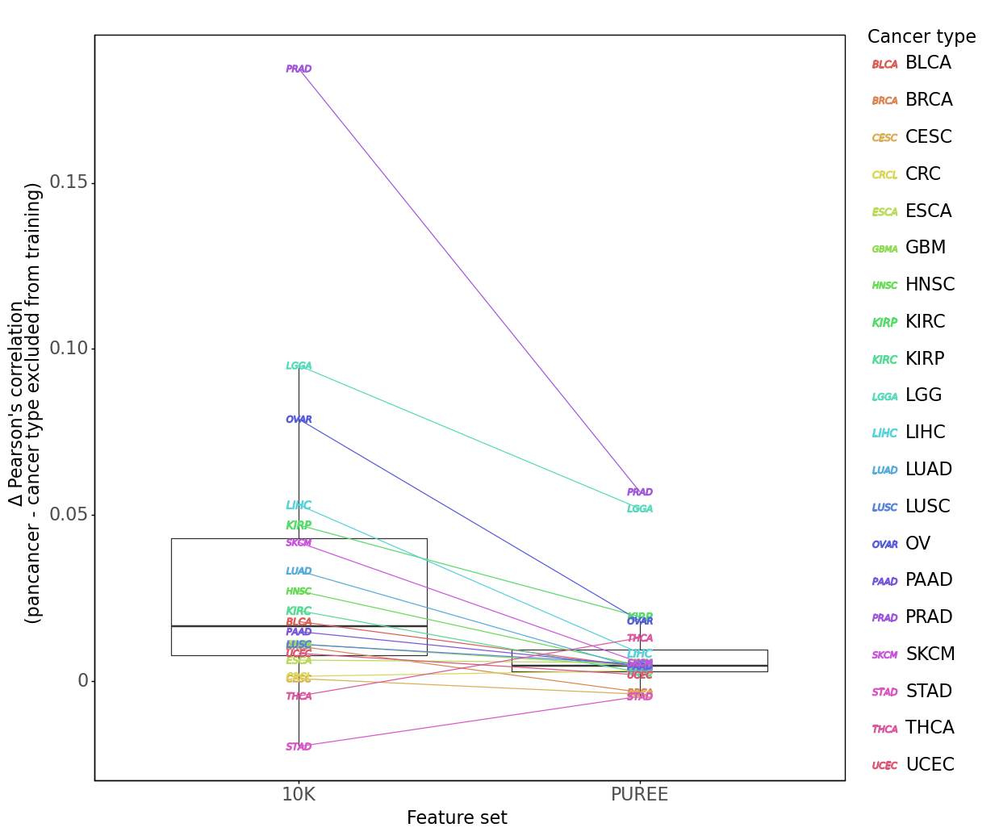

<ggplot: (8792879160932)>

In [241]:
metric_t_20k_lassocv_mod = metric_t_20k_lassocv.copy()
metric_t_20k_lassocv_mod['training_mode_ct'] = metric_t_20k_lassocv_mod['type'] + '_' + metric_t_20k_lassocv_mod['training_mode']
metric_t_20k_lassocv_mod['training_mode_fs'] = metric_t_20k_lassocv_mod['training_mode'] + '_10000'
metric_t_20k_lassocv_mod['type_feature_set'] = metric_t_20k_lassocv_mod['type'] + '_10000'

metric_t_eqst_lassocv_mod = metric_t_eqst_lassocv.copy()
metric_t_eqst_lassocv_mod['training_mode_ct'] = metric_t_eqst_lassocv_mod['type'] + '_' + metric_t_eqst_lassocv_mod['training_mode']
metric_t_eqst_lassocv_mod['training_mode_fs'] = metric_t_eqst_lassocv_mod['training_mode'] + '_170'
metric_t_eqst_lassocv_mod['type_feature_set'] = metric_t_eqst_lassocv_mod['type'] + '_170'

metric_all = pd.concat([metric_t_20k_lassocv_mod, 
                        metric_t_eqst_lassocv_mod
                       ])

pancan_10k = (metric_t_20k_lassocv_mod.loc[[
    'pancan' in x for x in metric_t_20k_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))
octo_10k = (metric_t_20k_lassocv_mod.loc[[
    'one_ctype_out' in x for x in metric_t_20k_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))

delta_10k = pd.DataFrame(pancan_10k[metric_name] - octo_10k[metric_name])
delta_10k['type'] = pancan_10k.type
delta_10k['model_type'] = '10k'

pancan_reduced = (metric_t_eqst_lassocv_mod.loc[[
    'pancan' in x for x in metric_t_eqst_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))
octo_reduced = (metric_t_eqst_lassocv_mod.loc[[
    'one_ctype_out' in x for x in metric_t_eqst_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))
delta_reduced = pd.DataFrame(pancan_reduced[metric_name] - octo_reduced[metric_name])
delta_reduced['type'] = pancan_reduced.type
delta_reduced['model_type'] = 'reduced'

delta_df = pd.concat([delta_10k, delta_reduced])

x_order = [
    '10k',  
    'reduced'
          ]

_, pval = stats.wilcoxon(delta_10k[metric_name], delta_reduced[metric_name])

shapes = ["$BLCA$", "$BRCA$", "$CESC$", "$CRCL$", "$ESCA$", "$GBMA$", 
          "$HNSC$", "$KIRP$", "$KIRC$", "$LGGA$", "$LIHC$", "$LUAD$", "$LUSC$",
         "$OVAR$", "$PAAD$", "$PRAD$", "$SKCM$", "$STAD$", "$THCA$", "$UCEC$"]


p = (ggplot(delta_df, aes(x='model_type', y=metric_name))
     + geom_boxplot(outlier_shape='')
     + geom_line(aes(group='type', color='type'), show_legend=False)
     + geom_point(aes(color='type', shape='type'), size=12)
     + theme_classic()
     + theme(panel_border=element_rect(), 
             text = element_text(size=16),
           figure_size=(12, 12))
     + labs(y='{0}'.format("\u0394 Pearson's correlation\n(pancancer - cancer type excluded from training)"), 
            x='Feature set',
            color='Cancer type')
     + scale_x_discrete(limits=x_order,
                       labels=[
                           '10K', 
                           'PUREE'
                              ])
    + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S7b_corr.pdf')
p

#### RMSE

##### a) Boxplots of average metrics per feature set

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S7a_rmse.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


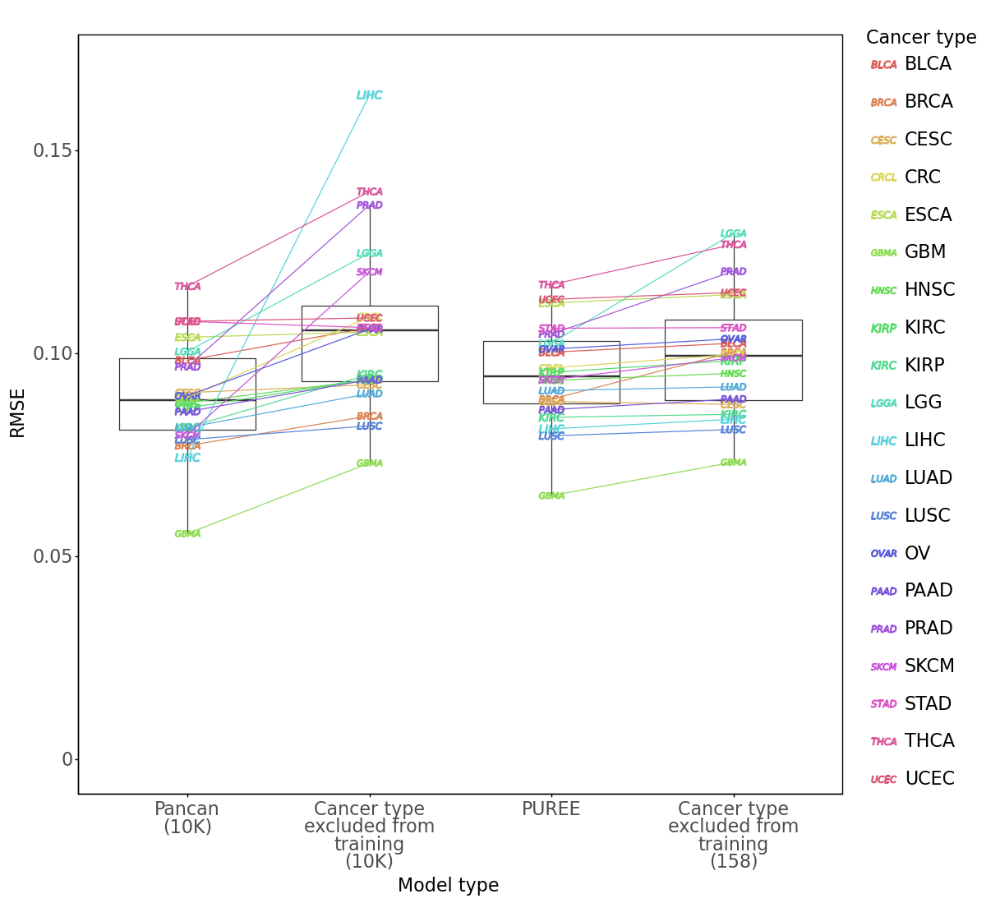

<ggplot: (8792880785863)>

In [243]:
metric_name = metric_type = 'rmse'

## 20k log-rt
import re

experiment_type = 'one_ctype_out'
model_name = 'LassoCV'
feature_set = '20k_tpmf_full_linear-rt_chrom_filt'
data_type = 'full'
# load the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/{0}/{1}/".format(experiment_type, model_name)
set_type = 'test'

results_one_out = dict()
consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)

paths = [file for file in os.listdir(purities_save_path) if (feature_set in file) and (data_type in file)]

for file in paths:
    res = pd.read_csv(purities_save_path + file, index_col=[0,1])
    ctype = re.split('_|\\.', file)[-2]
    results_one_out[ctype] = res

# pancancer
purity_df_pancan = pd.read_csv('../data//purities/TCGA_8K/model_tests/full/purities_20k_tpmf_full_linear-rt_chrom_filt.csv', 
                               index_col=[0,1]).loc[set_type, [model_name]].join(types_data)

purity_df_lasso_all_ctypes_20k = purity_df_pancan.copy().drop('type', axis=1) # not needed here, but used later
purity_df_lasso_all_ctypes_20k.columns = [model_name + '_' + feature_set + '_' + 'all_ctypes']

metric_name = metric_name

### preparing ctype results
purity_one_out_frames = []
purity_pancan_frames = []
purity_one_out_df_frames = []

test_index = purity_df_pancan.index

for ctype in set(types_df.type):
    # CURRENT VERSION: OO is tested on test subset of ctype samples
    temp_oo = results_one_out[ctype].loc[set_type, :]
    temp_oo = temp_oo.loc[np.intersect1d(temp_oo.index, test_index), :] #!
    purity_one_out_df_frames.append(temp_oo)
    
    # PANCAN IS TESTED ON the test subset of ctype samples
    temp_pancan = purity_df_pancan.loc[purity_df_pancan.type == ctype, :]
    
    purity_one_out_tempdf = calculate_average(temp_oo.loc[
        temp_oo.join(types_df).type == ctype, :], consensus_df, metric_name)
    purity_pancan_tempdf = calculate_average(temp_pancan, consensus_df, metric_name)
    
    purity_one_out_tempdf['type'] = ctype
    purity_pancan_tempdf['type'] = ctype
    
    purity_one_out_frames.append(purity_one_out_tempdf)
    purity_pancan_frames.append(purity_pancan_tempdf)

# one-type-out results
metric_t_one_out = pd.concat(purity_one_out_frames)
metric_t_one_out['model_type'] = 'one_ctype_out'

# not used here, but needed for scatterplots later
purity_df_lasso_octp_out_20k = pd.concat(purity_one_out_df_frames)
purity_df_lasso_octp_out_20k.columns = [model_name + '_' + feature_set + '_' + 'one_out']

# pancan results
metric_t_pancan = pd.concat(purity_pancan_frames)
metric_t_pancan = metric_t_pancan.loc[metric_t_pancan.index == model_name, :]
metric_t_pancan['model_type'] = 'pancan'

metric_t = pd.concat([metric_t_pancan, metric_t_one_out])
metric_t['training_mode'] = metric_t.model_type # for connected barplots later
metric_t.model_type = metric_t.model_type.map(lambda x: x+'_{0}_{1}'.format(model_name, feature_set))

### used later, in "several models - 1 plot"
metric_t_20k_lassocv = metric_t.copy()


import re

experiment_type = 'one_ctype_out'
model_name = 'LinearRegression'
pancan_model_name = model_name
feature_set = 'wf_full_linear-rt_chrom_filt'
data_type = 'full'
# load the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/{0}/{1}/".format(experiment_type, model_name)
set_type = 'test'

results_one_out = dict()
consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)

paths = [file for file in os.listdir(purities_save_path) if (feature_set in file) and (data_type in file)]

for file in paths:
    res = pd.read_csv(purities_save_path + file, index_col=[0,1])
    ctype = re.split('_|\\.', file)[-2]
    results_one_out[ctype] = res
    
# pancancer
purity_df_pancan = pd.read_csv('../data//purities/TCGA_8K/model_tests/full/purities_wf_full_linear-rt_chrom_filt.csv', 
                               index_col=[0,1]).loc[set_type, [pancan_model_name]].join(types_data)

metric_name = metric_name
purity_df_ls_all_ctypes = purity_df_pancan.copy().drop('type', axis=1) # not needed here, but used later
purity_df_ls_all_ctypes.columns = [model_name + '_' + feature_set + '_' + 'all_ctypes']

### preparing ctype results
purity_one_out_frames = []
purity_pancan_frames = []

purity_one_out_df_frames = [] # needed for plots later

test_index = purity_df_pancan.index

for ctype in set(types_df.type):
    # CURRENT VERSION: OO is tested on test subset of ctype samples
    temp_oo = results_one_out[ctype].loc[set_type, :]
    temp_oo = temp_oo.loc[np.intersect1d(temp_oo.index, test_index), :] #!
    purity_one_out_df_frames.append(temp_oo)
    
    # PANCAN IS TESTED ON the test subset of ctype samples
    temp_pancan = purity_df_pancan.loc[purity_df_pancan.type == ctype, :]
    
    purity_one_out_tempdf = calculate_average(temp_oo.loc[
        temp_oo.join(types_df).type == ctype, :], consensus_df, metric_name)
    purity_pancan_tempdf = calculate_average(temp_pancan, consensus_df, metric_name)
    
    purity_one_out_tempdf['type'] = ctype
    purity_pancan_tempdf['type'] = ctype
    
    purity_one_out_frames.append(purity_one_out_tempdf)
    purity_pancan_frames.append(purity_pancan_tempdf)

# one-type-out results
metric_t_one_out = pd.concat(purity_one_out_frames)
metric_t_one_out['model_type'] = 'one_ctype_out'

# not used here, but needed for scatterplots later
purity_df_ls_octp_out = pd.concat(purity_one_out_df_frames)
purity_df_ls_octp_out.columns = [model_name + '_' + feature_set + '_' + 'one_out']

# pancan results
metric_t_pancan = pd.concat(purity_pancan_frames)
metric_t_pancan = metric_t_pancan.loc[metric_t_pancan.index == pancan_model_name, :] ###!!! don't forget model name
metric_t_pancan['model_type'] = 'pancan'

metric_t = pd.concat([metric_t_pancan, metric_t_one_out])
metric_t['training_mode'] = metric_t.model_type # for connected barplots later
metric_t.model_type = metric_t.model_type.map(lambda x: x+'_{0}_{1}'.format(model_name, feature_set))

### used later, in "several models - 1 plot"
metric_t_eqst_lassocv = metric_t.copy()


### plot building ###
metric_t_20k_lassocv_mod = metric_t_20k_lassocv.copy()
metric_t_20k_lassocv_mod['training_mode_ct'] = metric_t_20k_lassocv_mod['type'] + '_' + metric_t_20k_lassocv_mod['training_mode']
metric_t_20k_lassocv_mod['training_mode_fs'] = metric_t_20k_lassocv_mod['training_mode'] + '_10000'
metric_t_20k_lassocv_mod['type_feature_set'] = metric_t_20k_lassocv_mod['type'] + '_10000'

metric_t_eqst_lassocv_mod = metric_t_eqst_lassocv.copy()
metric_t_eqst_lassocv_mod['training_mode_ct'] = metric_t_eqst_lassocv_mod['type'] + '_' + metric_t_eqst_lassocv_mod['training_mode']
metric_t_eqst_lassocv_mod['training_mode_fs'] = metric_t_eqst_lassocv_mod['training_mode'] + '_reduced'
metric_t_eqst_lassocv_mod['type_feature_set'] = metric_t_eqst_lassocv_mod['type'] + '_reduced'

metric_all = pd.concat([metric_t_20k_lassocv_mod, 
                        metric_t_eqst_lassocv_mod
                       ])

_, pval_full_170 = stats.wilcoxon(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name], 
                              metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name])
# mean_delta_170 = np.mean(np.abs((metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name] - 
#         metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name])))
median_delta_170 = np.abs(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'][metric_name].median() - 
        metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median())

_, pval_full_pancan = stats.wilcoxon(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name], 
                              metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name])
mean_delta_pancan = np.mean(np.abs((metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name] - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name])))
median_delta_pancan = np.abs(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'pancan'][metric_name].median() - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'][metric_name].median())

_, pval_full_10k = stats.wilcoxon(metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'].sort_values(by='type')[metric_name], 
                              metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name])
median_delta_10k = np.abs(metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'pancan'][metric_name].median() - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median())

_, pval_full_octo = stats.wilcoxon(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name], 
                              metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'].sort_values(by='type')[metric_name])
median_delta_octo = np.abs(metric_t_eqst_lassocv[metric_t_eqst_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median() - 
        metric_t_20k_lassocv[metric_t_20k_lassocv['training_mode'] == 'one_ctype_out'][metric_name].median())

x_order = [
    'pancan_10000',  
    'one_ctype_out_10000',
    'pancan_reduced',
    'one_ctype_out_reduced',
          ]

shapes = ["$BLCA$", "$BRCA$", "$CESC$", "$CRCL$", "$ESCA$", "$GBMA$", 
          "$HNSC$", "$KIRP$", "$KIRC$", "$LGGA$", "$LIHC$", "$LUAD$", "$LUSC$",
         "$OVAR$", "$PAAD$", "$PRAD$", "$SKCM$", "$STAD$", "$THCA$", "$UCEC$"]

p = (ggplot(metric_all, aes(x='training_mode_fs', y=metric_name))
     + geom_boxplot(outlier_shape='')
     + geom_point(aes(color='type', shape='type'), size=12)
     + geom_line(aes(group='type_feature_set', color='type'), show_legend=False)
     + theme_classic()
     + theme(panel_border=element_rect(), 
             text = element_text(size=16),
           figure_size=(12, 12))
     + ylim(0, 0.17) # rmse
     + labs(y='{0}'.format("RMSE"),
            x='Model type',
            color='Cancer type')
     + scale_x_discrete(limits=x_order,
                       labels=[
                           'Pancan\n(10K)', 
                           'Cancer type\nexcluded from\ntraining\n(10K)',
                           'PUREE',
                           'Cancer type\nexcluded from\ntraining\n(158)'
                              ])
     + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S7a_rmse.pdf')
p

##### b) Boxplots of deltas for different feature sets
Run the previous cell first

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S7b_rmse.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms

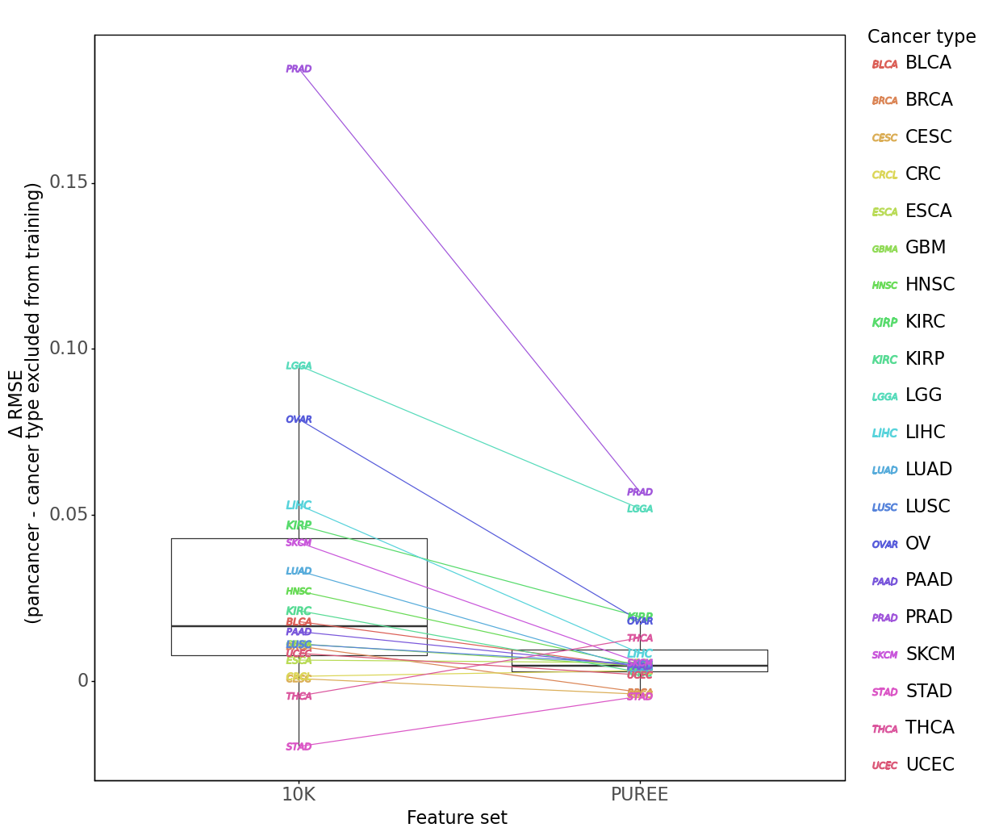

<ggplot: (8792871915349)>

In [245]:
metric_t_20k_lassocv_mod = metric_t_20k_lassocv.copy()
metric_t_20k_lassocv_mod['training_mode_ct'] = metric_t_20k_lassocv_mod['type'] + '_' + metric_t_20k_lassocv_mod['training_mode']
metric_t_20k_lassocv_mod['training_mode_fs'] = metric_t_20k_lassocv_mod['training_mode'] + '_10000'
metric_t_20k_lassocv_mod['type_feature_set'] = metric_t_20k_lassocv_mod['type'] + '_10000'

metric_t_eqst_lassocv_mod = metric_t_eqst_lassocv.copy()
metric_t_eqst_lassocv_mod['training_mode_ct'] = metric_t_eqst_lassocv_mod['type'] + '_' + metric_t_eqst_lassocv_mod['training_mode']
metric_t_eqst_lassocv_mod['training_mode_fs'] = metric_t_eqst_lassocv_mod['training_mode'] + '_170'
metric_t_eqst_lassocv_mod['type_feature_set'] = metric_t_eqst_lassocv_mod['type'] + '_170'

metric_all = pd.concat([metric_t_20k_lassocv_mod, 
                        metric_t_eqst_lassocv_mod
                       ])

pancan_10k = (metric_t_20k_lassocv_mod.loc[[
    'pancan' in x for x in metric_t_20k_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))
octo_10k = (metric_t_20k_lassocv_mod.loc[[
    'one_ctype_out' in x for x in metric_t_20k_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))
delta_10k = pd.DataFrame(pancan_10k[metric_name] - octo_10k[metric_name])
delta_10k['type'] = pancan_10k.type
delta_10k['model_type'] = '10k'

pancan_reduced = (metric_t_eqst_lassocv_mod.loc[[
    'pancan' in x for x in metric_t_eqst_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))
octo_reduced = (metric_t_eqst_lassocv_mod.loc[[
    'one_ctype_out' in x for x in metric_t_eqst_lassocv_mod.training_mode_ct]]
              .sort_values(by='type'))
delta_reduced = pd.DataFrame(pancan_reduced[metric_name] - octo_reduced[metric_name])
delta_reduced['type'] = pancan_reduced.type
delta_reduced['model_type'] = 'reduced'

delta_df = pd.concat([delta_10k, delta_reduced])

x_order = [
    '10k',  
    'reduced'
          ]

_, pval = stats.wilcoxon(delta_10k[metric_name], delta_reduced[metric_name])

shapes = ["$BLCA$", "$BRCA$", "$CESC$", "$CRCL$", "$ESCA$", "$GBMA$", 
          "$HNSC$", "$KIRP$", "$KIRC$", "$LGGA$", "$LIHC$", "$LUAD$", "$LUSC$",
         "$OVAR$", "$PAAD$", "$PRAD$", "$SKCM$", "$STAD$", "$THCA$", "$UCEC$"]


p = (ggplot(delta_df, aes(x='model_type', y=metric_name))
     + geom_boxplot(outlier_shape='')
     + geom_line(aes(group='type', color='type'), show_legend=False)
     + geom_point(aes(color='type', shape='type'), size=12)
     + theme_classic()
     + theme(panel_border=element_rect(), 
             text = element_text(size=16),
           figure_size=(12, 12))
     + labs(y='{0}'.format("\u0394 RMSE\n(pancancer - cancer type excluded from training)"), 
            x='Feature set',
            color='Cancer type')
     + scale_x_discrete(limits=x_order,
                       labels=[
                           '10K', 
                           'PUREE'
                              ])
    + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S7b_rmse.pdf')
p

### Supp. Fig. S8: RMSE and correlation on TCGA train split

In [246]:
# load the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

dataset_type = 'train'

estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
demixt_pur = pd.read_csv("../data/purities/TCGA_8K/DeMixT_{0}_purities.csv".format(dataset_type), index_col=0)
cibersort_pur = pd.read_csv("../data/purities/TCGA_8K/CIBERSORTx_{0}_purities.csv".format(dataset_type), index_col=0)
linseed_pur = 1 - pd.read_csv("../data/purities/TCGA_8K/LinSeed_{0}_proportions.csv".format(dataset_type), index_col=0).iloc[:,[0]]
linseed_pur.columns = ['Linseed']
epic_pur = pd.read_csv("../data/purities/TCGA_8K/EPIC_{0}_purities.csv".format(dataset_type), index_col=0)
deconrnaseq_pur = pd.read_csv("../data/purities/TCGA_8K/DeconRNASeq_{0}_purities.csv".format(dataset_type), index_col=0)

feature_set = 'wf_full_linear-rt_chrom_filt' # 
model = 'LinearRegression'
for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[:, [model]])
        break

predicted_purity_df.columns = ['PUREE']

predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df > 1).PUREE].index] = 1
predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df < 0).PUREE].index] = 0

#### a) Correlation

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S8a.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning:

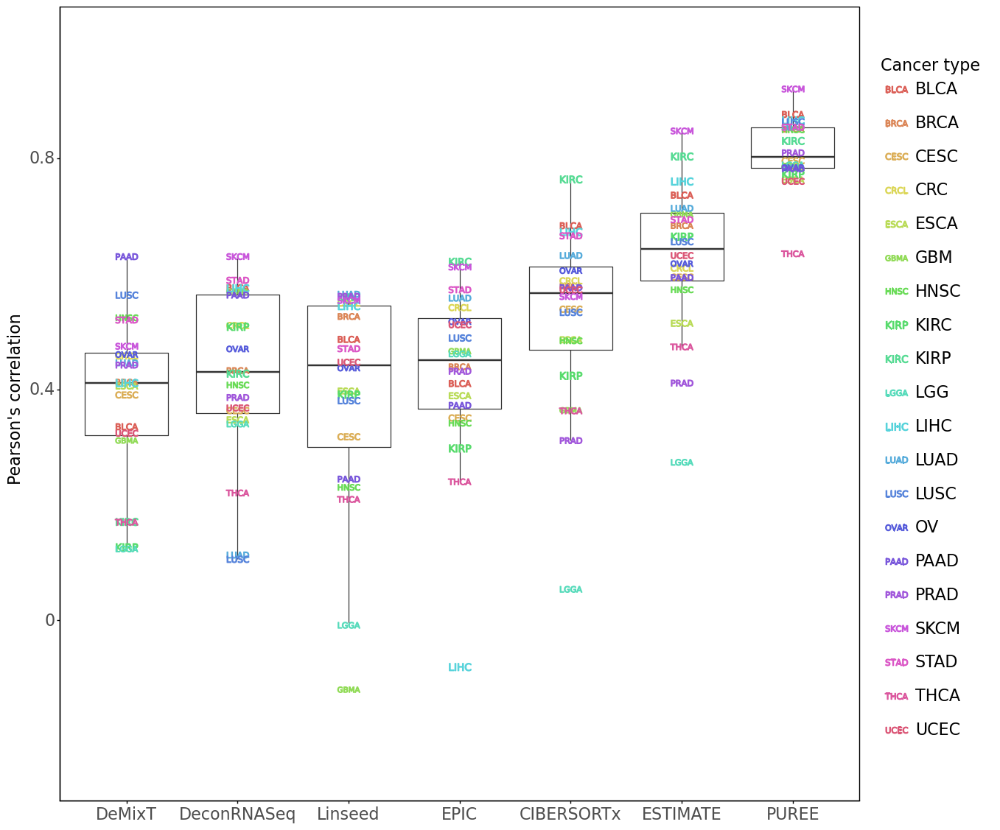

<ggplot: (8792871750419)>

In [248]:
metric_name = 'correlation'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=True).index # use the last metric

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + ylim(-0.25,1)
 + labs(y='{0}'.format("Pearson's correlation"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S8a.pdf')
p

#### b) RMSE

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 14 x 14 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S8b.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff', '#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-pa

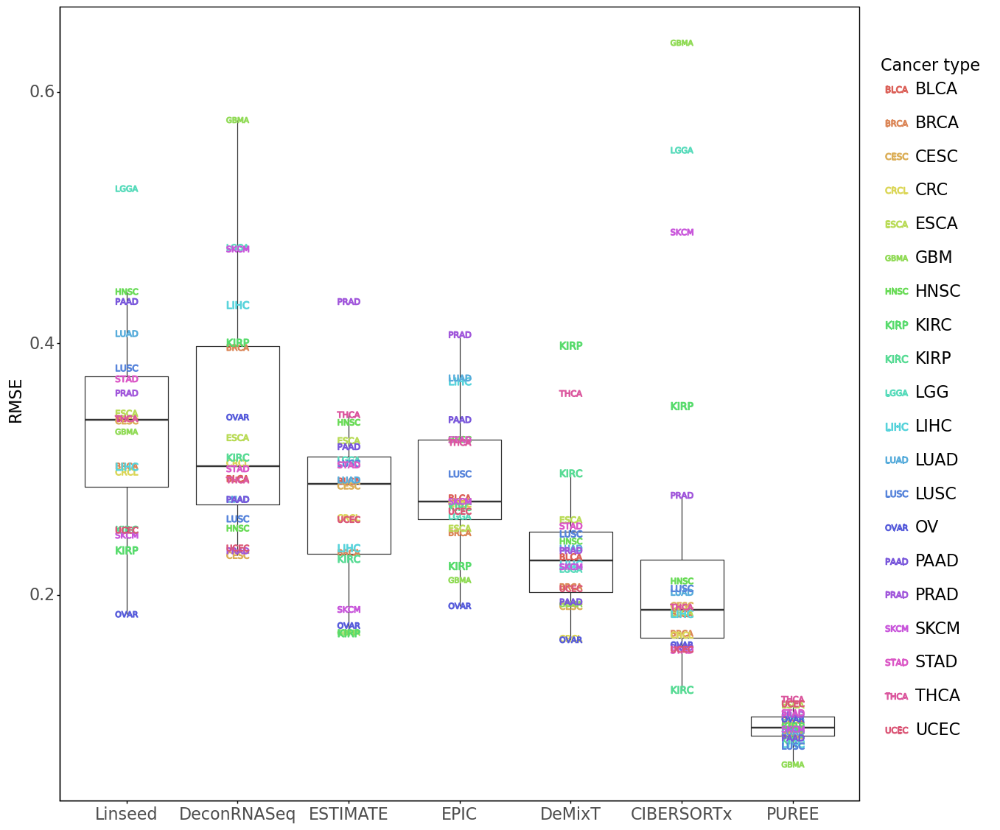

<ggplot: (8792873358114)>

In [250]:
metric_name = 'rmse'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc['test', :], consensus_df, 
                                        types_df, metric_name)
test_index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t_rmse = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=False).index # use the last metric

# plotting
shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
          r"$\mathrm{GBMA}$", r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$", r"$\mathrm{LGGA}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$",r"$\mathrm{PAAD}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$", r"$\mathrm{UCEC}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16),
        figure_size=(14,14))
 + labs(y=metric_name.upper(), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S8b.pdf')
p

#### c) Correlation+RMSE bubble plots

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 18 x 7 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S8c.pdf


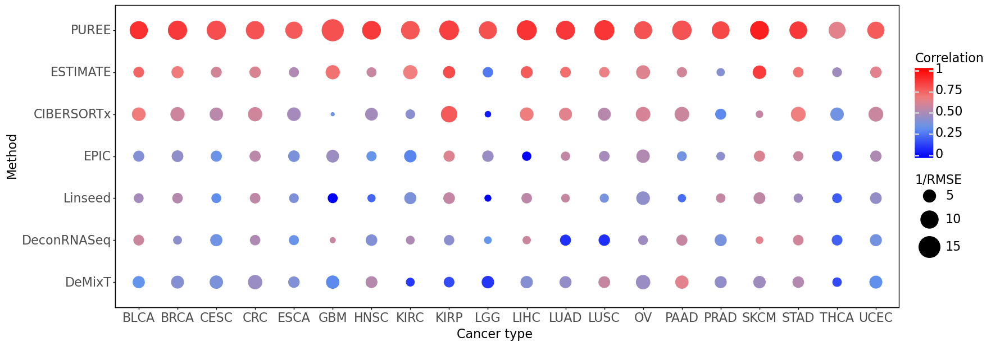

<ggplot: (8792876224582)>

In [251]:
metric_t_all = metric_t_rmse.set_index('type', append=True).join(metric_t_corr.set_index('type', append=True))
metric_t_all = metric_t_all.reset_index()
metric_t_all = metric_t_all.rename({'level_0':'method'}, axis=1)
metric_t_all['1/rmse'] = 1/metric_t_all.rmse

cohort_order = list(metric_t_all.groupby('method').median().sort_values(by='correlation').index)

p = (ggplot(metric_t_all, aes(x='type', y='method')) 
    + geom_point(aes(size='1/rmse', color='correlation'))
    + labs(y="Method", x="Cancer type", 
           color="Correlation", size="1/RMSE")
    + theme_classic()
    + theme(
            panel_border=element_rect(),
            text = element_text(size=16), figure_size=(18, 7))
    + scale_colour_gradientn(colors=('blue', 'cornflowerblue', 'lightcoral', 'red'), limits=(0,1))
    + scale_size_continuous(range=(2, 15))
     + scale_y_discrete(limits=cohort_order)
)

# p.save('../plots/supplementary/S8c.pdf')
p

#### d) Raw data

##### Aggregated

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S8d_agg.pdf


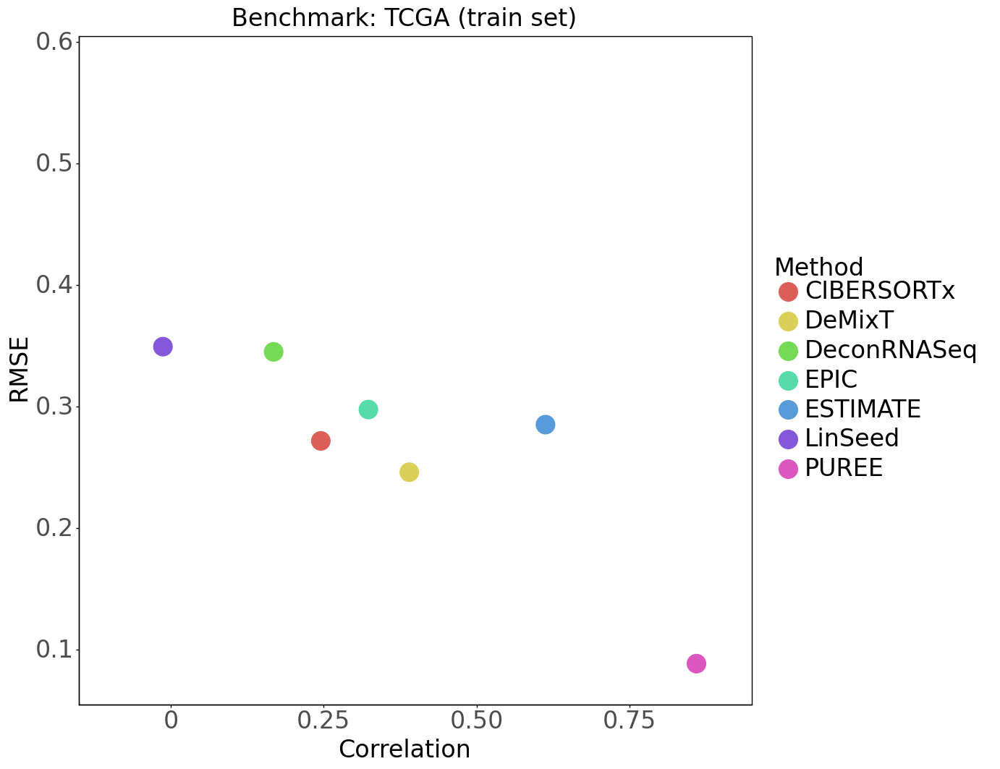

<ggplot: (8792878189683)>

In [252]:
purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

dataset_type = 'train'

feature_set = 'wf_full_linear-rt_chrom_filt' # 158 fs

model = 'LinearRegression'
for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, [model]])
        break

predicted_purity_df.columns = ['PUREE']
idx = predicted_purity_df.index

predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df > 1).PUREE].index] = 1
predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df < 0).PUREE].index] = 0

types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df['type'])

estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
demixt_pur = pd.read_csv("../data/purities/TCGA_8K/DeMixT_{0}_purities.csv".format(dataset_type), index_col=0)
cibersort_pur = pd.read_csv("../data/purities/TCGA_8K/CIBERSORTx_{0}_purities.csv".format(dataset_type), index_col=0)
linseed_pur = 1 - pd.read_csv("../data/purities/TCGA_8K/LinSeed_{0}_proportions.csv".format(dataset_type), index_col=0).iloc[:,[0]]
linseed_pur.columns = ['LinSeed']
epic_pur = pd.read_csv("../data/purities/TCGA_8K/EPIC_{0}_purities.csv".format(dataset_type), index_col=0)
deconrnaseq_pur = pd.read_csv("../data/purities/TCGA_8K/DeconRNASeq_{0}_purities.csv".format(dataset_type), index_col=0)

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
consensus_df = consensus_df.loc[predicted_purity_df.index, :]
consensus_df.columns = ['Consensus']

all_purities = pd.concat([estimate_pur,
                          demixt_pur,
                          cibersort_pur,
                          epic_pur,
                          linseed_pur,
                          deconrnaseq_pur,
                          predicted_purity_df,
                          ], axis=1)

compare_with = consensus_df['Consensus'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index].dropna()
    compare_with_without_na = compare_with.loc[method_pur.index]

    correlation = np.corrcoef(method_pur, compare_with_without_na)[0, 1]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with_without_na))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)
metrics_df_tcga = metrics_df.copy()  # used later in bubble heatmaps
metrics_df_tcga['Cohort'] = 'TCGA (test set)'

p = (ggplot(metrics_df_tcga, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(-0.1, 0.9)
    + ylim(0.08, 0.58)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(xlab='Correlation vs genomic average', ylab='RMSE with genomic average',
           title='Benchmark: TCGA (train set)')
 )

# p.save('../plots/supplementary/S8d_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S8d_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/pyt

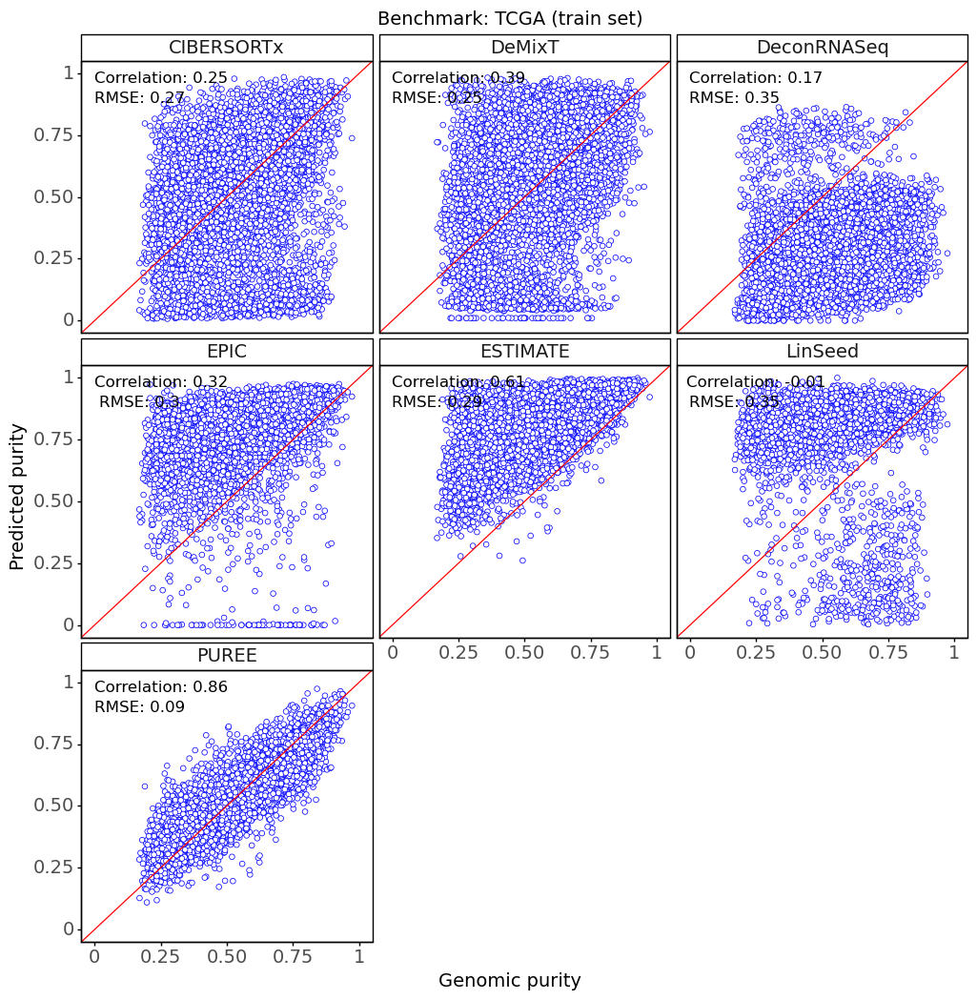

<ggplot: (8792875742627)>

In [253]:
### plotting

pur_melted = consensus_df.join(all_purities).melt(id_vars='Consensus', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'Consensus':'genomic purity'}, axis=1)
pur_melted_tcga = pur_melted.copy()
pur_melted_tcga.method = 'TCGA (test set): ' + pur_melted_tcga.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,12))
    + labs(
        title='Benchmark: TCGA (train set)', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S8d_raw.pdf')
p

### Supp. Fig. 9: Selected cancer types with different purity levels

In [254]:
# load the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

dataset_type = 'test'

estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
demixt_pur = pd.read_csv("../data/purities/TCGA_8K/DeMixT_{0}_purities.csv".format(dataset_type), index_col=0)
cibersort_pur = pd.read_csv("../data/purities/TCGA_8K/CIBERSORTx_{0}_purities.csv".format(dataset_type), index_col=0)
linseed_pur = 1 - pd.read_csv("../data/purities/TCGA_8K/LinSeed_{0}_proportions.csv".format(dataset_type), index_col=0).iloc[:,[0]]
linseed_pur.columns = ['Linseed']
epic_pur = pd.read_csv("../data/purities/TCGA_8K/EPIC_{0}_purities.csv".format(dataset_type), index_col=0)
deconrnaseq_pur = pd.read_csv("../data/purities/TCGA_8K/DeconRNASeq_{0}_purities.csv".format(dataset_type), index_col=0)

feature_set = 'wf_full_linear-rt_chrom_filt' # 
model = 'LinearRegression'
for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[:, [model]])
        break

predicted_purity_df.columns = ['PUREE']

predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df > 1).PUREE].index] = 1
predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df < 0).PUREE].index] = 0

#### a) 5 cancer types on test

##### Correlation - 5

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S9a_corr.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWar

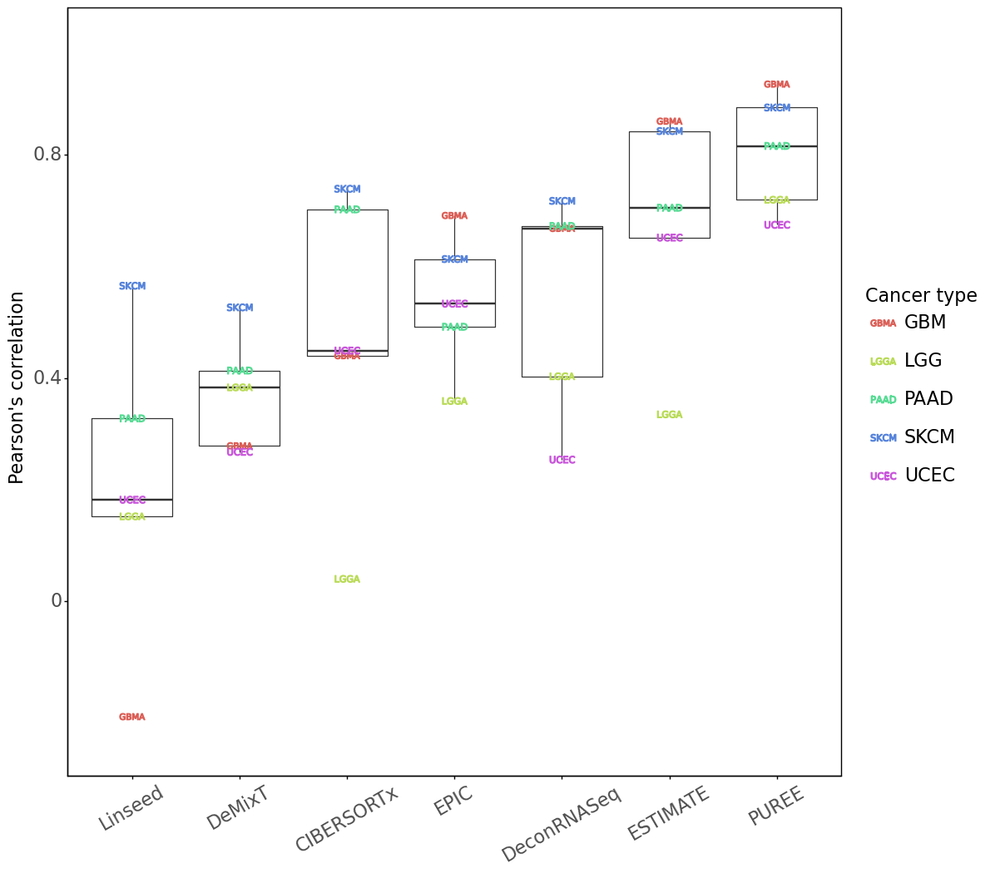

<ggplot: (8792873478166)>

In [256]:
metric_name = 'correlation'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type == 'LGG') |
                           (metric_t.type == 'SKCM') | 
                           (metric_t.type == 'PAAD') | 
                           (metric_t.type == 'GBM') | 
                           (metric_t.type == 'UCEC')]

# metric_t.correlation = 1 - metric_t.correlation
metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=True).index # use the last metric

# plotting

shapes = (r"$\mathrm{GBMA}$", r"$\mathrm{LGGA}$", r"$\mathrm{PAAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{UCEC}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(-0.25,1)
 + labs(y='{0}'.format("Pearson's correlation"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

p.save('../plots/supplementary/S9a_corr.pdf')
p

##### RMSE - 5

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S9a_rmse.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


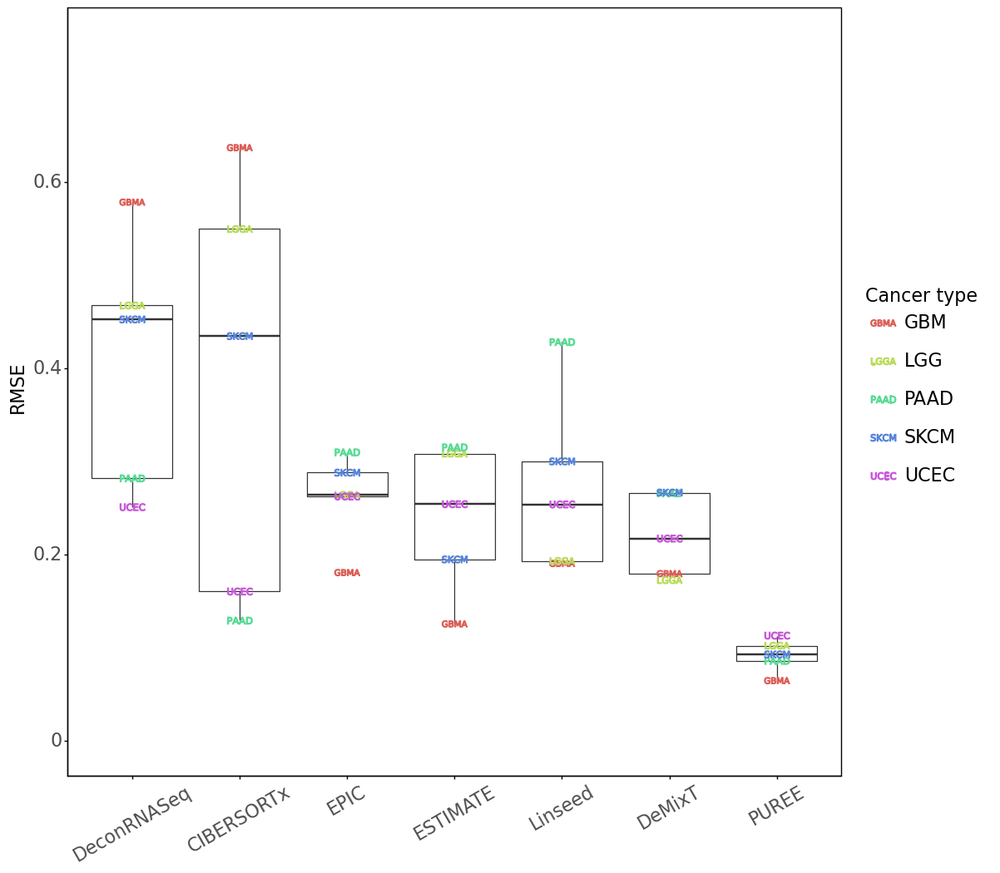

<ggplot: (8792871109358)>

In [258]:
metric_name = 'rmse'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type == 'LGG') |
                           (metric_t.type == 'SKCM') | 
                           (metric_t.type == 'PAAD') | 
                           (metric_t.type == 'GBM') | 
                           (metric_t.type == 'UCEC')]

metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=False).index # use the last metric

# plotting

shapes = (r"$\mathrm{GBMA}$", r"$\mathrm{LGGA}$", r"$\mathrm{PAAD}$", r"$\mathrm{SKCM}$", r"$\mathrm{UCEC}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(0,0.75)
 + labs(y='{0}'.format("RMSE"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S9a_rmse.pdf')
p

#### New b) 15 cancer types on test

##### Correlation - 15

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S9b_corr.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWar

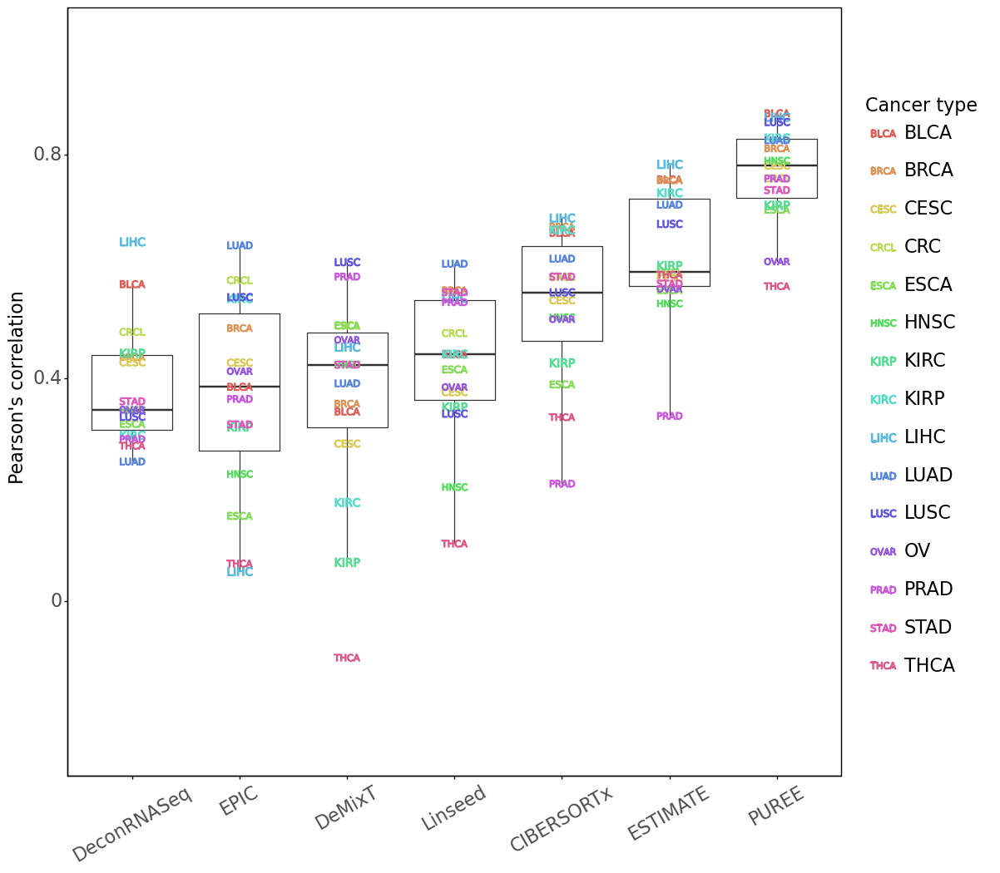

<ggplot: (8792880784499)>

In [259]:
metric_name = 'correlation'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type != 'LGG') &
                           (metric_t.type != 'SKCM') &
                           (metric_t.type != 'PAAD') & 
                           (metric_t.type != 'GBM') &
                           (metric_t.type != 'UCEC')]


metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=True).index # use the last metric

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
         r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(-0.25,1)
 + labs(y='{0}'.format("Pearson's correlation"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S9b_corr.pdf')
p

##### RMSE - 15

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S9b_rmse.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.p

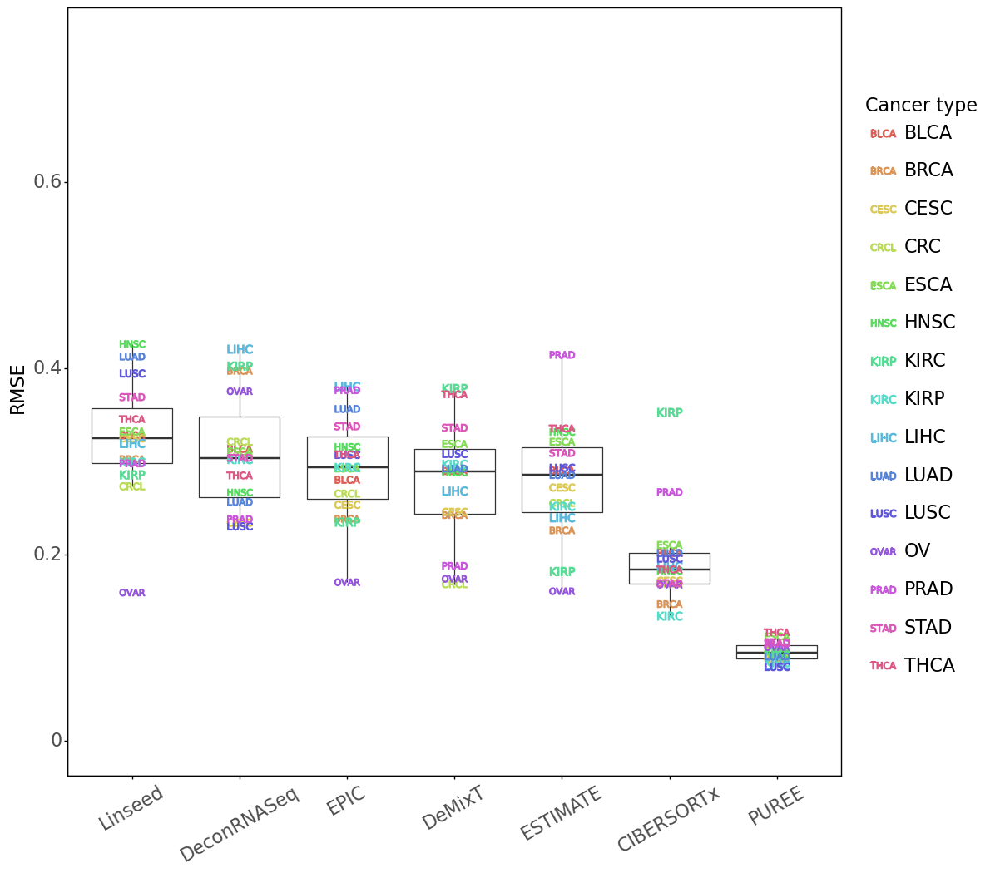

<ggplot: (8792871636324)>

In [260]:
metric_name = 'rmse'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type != 'LGG') &
                           (metric_t.type != 'SKCM') &
                           (metric_t.type != 'PAAD') & 
                           (metric_t.type != 'GBM') &
                           (metric_t.type != 'UCEC')]


# metric_t.correlation = 1 - metric_t.correlation
metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=False).index # use the last metric

# plotting

shapes = (r"$\mathrm{BLCA}$", r"$\mathrm{BRCA}$", r"$\mathrm{CESC}$", r"$\mathrm{CRCL}$", r"$\mathrm{ESCA}$", 
         r"$\mathrm{HNSC}$", r"$\mathrm{KIRP}$", r"$\mathrm{KIRC}$",
          r"$\mathrm{LIHC}$", r"$\mathrm{LUAD}$", r"$\mathrm{LUSC}$", r"$\mathrm{OVAR}$", 
          r"$\mathrm{PRAD}$", r"$\mathrm{STAD}$", r"$\mathrm{THCA}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(0,0.75)
 + labs(y='{0}'.format("RMSE"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S9b_rmse.pdf')
p

### Supp. Fig. S10: 5 vs 5 cancer types, purity ranges
High purity: GBM, OV, UCEC, LGG, LIHC  
Low purity: PAAD, LUAD, STAD, HNSC, PRAD

In [261]:
# load the results
purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df.type)

dataset_type = 'test'

estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
demixt_pur = pd.read_csv("../data/purities/TCGA_8K/DeMixT_{0}_purities.csv".format(dataset_type), index_col=0)
cibersort_pur = pd.read_csv("../data/purities/TCGA_8K/CIBERSORTx_{0}_purities.csv".format(dataset_type), index_col=0)
linseed_pur = 1 - pd.read_csv("../data/purities/TCGA_8K/LinSeed_{0}_proportions.csv".format(dataset_type), index_col=0).iloc[:,[0]]
linseed_pur.columns = ['Linseed']
epic_pur = pd.read_csv("../data/purities/TCGA_8K/EPIC_{0}_purities.csv".format(dataset_type), index_col=0)
deconrnaseq_pur = pd.read_csv("../data/purities/TCGA_8K/DeconRNASeq_{0}_purities.csv".format(dataset_type), index_col=0)

feature_set = 'wf_full_linear-rt_chrom_filt' # 
model = 'LinearRegression'
for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[:, [model]])
        break

predicted_purity_df.columns = ['PUREE']

predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df > 1).PUREE].index] = 1
predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df < 0).PUREE].index] = 0

#### 5 cancer types with low purity

##### Correlation - 5

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S10a_corr.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.

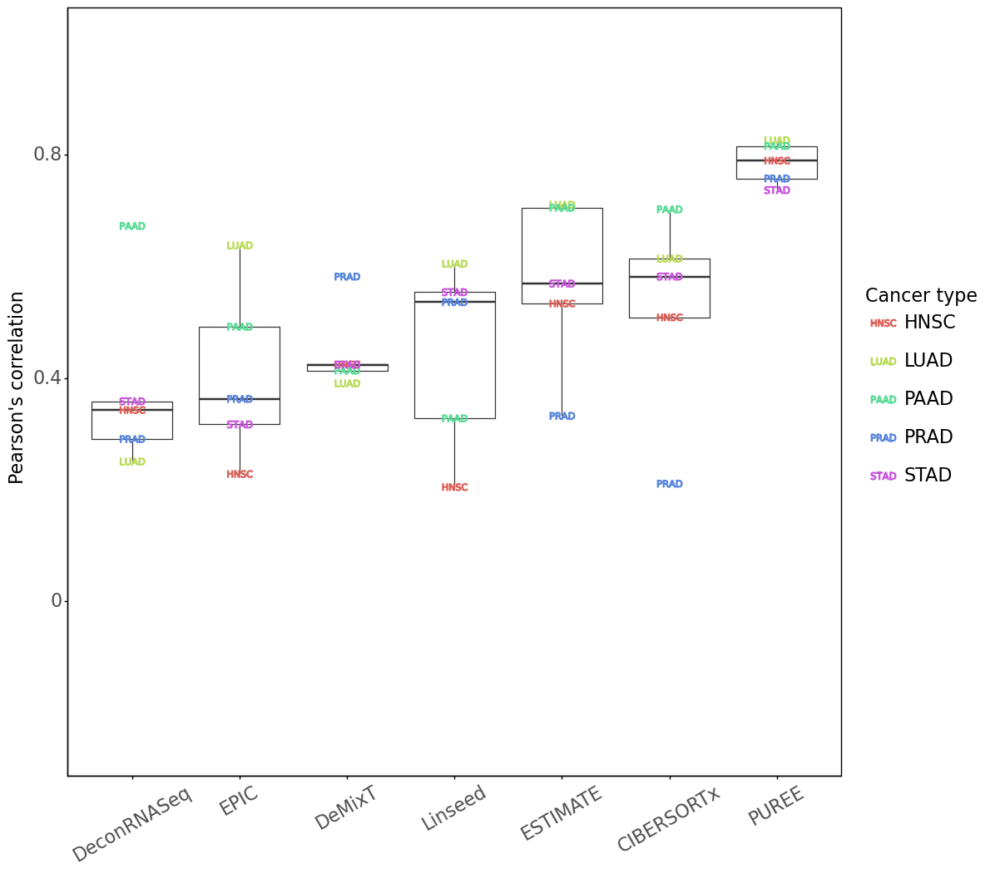

<ggplot: (8792875947141)>

In [262]:
metric_name = 'correlation'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type == 'PAAD') |
                           (metric_t.type == 'LUAD') | 
                           (metric_t.type == 'STAD') | 
                           (metric_t.type == 'HNSC') | 
                           (metric_t.type == 'PRAD')]

# metric_t.correlation = 1 - metric_t.correlation
metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=True).index # use the last metric

# plotting

shapes = (r"$\mathrm{HNSC}$", r"$\mathrm{LUAD}$", r"$\mathrm{PAAD}$", r"$\mathrm{PRAD}$", r"$\mathrm{STAD}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(-0.25,1)
 + labs(y='{0}'.format("Pearson's correlation"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S10a_corr.pdf')
p

##### RMSE - 5

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S10a_rmse.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.

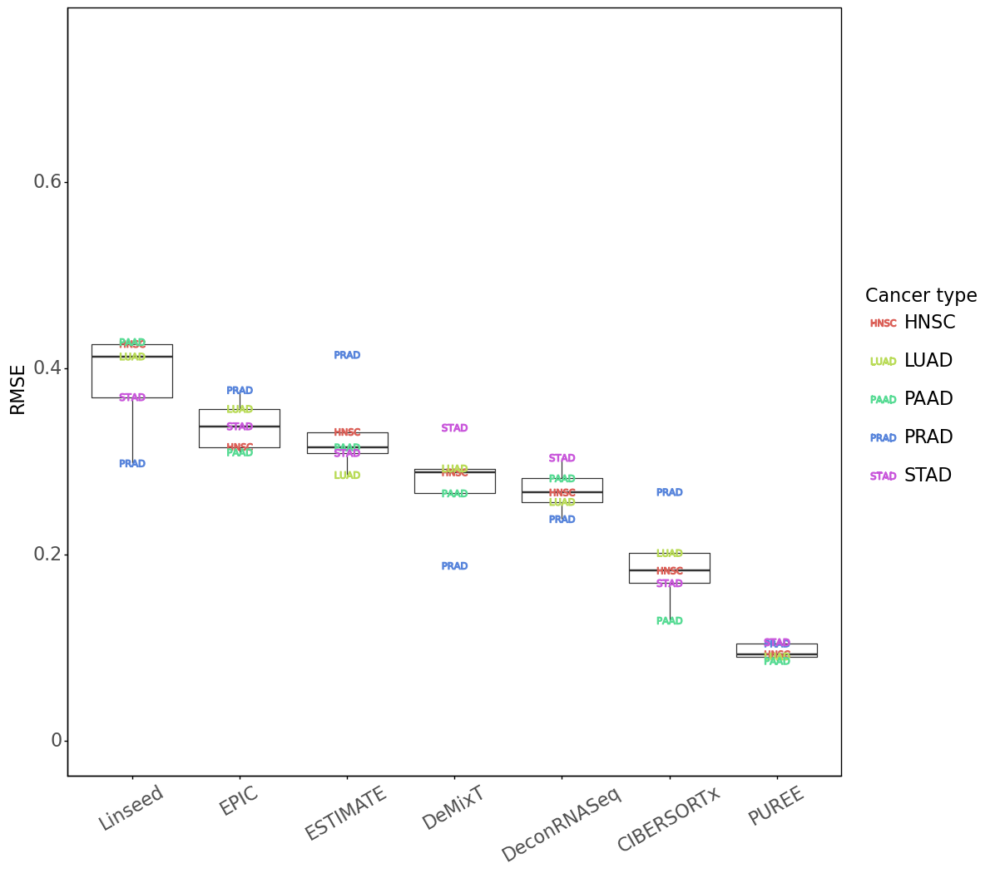

<ggplot: (8792870781901)>

In [263]:
metric_name = 'rmse'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type == 'PAAD') |
                           (metric_t.type == 'LUAD') | 
                           (metric_t.type == 'STAD') | 
                           (metric_t.type == 'HNSC') | 
                           (metric_t.type == 'PRAD')]

metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=False).index # use the last metric

# plotting

shapes = (r"$\mathrm{HNSC}$", r"$\mathrm{LUAD}$", r"$\mathrm{PAAD}$", r"$\mathrm{PRAD}$", r"$\mathrm{STAD}$")

p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(0,0.75)
 + labs(y='{0}'.format("RMSE"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S10a_rmse.pdf')
p

#### 5 cancer types with high purity

##### Correlation - 5

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S10b_corr.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff', '#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.py:61: UserWarning: You passed a edgecolor/edgecolors (['#333333ff']) for an unfilled marker ('').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/geoms/geom_point.

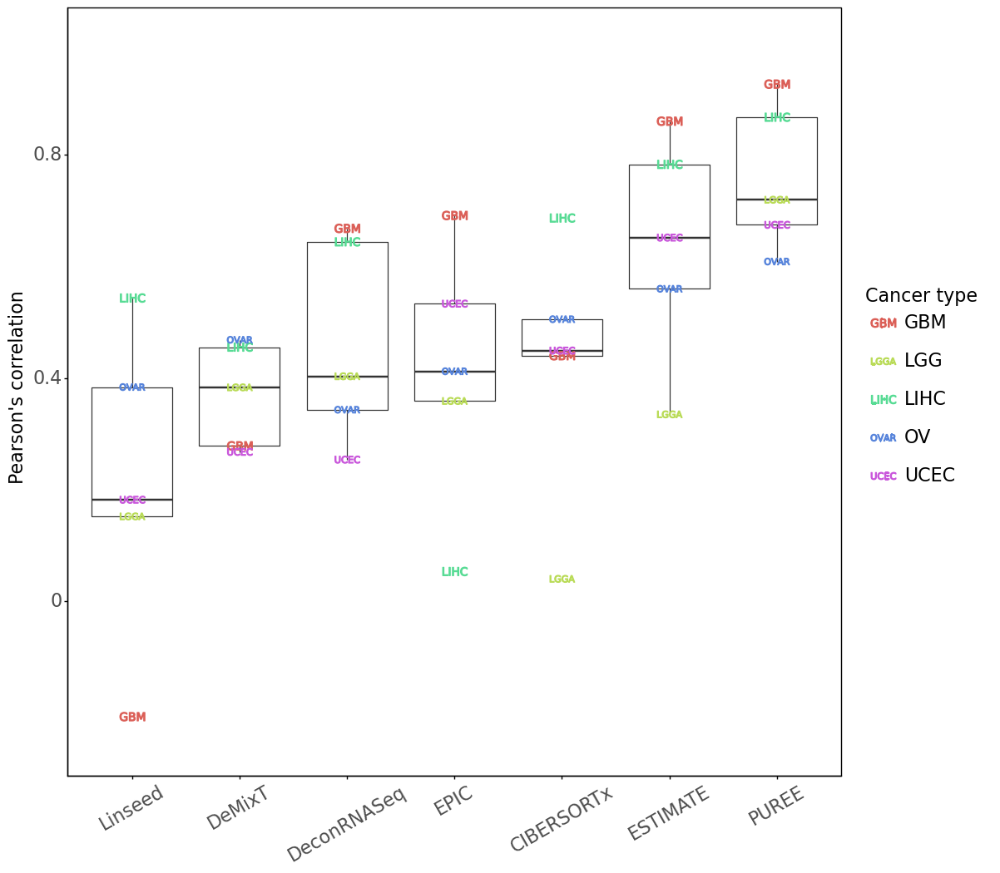

<ggplot: (8792873148844)>

In [264]:
metric_name = 'correlation'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type == 'GBM') |
                           (metric_t.type == 'OV') | 
                           (metric_t.type == 'UCEC') | 
                           (metric_t.type == 'LGG') | 
                           (metric_t.type == 'LIHC')]

metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=True).index # use the last metric

# plotting
shapes = (r"$\mathrm{GBM}$", r"$\mathrm{LGGA}$", r"$\mathrm{LIHC}$", r"$\mathrm{OVAR}$", r"$\mathrm{UCEC}$")


p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(-0.25,1)
 + labs(y='{0}'.format("Pearson's correlation"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S10b_corr.pdf')
p

##### RMSE - 5

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S10b_rmse.pdf


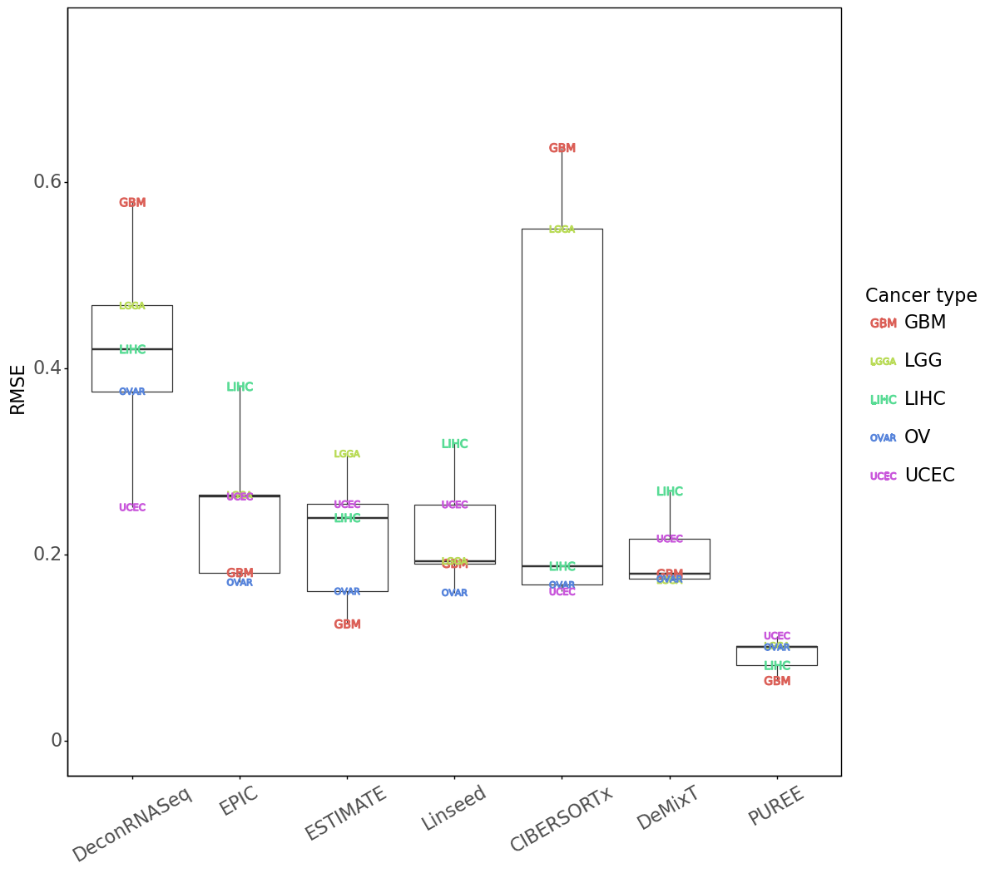

<ggplot: (8792875790644)>

In [265]:
metric_name = 'rmse'

metric_t = []
metric_t_df = calculate_average_by_type(predicted_purity_df.loc[dataset_type, :], consensus_df, 
                                        types_df, metric_name)
index = predicted_purity_df.loc[dataset_type, :].index
metric_t_df = metric_t_df.sort_values(by=metric_name, ascending=False)
metric_t.append(metric_t_df)
metric_t = pd.concat(metric_t)

metric_t_estimate = calculate_average_by_type(estimate_pur.reindex(index).dropna(), 
                                              consensus_df, types_df, metric_name=metric_name)

metric_t_demixt = calculate_average_by_type(demixt_pur.reindex(index).dropna(), 
                                            consensus_df, types_df, metric_name=metric_name)

metric_t_cibersort = calculate_average_by_type(cibersort_pur.reindex(index).dropna(), 
                                               consensus_df, types_df, metric_name=metric_name)

metric_t_linseed = calculate_average_by_type(linseed_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_epic = calculate_average_by_type(epic_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)

metric_t_deconrnaseq = calculate_average_by_type(deconrnaseq_pur.reindex(index).dropna(), 
                                             consensus_df, types_df, metric_name=metric_name)


metric_t = pd.concat([
    metric_t, 
                      metric_t_estimate, 
                      metric_t_demixt,
                      metric_t_linseed,
                      metric_t_cibersort,
                      metric_t_epic,
                      metric_t_deconrnaseq
                     ])

metric_t = metric_t.loc[(metric_t.type == 'GBM') |
                           (metric_t.type == 'OV') | 
                           (metric_t.type == 'UCEC') | 
                           (metric_t.type == 'LGG') | 
                           (metric_t.type == 'LIHC')]

metric_t_corr = metric_t.copy()

x_order = metric_t.groupby(metric_t.index).median().sort_values(metric_name, ascending=False).index # use the last metric

# plotting
shapes = (r"$\mathrm{GBM}$", r"$\mathrm{LGGA}$", r"$\mathrm{LIHC}$", r"$\mathrm{OVAR}$", r"$\mathrm{UCEC}$")


p = (ggplot(metric_t, aes(x=metric_t.index, y=metric_name))
 + geom_boxplot(outlier_shape='')
 + geom_point(aes(color=metric_t.type, shape=metric_t.type), size=12)
 + scale_x_discrete(limits=x_order)
 + theme_classic()
 + theme(panel_border=element_rect(), text = element_text(size=16), axis_text_x = element_text(angle = 30),
        figure_size=(12,12))
 + ylim(0,0.75)
 + labs(y='{0}'.format("RMSE"), 
        color='Cancer type')
 + scale_shape_manual(name='Cancer type', values=shapes)
)

# p.save('../plots/supplementary/S10b_rmse.pdf')
p

### Supp. Fig. S11: External benchmarks’ for PUREE’s and other gene expression-based methods for tumor purity prediction

#### a) TCGA-test

##### Aggregated

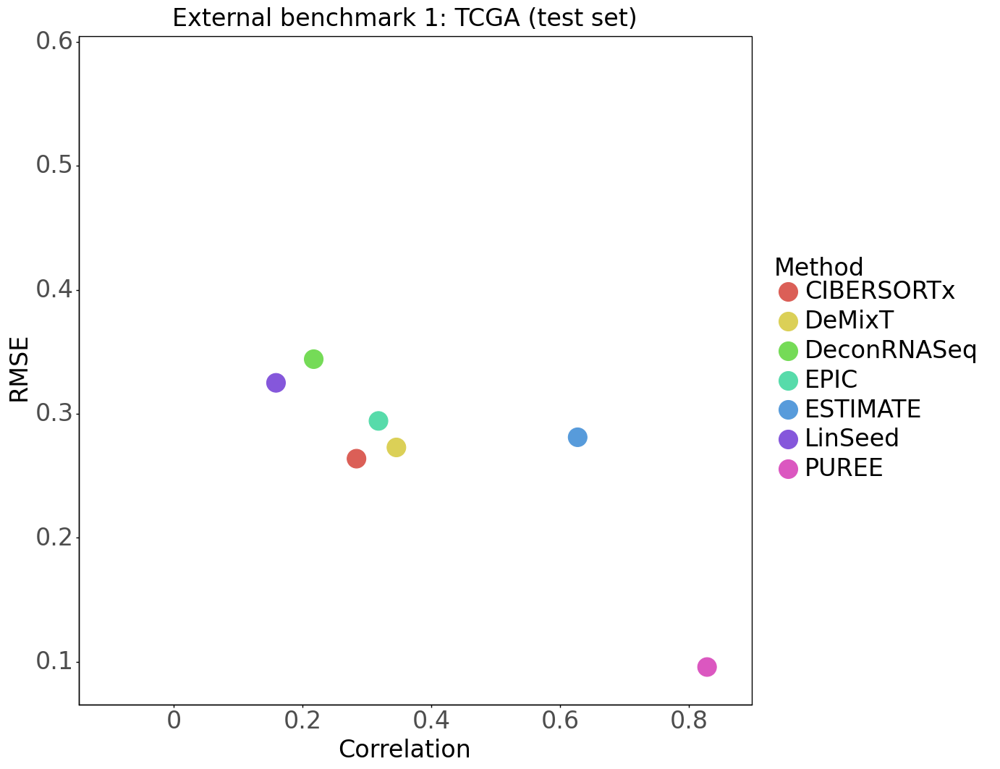

<ggplot: (8792872865178)>

In [268]:
purities_save_path = "../data/purities/TCGA_8K/model_tests/full/"

dataset_type = 'test'

feature_set = 'wf_full_linear-rt_chrom_filt' # 158 fs

model = 'LinearRegression'
for file in np.sort(os.listdir(purities_save_path)):
    if feature_set in file: 
        predicted_purity_df = (pd.read_csv('../data/purities/TCGA_8K/model_tests/full/{0}'.format(file), index_col=[0,1])
                               .loc[dataset_type, [model]])
        break

predicted_purity_df.columns = ['PUREE']
idx = predicted_purity_df.index

predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df > 1).PUREE].index] = 1
predicted_purity_df.loc[predicted_purity_df[(predicted_purity_df < 0).PUREE].index] = 0

types_df = pd.read_csv("../data/misc/types_data.csv", index_col=0)
types = set(types_df['type'])

estimate_pur = pd.read_csv("../data/purities/TCGA_8K/ESTIMATE_purities.tsv", sep='\t')
demixt_pur = pd.read_csv("../data/purities/TCGA_8K/DeMixT_{0}_purities.csv".format(dataset_type), index_col=0)
cibersort_pur = pd.read_csv("../data/purities/TCGA_8K/CIBERSORTx_{0}_purities.csv".format(dataset_type), index_col=0)
linseed_pur = 1 - pd.read_csv("../data/purities/TCGA_8K/LinSeed_{0}_proportions.csv".format(dataset_type), index_col=0).iloc[:,[0]]
linseed_pur.columns = ['LinSeed']
epic_pur = pd.read_csv("../data/purities/TCGA_8K/EPIC_{0}_purities.csv".format(dataset_type), index_col=0)
deconrnaseq_pur = pd.read_csv("../data/purities/TCGA_8K/DeconRNASeq_{0}_purities.csv".format(dataset_type), index_col=0)

consensus_df = pd.read_csv("../data/purities/TCGA_8K/consensus_purities_new_g.csv", index_col=0)
consensus_df = consensus_df.loc[predicted_purity_df.index, :]
consensus_df.columns = ['Consensus']

all_purities = pd.concat([estimate_pur,
                          demixt_pur,
                          cibersort_pur,
                          epic_pur,
                          linseed_pur,
                          deconrnaseq_pur,
                          predicted_purity_df,
                          ], axis=1)

compare_with = consensus_df['Consensus'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index].dropna()
    compare_with_without_na = compare_with.loc[method_pur.index]

    correlation = np.corrcoef(method_pur, compare_with_without_na)[0, 1]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with_without_na))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

p = (ggplot(metrics_df, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(-0.1, 0.85)
    + ylim(0.09, 0.58)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(xlab='Correlation vs genomic average', ylab='RMSE with genomic average',
           title='External benchmark 1: TCGA (test set)')
 )

# p.save('../plots/supplementary/S11a_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11a_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/py

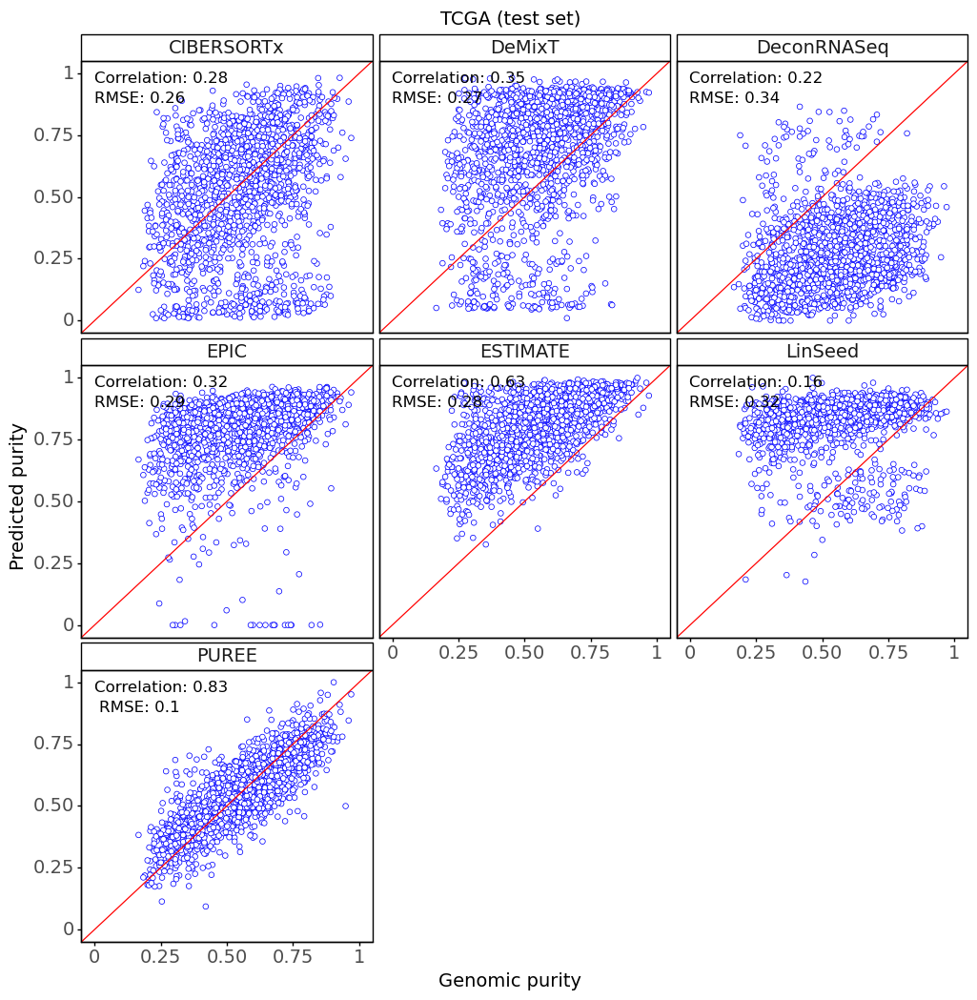

<ggplot: (8792872586433)>

In [267]:
### plotting

pur_melted = consensus_df.join(all_purities).melt(id_vars='Consensus', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'Consensus':'genomic purity'}, axis=1)
pur_melted_tcga = pur_melted.copy()
pur_melted_tcga.method = 'TCGA (test set): ' + pur_melted_tcga.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,12))
    + labs(
        title='TCGA (test set)', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S11a_raw.pdf')
p

#### b) Chen et al. (Lung cancer)

##### Aggregated

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11b_agg.pdf


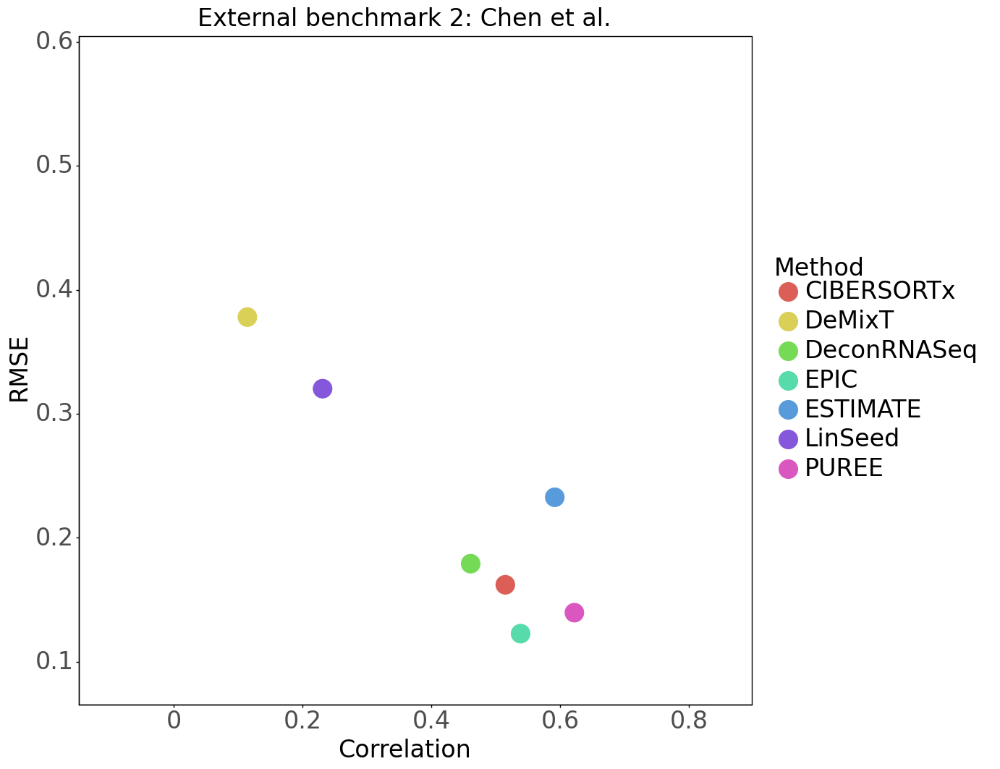

<ggplot: (8792873811095)>

In [270]:
purity_puree = pd.read_csv("../data/purities/Chen_et_al/PUREE_Chen_et_al_purities.tsv", sep='\t', index_col=0)
purity_puree.columns = ['PUREE']

purity_demixt = pd.read_csv("../data/purities/Chen_et_al/DeMixT_Chen_et_al_purities.csv", index_col=0)
purity_demixt.columns = ['DeMixT']

purity_cibersortx = pd.read_csv("../data/purities/Chen_et_al/CIBERSORTx_Chen_et_al_purities.csv", index_col=0)
purity_cibersortx.columns = ['CIBERSORTx']

purity_linseed = 1-pd.read_csv("../data/purities/Chen_et_al/LinSeed_Chen_et_al_proportions.csv", index_col=0).iloc[:,[1]]
purity_linseed.columns = ['LinSeed']

purity_epic = pd.read_csv("../data/purities/Chen_et_al/EPIC_Chen_et_al_purities.csv", index_col=0)
purity_epic.columns = ['EPIC']

purity_estimate = pd.read_csv("../data/purities/Chen_et_al/ESTIMATE_Chen_et_al_purities.csv", index_col=0).T
purity_estimate.columns=['ESTIMATE']

purity_deconrnaseq = pd.read_csv("../data/purities/Chen_et_al/DeconRNASeq_Chen_et_al_purities.csv", index_col=0)
purity_deconrnaseq.columns=['DeconRNASeq']

genomic_purities = (pd.read_csv("../data/purities/Chen_et_al/Chen_et_al_genomic_purities.tsv", sep='\t', index_col=0)
                    .reindex(purity_puree.index))

all_purities = pd.concat([
    purity_puree,
    purity_estimate,
    purity_cibersortx,
    purity_demixt, 
    purity_linseed,
    purity_epic,
    purity_deconrnaseq,
], axis=1)

compare_with = genomic_purities['Average'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index]

    correlation = pearsonr(method_pur, compare_with)[0]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

p = (ggplot(metrics_df, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(-0.1, 0.85)
    + ylim(0.09, 0.58)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(title='External benchmark 2: Chen et al.')
 )

# p.save('../plots/supplementary/S11b_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11b_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/py

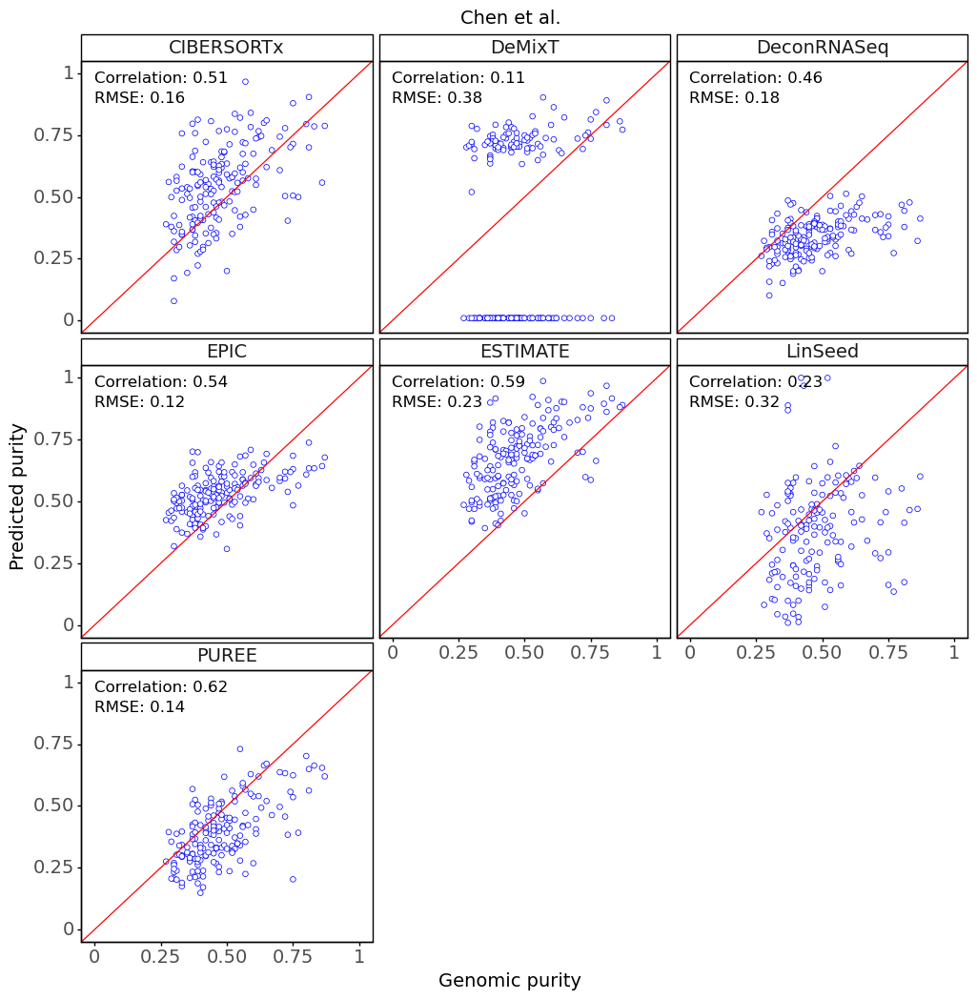

<ggplot: (8792873117808)>

In [271]:
SWARMPLOT_DOT_SIZE = 10
FONT_SIZE = 12
plt.rcParams.update({'font.size': FONT_SIZE})
LEGEND_FONT_SIZE = 10

### plotting

pur_melted = genomic_purities.loc[:, ['Average']].join(all_purities).melt(id_vars='Average', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'Average':'genomic purity'}, axis=1)
pur_melted.method.replace({'CibersortX':'CIBERSORTx'}, inplace=True)
pur_melted_gsk = pur_melted.copy()
pur_melted_gsk.method = 'Chen et al.: ' + pur_melted_gsk.method


def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,12))
    + labs(
        title='Chen et al.', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S11b_raw.pdf')
p

#### c) Chua et al. (Lung cancer)
https://aacrjournals.org/clincancerres/article/27/21/5939/671726/Integrative-Profiling-of-T790M-Negative-EGFR

##### Aggregated

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11c.pdf


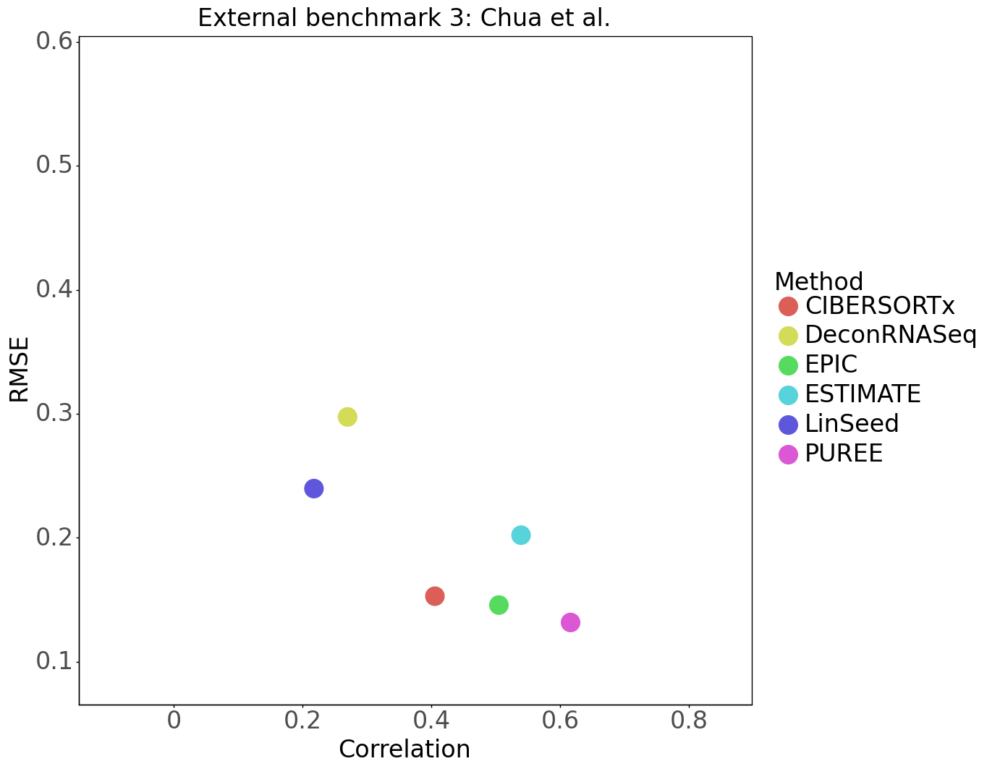

<ggplot: (8792870603879)>

In [272]:
purity_puree = pd.read_csv("../data/purities/Chua_et_al/PUREE_Chua_et_al_purities.tsv", sep='\t', index_col=0)
purity_puree.columns = ['PUREE']

purity_estimate = (pd.read_csv('../data/purities/Chua_et_al/ESTIMATE_Chua_et_al_purities.csv', index_col=0).T
                      .reindex(purity_puree.index))

purity_epic = (pd.read_csv('../data/purities/Chua_et_al/EPIC_Chua_et_al_purities.csv', index_col=0)
                      .reindex(purity_puree.index))

purity_linseed = 1-(pd.read_csv('../data/purities/Chua_et_al/LinSeed_Chua_et_al_proportions.csv', index_col=0).iloc[:,[0]]
                      .reindex(purity_puree.index))
purity_linseed.columns = ['LinSeed']

purity_cibersortx = (pd.read_csv('../data/purities/Chua_et_al/CIBERSORTx_Chua_et_al_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_cibersortx.columns = ['CIBERSORTx']

purity_deconrnaseq = (pd.read_csv("../data/purities/Chua_et_al/DeconRNASeq_Chua_et_al_purities.csv", index_col=0)
                      .reindex(purity_puree.index))
purity_deconrnaseq.columns=['DeconRNASeq']

genomic_purities = (pd.read_csv("../data/purities/Chua_et_al/Chua_et_al_purity_estimates.tsv", sep='\t', index_col=0)[['Average']]
                   .loc[purity_puree.index])

all_purities = pd.concat([
    purity_puree,
    purity_estimate,
    purity_cibersortx,
    purity_linseed,
    purity_epic,
    purity_deconrnaseq,
], axis=1)
compare_with = genomic_purities['Average'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index]

    correlation = pearsonr(method_pur, compare_with)[0]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

p = (ggplot(metrics_df, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(-0.1, 0.85)
    + ylim(0.09, 0.58)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(xlab='Correlation vs genomic average', ylab='RMSE with genomic average',
           title='External benchmark 3: Chua et al.')
 )

# p.save('../plots/supplementary/S11c.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11c_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/pyt

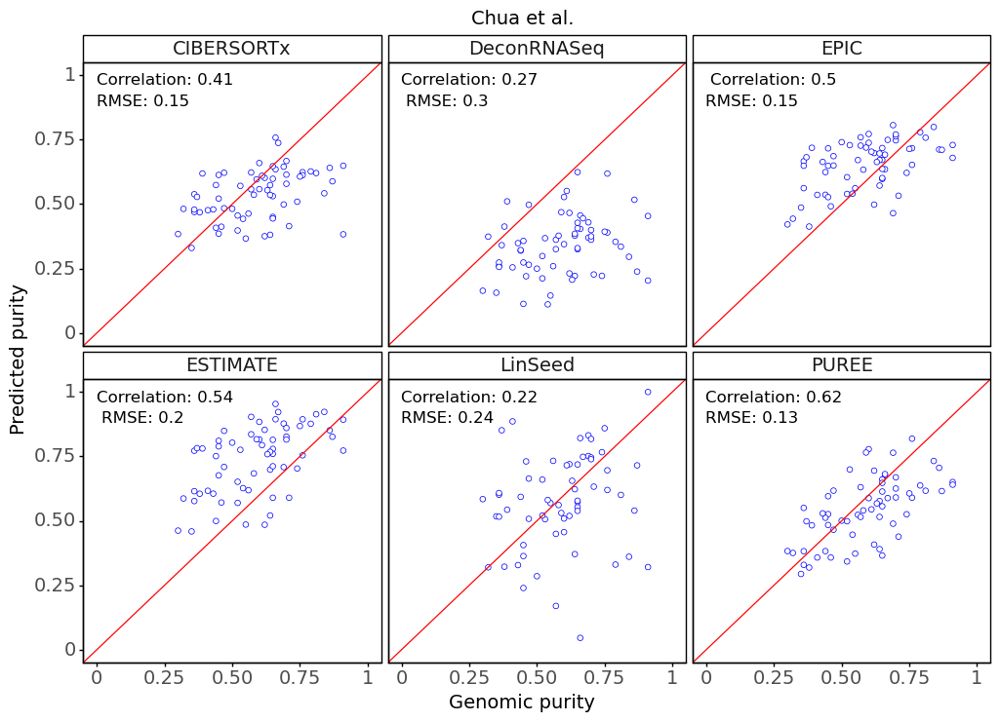

<ggplot: (8792876129247)>

In [273]:
SWARMPLOT_DOT_SIZE = 10
FONT_SIZE = 12
plt.rcParams.update({'font.size': FONT_SIZE})
LEGEND_FONT_SIZE = 10

### plotting

pur_melted = genomic_purities.join(all_purities).melt(id_vars='Average', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'Average':'genomic purity'}, axis=1)
pur_melted_tki = pur_melted.copy()
pur_melted_tki.method = 'Chua et al.: ' + pur_melted_tki.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,8))
    + labs(
        title='Chua et al.', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S11c_raw.pdf')
p

#### d) Joanito et al. (Colorectal cancer)

##### Aggregated

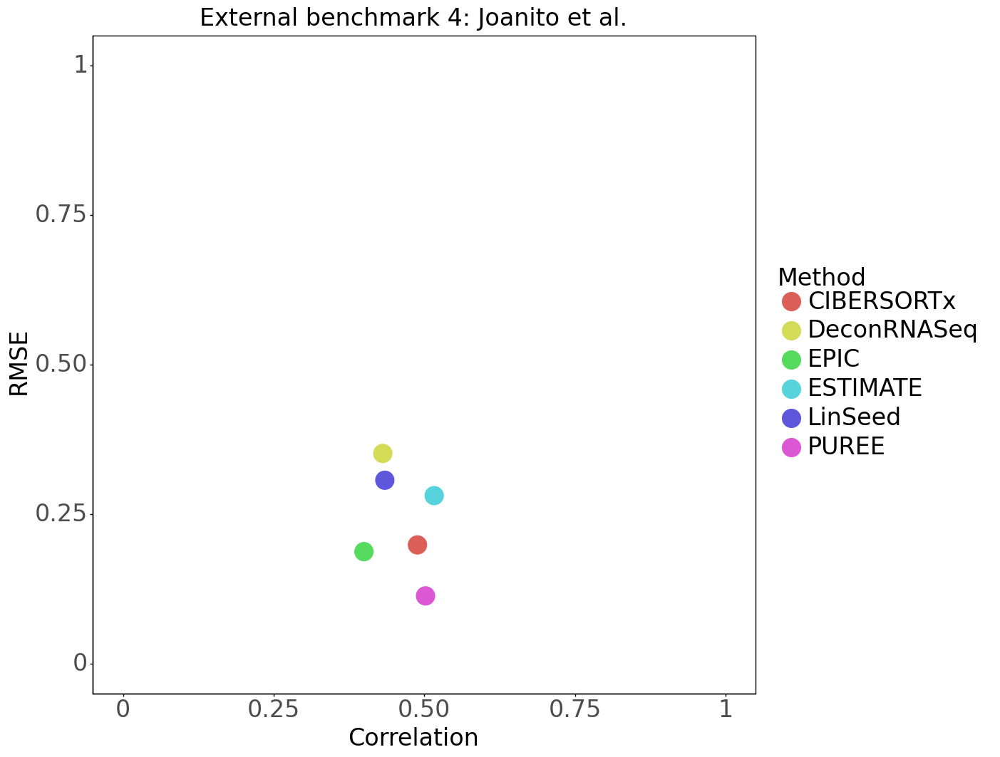

<ggplot: (8763989882600)>

In [38]:
purity_puree = pd.read_csv("../data/purities/Joanito_et_al/PUREE_Joanito_et_al_purities.tsv", sep='\t', index_col=0)
purity_puree.columns = ['PUREE']

purity_estimate = (pd.read_csv('../data/purities/Joanito_et_al/ESTIMATE_Joanito_et_al_purities.tsv', sep='\t', 
                              index_col=0).reindex(purity_puree.index))

purity_epic = (pd.read_csv('../data/purities/Joanito_et_al/EPIC_Joanito_et_al_purities.csv', index_col=0)
                      .reindex(purity_puree.index))

purity_linseed = 1-(pd.read_csv('../data/purities/Joanito_et_al/LinSeed_Joanito_et_al_proportions.csv', index_col=0)
                      .reindex(purity_puree.index).iloc[:,[0]])
purity_linseed.columns=['LinSeed']

purity_cibersortx = (pd.read_csv('../data/purities/Joanito_et_al/CIBERSORTx_Joanito_et_al_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_cibersortx.columns = ['CIBERSORTx']

purity_deconrnaseq = (pd.read_csv("../data/purities/Joanito_et_al/DeconRNASeq_Joanito_et_al_purities.csv", index_col=0)
                      .reindex(purity_puree.index))
purity_deconrnaseq.columns=['DeconRNASeq']

consensus_joanito = (pd.read_csv("../data/purities/Joanito_et_al/Joanito_et_al_genomic_consensus_purities.tsv", sep='\t', index_col=0)
    .reindex(purity_puree.index))
consensus_joanito.columns = ['Consensus']

all_purities = pd.concat([
    purity_estimate,
    purity_cibersortx,
    purity_puree,
    purity_linseed,
    purity_epic,
    purity_deconrnaseq,
], axis=1)

compare_with = consensus_joanito['Consensus'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index]

    correlation = pearsonr(method_pur, compare_with)[0]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

pur_melted = consensus_joanito.join(all_purities).melt(id_vars='Consensus', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'Consensus':'genomic purity'}, axis=1)
pur_melted_joanito = pur_melted.copy()
pur_melted_joanito.method = 'Joanito et al.: ' + pur_melted_joanito.method

p = (ggplot(metrics_df, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(0, 1)
    + ylim(0, 1)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(title='External benchmark 4: Joanito et al.')
 )

# p.save('../plots/supplementary/S11d_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The fr

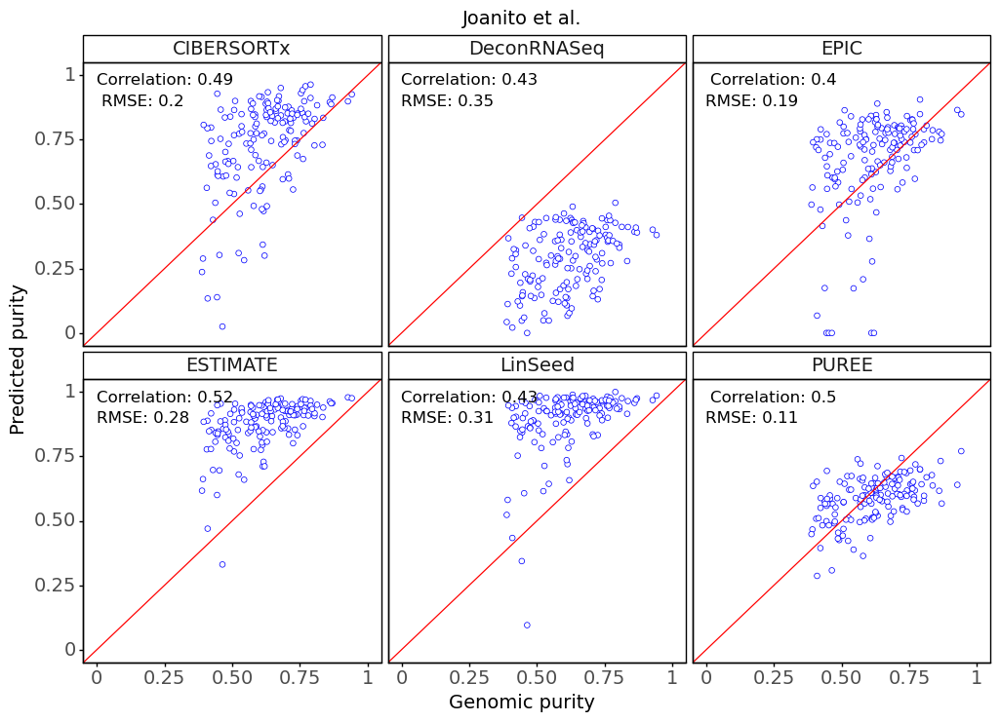

<ggplot: (8763989796331)>

In [39]:
SWARMPLOT_DOT_SIZE = 10
FONT_SIZE = 12
plt.rcParams.update({'font.size': FONT_SIZE})
LEGEND_FONT_SIZE = 10


### plotting

pur_melted = consensus_joanito.join(all_purities).melt(id_vars='Consensus', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'Consensus':'genomic purity'}, axis=1)
pur_melted_joanito = pur_melted.copy()
pur_melted_joanito.method = 'Joanito et al.: ' + pur_melted_joanito.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,8))
    + labs(
        title='Joanito et al.', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S11d_raw.pdf')
p

#### e) TCGA-CRC+ (Colorectal cancer)

##### Aggregated

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11e_agg.pdf


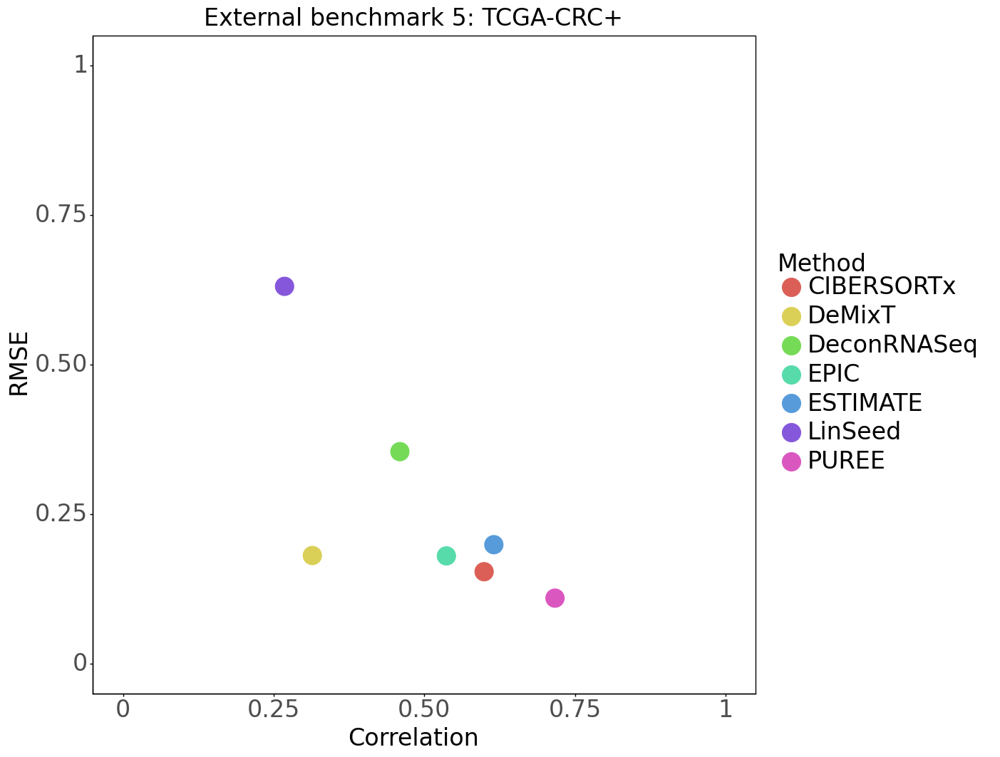

<ggplot: (8792871896739)>

In [276]:
###### 243 samples

purity_puree = pd.read_csv("../data/purities/TCGA_extra/CRC+/PUREE_TCGA-CRC_new_htseq_fpkm_formatted_purities.tsv", 
                           sep='\t', index_col=0)
purity_puree.columns = ['PUREE']

purity_estimate = (pd.read_csv('../data/purities/TCGA_extra/CRC+/ESTIMATE_TCGA_CRC_new_purities.csv',
                              index_col=0).reindex(purity_puree.index))

purity_epic = (pd.read_csv('../data/purities/TCGA_extra/CRC+/EPIC_TCGA_CRC_new_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_epic.columns=['EPIC']

purity_demixt = pd.read_csv("../data/purities/TCGA_extra/CRC+/DeMixT_TCGA_CRC_new_purities.csv", index_col=0)
purity_demixt.columns = ['DeMixT']

purity_linseed = 1-(pd.read_csv('../data/purities/TCGA_extra/CRC+/LinSeed_TCGA_CRC_new_proportions.csv', index_col=0)
                      .reindex(purity_puree.index).iloc[:,[1]])
purity_linseed.columns=['LinSeed']

purity_cibersortx = (pd.read_csv('../data/purities/TCGA_extra/CRC+/CIBERSORTx_TCGA_CRC_new_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_cibersortx.columns = ['CIBERSORTx']

purity_deconrnaseq = (pd.read_csv("../data/purities/TCGA_extra/CRC+/DeconRNASeq_TCGA_CRC_new_purities.csv", index_col=0)
                      .reindex(purity_puree.index))
purity_deconrnaseq.columns=['DeconRNASeq']

consensus_tcga_crc = (pd.read_csv("../data/purities/TCGA_extra/CRC+/ABSOLUTE_TCGA-CRC_new_htseq_fpkm_formatted_purities.tsv", sep='\t', index_col=0)
    .reindex(purity_puree.index))
consensus_tcga_crc.columns = ['ABSOLUTE']

all_purities = pd.concat([
    purity_estimate,
    purity_demixt,
    purity_cibersortx,
    purity_puree,
    purity_linseed,
    purity_epic,
    purity_deconrnaseq,
], axis=1)

compare_with = consensus_tcga_crc['ABSOLUTE'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index]

    correlation = pearsonr(method_pur, compare_with)[0]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

p = (ggplot(metrics_df, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(0, 1)
    + ylim(0, 1)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(title='External benchmark 5: TCGA-CRC+')
 )

# p.save('../plots/supplementary/S11e_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11e_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/py

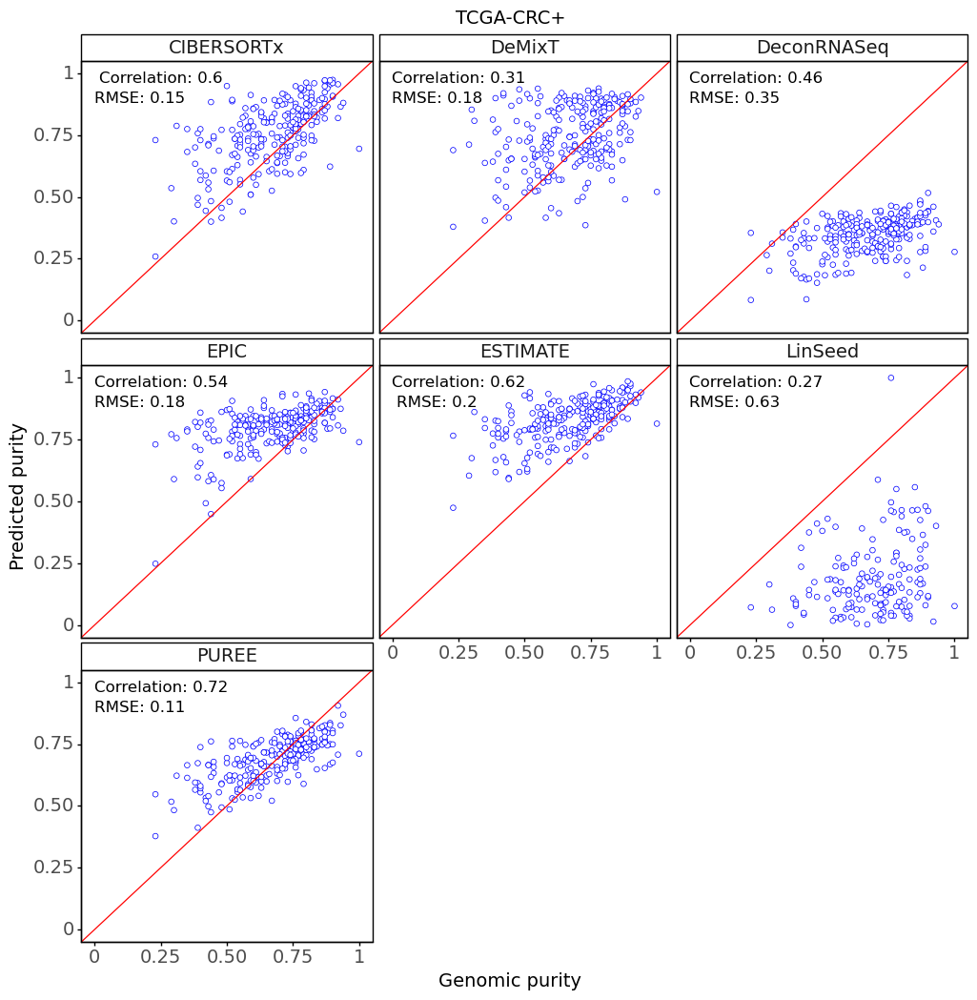

<ggplot: (8792873005165)>

In [279]:
pur_melted = consensus_tcga_crc.join(all_purities).melt(id_vars='ABSOLUTE', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'ABSOLUTE':'genomic purity'}, axis=1)
pur_melted_tcga_crc = pur_melted.copy()
pur_melted_tcga_crc.method = 'TCGA-CRC+: ' + pur_melted_tcga_crc.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,12))
    + labs(
        title='TCGA-CRC+', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S11e_raw.pdf')
p

#### f) TCGA-UCEC+ (Uterine cancer)

##### Aggregated

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11f_agg.pdf


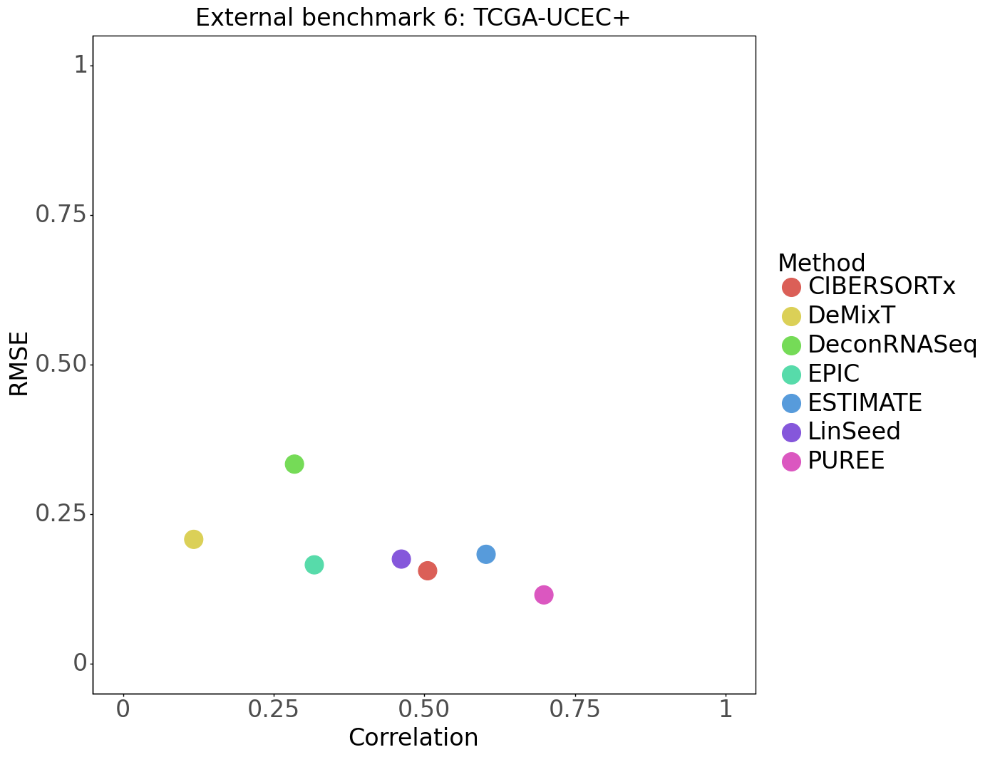

<ggplot: (8792870493742)>

In [288]:
###### 353 samples

purity_puree = pd.read_csv("../data/purities/TCGA_extra/UCEC+/PUREE_TCGA-UCEC_new_htseq_fpkm_formatted_purities.tsv", 
                           sep='\t', index_col=0)
purity_puree.columns = ['PUREE']

purity_estimate = (pd.read_csv('../data/purities/TCGA_extra/UCEC+/ESTIMATE_TCGA_UCEC_new_purities.csv',
                              index_col=0).reindex(purity_puree.index))

purity_epic = (pd.read_csv('../data/purities/TCGA_extra/UCEC+/EPIC_TCGA_UCEC_new_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_epic.columns=['EPIC']

purity_demixt = pd.read_csv("../data/purities/TCGA_extra/UCEC+/DeMixT_TCGA_UCEC_new_purities.csv", index_col=0)
purity_demixt.columns = ['DeMixT']

purity_linseed = 1-(pd.read_csv('../data/purities/TCGA_extra/UCEC+/LinSeed_TCGA_UCEC_new_proportions.csv', index_col=0)
                      .reindex(purity_puree.index).iloc[:,[0]])
purity_linseed.columns=['LinSeed']

purity_cibersortx = (pd.read_csv('../data/purities/TCGA_extra/UCEC+/CIBERSORTx_TCGA_UCEC_new_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_cibersortx.columns = ['CIBERSORTx']

purity_deconrnaseq = (pd.read_csv("../data/purities/TCGA_extra/UCEC+/DeconRNASeq_TCGA_UCEC_new_purities.csv", index_col=0)
                      .reindex(purity_puree.index))
purity_deconrnaseq.columns=['DeconRNASeq']

consensus_tcga_ucec = (pd.read_csv("../data/purities/TCGA_extra/UCEC+/ABSOLUTE_TCGA-UCEC_new_htseq_fpkm_formatted_purities.tsv", sep='\t', index_col=0)
    .reindex(purity_puree.index))
consensus_tcga_ucec.columns = ['ABSOLUTE']

all_purities = pd.concat([
    purity_estimate,
    purity_demixt,
    purity_cibersortx,
    purity_puree,
    purity_linseed,
    purity_epic,
    purity_deconrnaseq,
], axis=1)

compare_with = consensus_tcga_ucec['ABSOLUTE'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index]

    correlation = pearsonr(method_pur, compare_with)[0]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

p = (ggplot(metrics_df, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(0, 1)
    + ylim(0, 1)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(title='External benchmark 6: TCGA-UCEC+')
 )

# p.save('../plots/supplementary/S11f_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11f_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/py

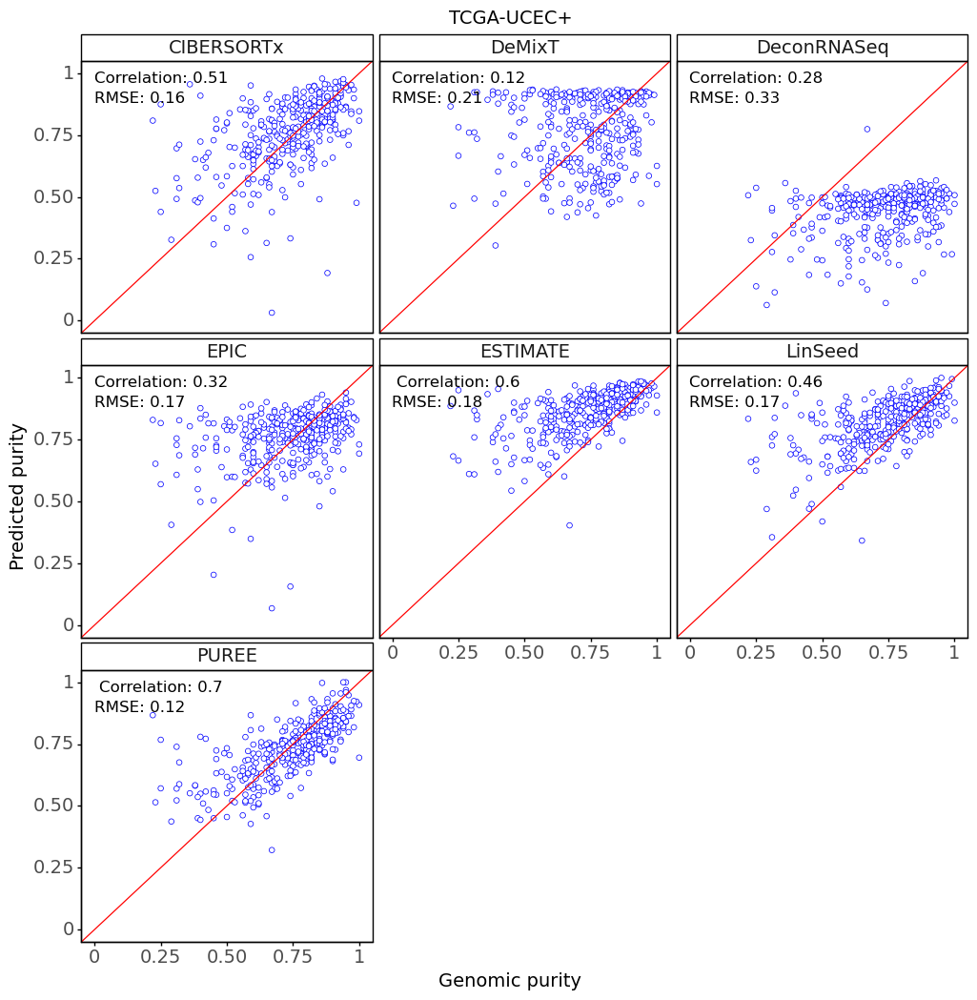

<ggplot: (8792879635893)>

In [289]:
pur_melted = consensus_tcga_ucec.join(all_purities).melt(id_vars='ABSOLUTE', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'ABSOLUTE':'genomic purity'}, axis=1)
pur_melted_tcga_ucec = pur_melted.copy()
pur_melted_tcga_ucec.method = 'TCGA-UCEC+: ' + pur_melted_tcga_ucec.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,12))
    + labs(
        title='TCGA-UCEC+', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S11f_raw.pdf')
p

#### g) TCGA-PCPG (Paraganglioma)

##### Aggregated

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11g_agg.pdf


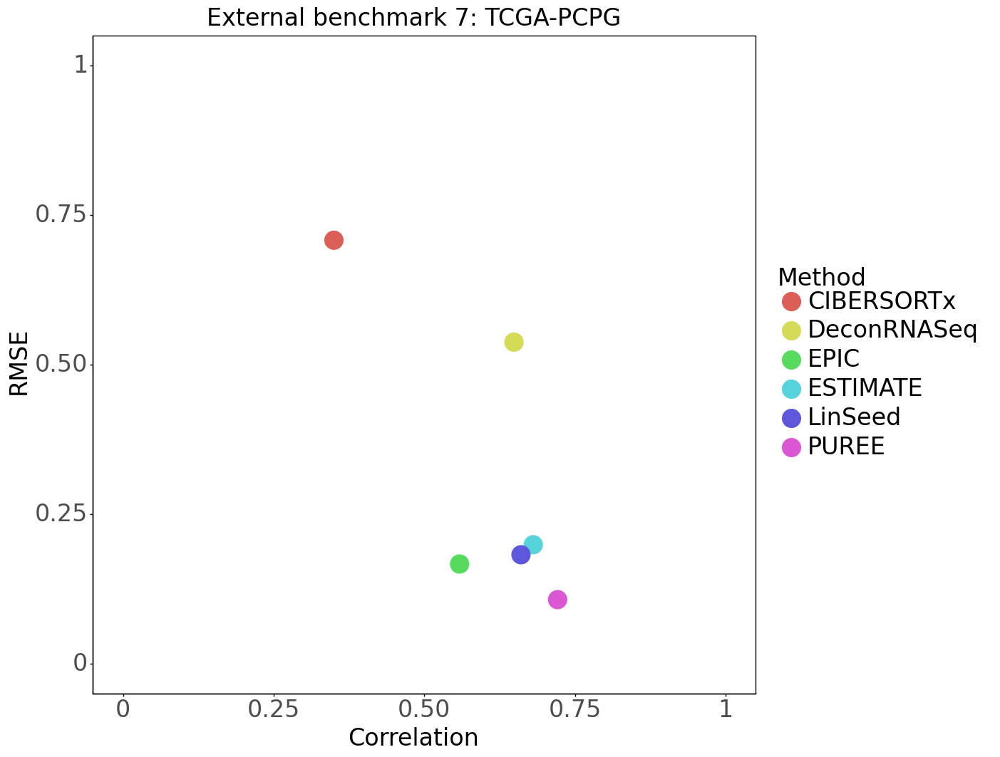

<ggplot: (8792875676760)>

In [286]:
###### 164 samples

purity_puree = pd.read_csv("../data/purities/TCGA_extra/PCPG/PUREE_TCGA-PCPG_htseq_fpkm_formatted_purities.tsv", 
                           sep='\t', index_col=0)
purity_puree.columns = ['PUREE']

purity_estimate = (pd.read_csv('../data/purities/TCGA_extra/PCPG/ESTIMATE_TCGA_PCPG_purities.csv',
                              index_col=0).reindex(purity_puree.index))

purity_epic = (pd.read_csv('../data/purities/TCGA_extra/PCPG/EPIC_TCGA_PCPG_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_epic.columns=['EPIC']

purity_linseed = 1-(pd.read_csv('../data/purities/TCGA_extra/PCPG/LinSeed_TCGA_PCPG_proportions.csv', index_col=0)
                      .reindex(purity_puree.index).iloc[:,[0]])
purity_linseed.columns=['LinSeed']

purity_cibersortx = (pd.read_csv('../data/purities/TCGA_extra/PCPG/CIBERSORTx_TCGA_PCPG_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_cibersortx.columns = ['CIBERSORTx']

purity_deconrnaseq = (pd.read_csv("../data/purities/TCGA_extra/PCPG/DeconRNASeq_TCGA_PCPG_purities.csv", index_col=0)
                      .reindex(purity_puree.index))
purity_deconrnaseq.columns=['DeconRNASeq']

consensus_tcga_pcpg = (pd.read_csv("../data/purities/TCGA_extra/PCPG/ABSOLUTE_TCGA-PCPG_htseq_fpkm_formatted_purities.tsv", sep='\t', index_col=0)
    .reindex(purity_puree.index))
consensus_tcga_pcpg.columns = ['ABSOLUTE']

all_purities = pd.concat([
    purity_estimate,
    purity_cibersortx,
    purity_puree,
    purity_linseed,
    purity_epic,
    purity_deconrnaseq,
], axis=1)

compare_with = consensus_tcga_pcpg['ABSOLUTE'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index]

    correlation = pearsonr(method_pur, compare_with)[0]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

p = (ggplot(metrics_df_tcga_pcpg, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(0, 1)
    + ylim(0, 1)
#     + xlim(0.25, 0.7)
#     + ylim(0.09, 0.65)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(title='External benchmark 7: TCGA-PCPG')
 )

# p.save('../plots/supplementary/S11g_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11g_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/pyt

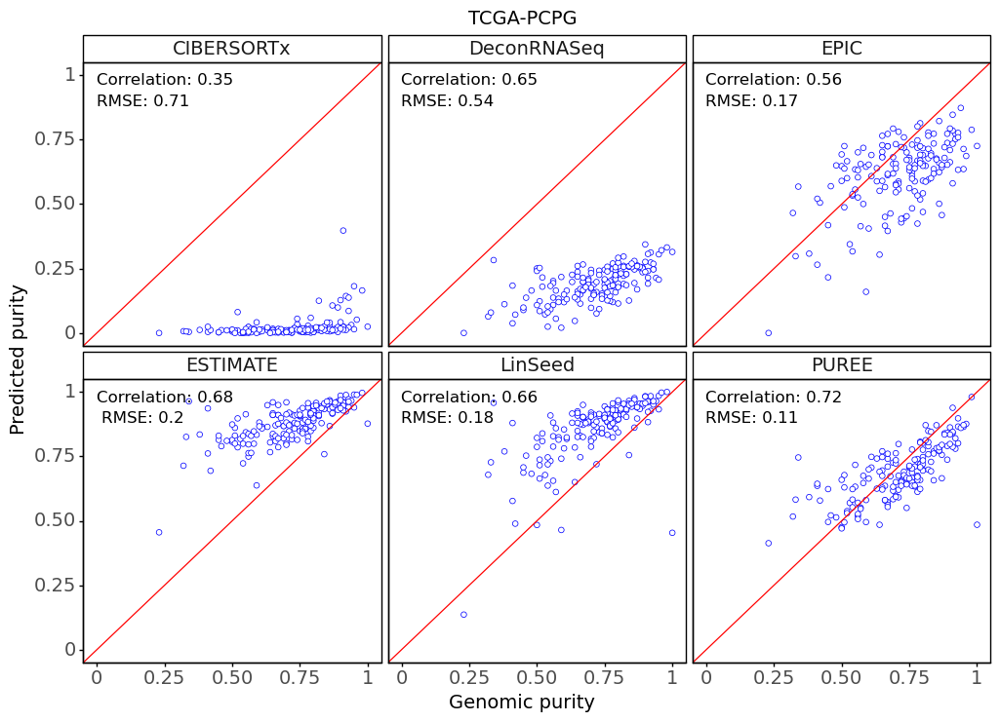

<ggplot: (8792879645817)>

In [287]:
### plotting

pur_melted = consensus_tcga_pcpg.join(all_purities).melt(id_vars='ABSOLUTE', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'ABSOLUTE':'genomic purity'}, axis=1)
pur_melted_tcga_pcpg = pur_melted.copy()
pur_melted_tcga_pcpg.method = 'TCGA-PCPG: ' + pur_melted_tcga_pcpg.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,8))
    + labs(
        title='TCGA-PCPG', x='Genomic purity', y='Predicted purity')
)

# p.save('../plots/supplementary/S11g_raw.pdf')
p

#### h) TCGA-TGCT (Testicular cancer)

##### Aggregated

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 12 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11h_agg.pdf


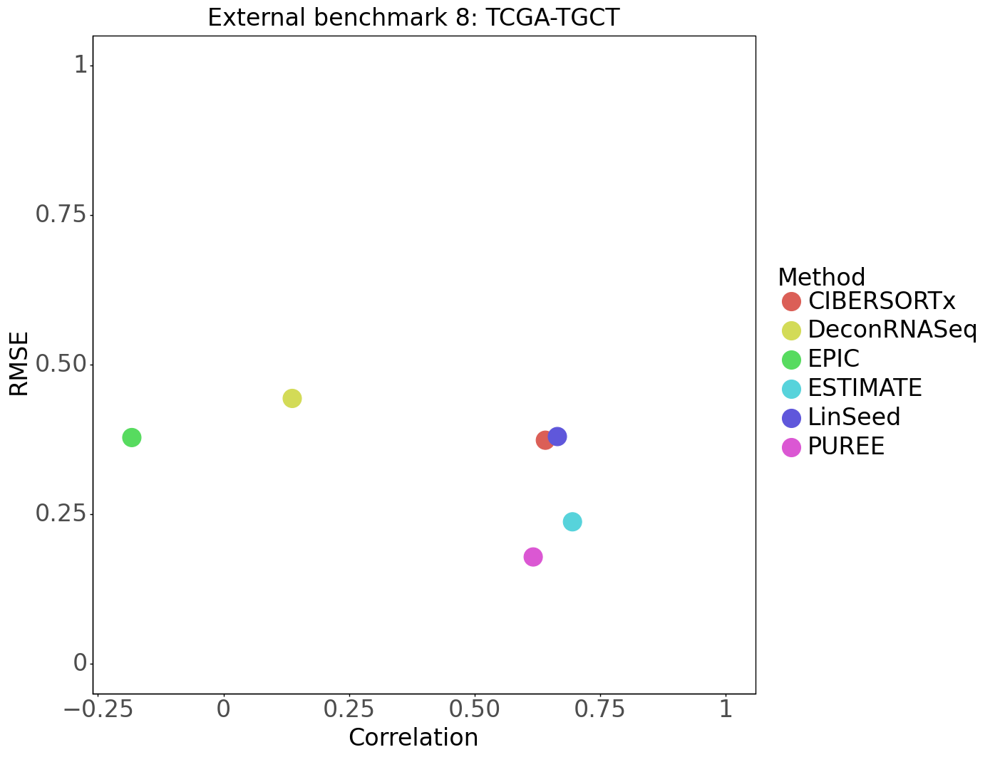

<ggplot: (8792875564198)>

In [290]:
###### 155 samples

purity_puree = pd.read_csv("../data/purities/TCGA_extra/TGCT/PUREE_TCGA-TGCT_htseq_fpkm_formatted_purities.tsv", 
                           sep='\t', index_col=0)
purity_puree.columns = ['PUREE']

purity_estimate = (pd.read_csv('../data/purities/TCGA_extra/TGCT/ESTIMATE_TCGA_TGCT_purities.csv',
                              index_col=0).reindex(purity_puree.index))

purity_epic = (pd.read_csv('../data/purities/TCGA_extra/TGCT/EPIC_TCGA_TGCT_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_epic.columns=['EPIC']

purity_linseed = 1-(pd.read_csv('../data/purities/TCGA_extra/TGCT/LinSeed_TCGA_TGCT_proportions.csv', index_col=0)
                      .reindex(purity_puree.index).iloc[:,[0]])
purity_linseed.columns=['LinSeed']

purity_cibersortx = (pd.read_csv('../data/purities/TCGA_extra/TGCT/CIBERSORTx_TCGA_TGCT_purities.csv', index_col=0)
                      .reindex(purity_puree.index))
purity_cibersortx.columns = ['CIBERSORTx']

purity_deconrnaseq = (pd.read_csv("../data/purities/TCGA_extra/TGCT/DeconRNASeq_TCGA_TGCT_purities.csv", index_col=0)
                      .reindex(purity_puree.index))
purity_deconrnaseq.columns=['DeconRNASeq']

consensus_tcga_tgct = (pd.read_csv("../data/purities/TCGA_extra/TGCT/ABSOLUTE_TCGA-TGCT_htseq_fpkm_formatted_purities.tsv", sep='\t', index_col=0)
    .reindex(purity_puree.index))
consensus_tcga_tgct.columns = ['ABSOLUTE']

all_purities = pd.concat([
    purity_estimate,
    purity_cibersortx,
    purity_puree,
    purity_linseed,
    purity_epic,
    purity_deconrnaseq,
], axis=1)

compare_with = consensus_tcga_tgct['ABSOLUTE'].dropna()

cor_metrics = []
rmse_metrics = []
methods = []


for item in all_purities.iteritems():
    method_pur = item[1].loc[compare_with.index]

    correlation = pearsonr(method_pur, compare_with)[0]
    cor_metrics.append(correlation)

    rmse = np.sqrt(mean_squared_error(method_pur, compare_with))
    rmse_metrics.append(rmse)

    methods.append(item[0])

metrics_df = pd.DataFrame(list(zip(cor_metrics, rmse_metrics, methods)),
                          columns=['Correlation', 'RMSE', 'Method'], index=methods)

p = (ggplot(metrics_df_tcga_tgct, aes(x='Correlation', y='RMSE'))
    + geom_point(aes(color='Method'), size=10)
    + xlim(-0.2, 1)
    + ylim(0, 1)
    + theme_classic()
    + theme(panel_border=element_rect(),
            text = element_text(size=24),
            figure_size=(12, 12))
    + labs(title='External benchmark 8: TCGA-TGCT')
 )

# p.save('../plots/supplementary/S11h_agg.pdf')
p

##### Raw

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 12 x 8 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S11_raw.pdf
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/facets/facet.py:487: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/home/ubuntu/anaconda3/envs/plotting_env/lib/pyth

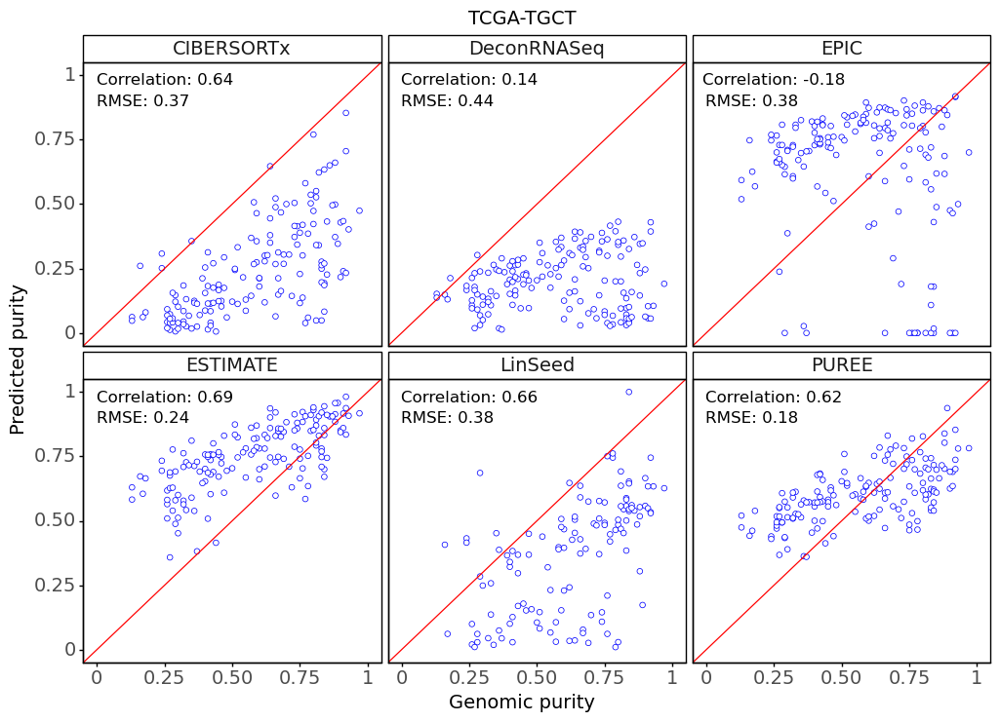

<ggplot: (8792871352983)>

In [291]:
### plotting

pur_melted = consensus_tcga_tgct.join(all_purities).melt(id_vars='ABSOLUTE', ignore_index=False).dropna()
pur_melted = pur_melted.rename({'variable':'method', 'value':'predicted purity', 'ABSOLUTE':'genomic purity'}, axis=1)
pur_melted_tcga_tgct = pur_melted.copy()
pur_melted_tcga_tgct.method = 'TCGA-TGCT: ' + pur_melted_tcga_tgct.method

def metrics(x, y, *args, **kwargs):
    # text on plots (depends on how the dataframe is built)
    p_r = np.round(pearsonr(x, y)[0], 2)
    rmse = np.round(np.sqrt(mean_squared_error(x, y)), 2)
    return ("Correlation: {0}".format(p_r), "RMSE: {0}".format(rmse))

comparison_method = 'genomic purity'
prediction_method = 'predicted purity'

metrics_df = pur_melted.groupby('method').apply(lambda x: metrics(x[comparison_method], x[prediction_method])).to_frame()
metrics_df = pd.DataFrame(metrics_df[0].to_list(), index=metrics_df.index, columns=['corr', 'rmse']).reset_index()

p = (ggplot(pur_melted, aes(comparison_method, prediction_method))
    + geom_point(color='blue', fill='white', size=2, stroke=0.3, na_rm=True)
    + xlim(0,1)
    + ylim(0,1)
    + geom_abline(intercept=0, color='red')
    + facet_wrap('method', ncol=3)
#     + geom_text(aes(x = 0.75, y = 0.08, label = 'corr'), data = metrics_df, size = 16)
#     + geom_text(aes(x = 0.70, y = 0, label = 'rmse'), data = metrics_df, size = 16)
    + geom_text(aes(x = 0.25, y = 0.98, label = 'corr'), data = metrics_df, size = 12)
    + geom_text(aes(x = 0.17, y = 0.90, label = 'rmse'), data = metrics_df, size = 12)
    + theme_classic()
    + theme(panel_border=element_rect(), 
            text = element_text(size=14),
            figure_size=(12,8))
    + labs(
        title='TCGA-TGCT', x='Genomic purity', y='Predicted purity')
)


# p.save('../plots/supplementary/S11_raw.pdf')
p

### Supp. Fig. 12: Time/Memory benchmark

#### a) Memory

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 18 x 4 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S12a.pdf


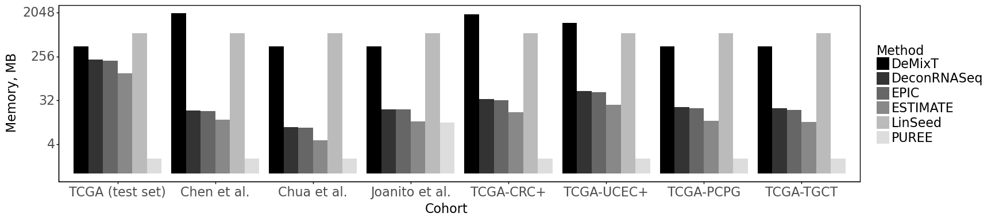

<ggplot: (8792872215095)>

In [294]:
# DEMIXT columns for Chua, Joanito et al.,TCGA-TGCT and TCGA-PCPG are "fake"
all_cohorts_tm_prof = pd.read_csv('../data/misc/all_methods_prof_benchmark_all_cohorts.csv', index_col=0)
all_cohorts_tm_prof['cohort'].replace({'TCGA':'TCGA-test'}, inplace=True)
all_cohorts_tm_prof['1/run_time'] = 1/all_cohorts_tm_prof['run_time'] * 10
all_cohorts_tm_prof['run_time_ms'] = all_cohorts_tm_prof['run_time'] * 1000
all_cohorts_tm_prof['log_run_time_ms'] = np.log(all_cohorts_tm_prof['run_time'] * 1000) 
all_cohorts_tm_prof['max_mem_k'] = all_cohorts_tm_prof['max_mem']

# artificially increase minimal values so they're plotted well on log scale
numeric_cols = all_cohorts_tm_prof.dtypes[all_cohorts_tm_prof.dtypes =='float64'].index
non_numeric_cols = all_cohorts_tm_prof.dtypes[all_cohorts_tm_prof.dtypes !='float64'].index
temp_non_numeric = all_cohorts_tm_prof[non_numeric_cols]
temp_numeric = all_cohorts_tm_prof.drop(non_numeric_cols, axis=1)
temp_numeric[temp_numeric < 2] = 2
all_cohorts_tm_prof = pd.concat([temp_numeric, temp_non_numeric], axis=1)

all_cohorts_tm_prof = all_cohorts_tm_prof[all_cohorts_tm_prof.cohort != 'Kim et al.']

cohort_order = [
    'TCGA (test set)',
    'Chen et al.',
    'Chua et al.',
    'Joanito et al.',
    'TCGA-CRC+',
    'TCGA-UCEC+',
    'TCGA-PCPG',
    'TCGA-TGCT'
]

cat_dtype = CategoricalDtype(np.sort(all_cohorts_tm_prof['cohort'].unique())[::-1], ordered=True)
all_cohorts_tm_prof['cohort'] = all_cohorts_tm_prof['cohort'].astype(cat_dtype)


p = (ggplot(all_cohorts_tm_prof, )
    + geom_bar(aes(x='cohort', y='max_mem_k', fill='method'), 
               stat='identity', position=position_dodge())
    + labs(x="Cohort", y="Memory, MB", fill='Method'
          )
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=16),
            figure_size=(18, 4))
    + scale_x_discrete(limits=cohort_order)
     + scale_fill_manual(('#000000', '#333333', '#666666', '#888888', '#bbbbbb', '#dddddd'))
     + scale_y_continuous(trans='log2')
)

# p.save('../plots/supplementary/S12a.pdf')
p

#### b) Time

/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 18 x 4 in image.
/home/ubuntu/anaconda3/envs/plotting_env/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: ../plots/supplementary/S12b.pdf


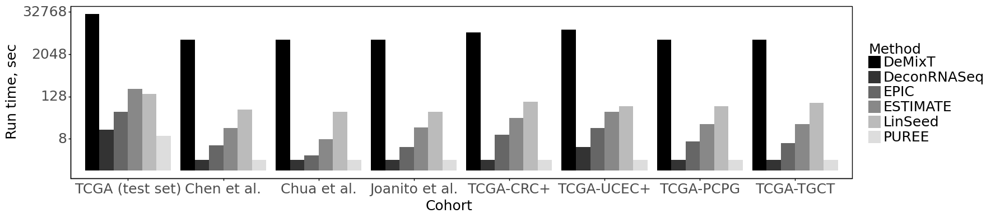

<ggplot: (8792869989193)>

In [296]:
# DEMIXT columns for Chua CRC-GIS, TCGA-UCEC+, TCGA-TGCT and TCGA-PCPG are "fake"
all_cohorts_tm_prof = pd.read_csv('../data/misc/all_methods_prof_benchmark_all_cohorts.csv', index_col=0)
all_cohorts_tm_prof['cohort'].replace({'TCGA':'TCGA-test'}, inplace=True)
all_cohorts_tm_prof['1/run_time'] = 1/all_cohorts_tm_prof['run_time'] * 10
all_cohorts_tm_prof['run_time_ms'] = all_cohorts_tm_prof['run_time'] * 1000
all_cohorts_tm_prof['log_run_time_ms'] = np.log(all_cohorts_tm_prof['run_time'] * 1000) 
all_cohorts_tm_prof['max_mem_k'] = all_cohorts_tm_prof['max_mem']

all_cohorts_tm_prof = all_cohorts_tm_prof[all_cohorts_tm_prof.cohort != 'Kim et al.']

# artificially increase minimal values so they're plotted well on log scale
numeric_cols = all_cohorts_tm_prof.dtypes[all_cohorts_tm_prof.dtypes =='float64'].index
non_numeric_cols = all_cohorts_tm_prof.dtypes[all_cohorts_tm_prof.dtypes !='float64'].index
temp_non_numeric = all_cohorts_tm_prof[non_numeric_cols]
temp_numeric = all_cohorts_tm_prof.drop(non_numeric_cols, axis=1)
temp_numeric[temp_numeric < 2] = 2
all_cohorts_tm_prof = pd.concat([temp_numeric, temp_non_numeric], axis=1)

cohort_order = [
    'TCGA (test set)',
    'Chen et al.',
    'Chua et al.',
    'Joanito et al.',
    'TCGA-CRC+',
    'TCGA-UCEC+',
    'TCGA-PCPG',
    'TCGA-TGCT'
]

cat_dtype = CategoricalDtype(np.sort(all_cohorts_tm_prof['cohort'].unique())[::-1], ordered=True)
all_cohorts_tm_prof['cohort'] = all_cohorts_tm_prof['cohort'].astype(cat_dtype)


cat_dtype = CategoricalDtype(np.sort(all_cohorts_tm_prof['cohort'].unique())[::-1], ordered=True)
all_cohorts_tm_prof['cohort'] = all_cohorts_tm_prof['cohort'].astype(cat_dtype)

p = (ggplot(all_cohorts_tm_prof, )
    + geom_bar(aes(x='cohort', y='run_time', fill='method'), 
               stat='identity', position=position_dodge())
    + labs(x="Cohort", y="Run time, sec", fill='Method'
          )
    + theme_classic()
    + theme(panel_border=element_rect(), text = element_text(size=18),
            figure_size=(18, 4))
    + scale_x_discrete(limits=cohort_order)
     + scale_fill_manual(('#000000', '#333333', '#666666', '#888888', '#bbbbbb', '#dddddd'))
     + scale_y_continuous(trans='log2')
)

# p.save('../plots/supplementary/S12b.pdf')
p

### Supp. Fig. S13: Heatmaps of PUREE’s genes’ expressions in single-cell RNA-seq data

#### a) Head and neck (Puram et al.)

In [29]:
non_cancer_cells_sample_data_zscored_together = pd.read_csv('../data/single-cell/head_and_neck/non_mal_cells_zcores.csv',
                                                           index_col=0)
cancer_cells_sample_data_zscored_together = pd.read_csv('../data/single-cell/head_and_neck/mal_cells_zcores.csv', 
                                                       index_col=0)

total_num_cells = non_cancer_cells_sample_data_zscored_together.shape[0] + cancer_cells_sample_data_zscored_together.shape[0]

corr_df = pd.read_csv('../data/misc/mean_corr_hgnc.csv', index_col=0)
corr_df = (corr_df.sort_values(by='Metric'))

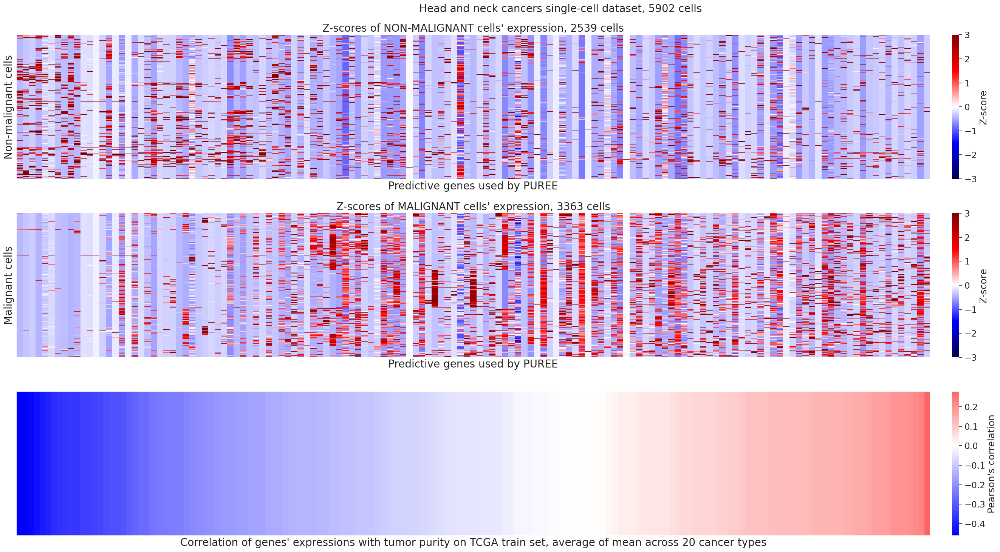

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(3, 1, figsize=(30,15))

sns.set(font_scale = 1.5)
for i,d in enumerate([(non_cancer_cells_sample_data_zscored_together.reindex(corr_df.index,axis=1)
                          .replace(0, np.nan)
                          .dropna(axis=1, how='all')), 
                      (cancer_cells_sample_data_zscored_together.reindex(corr_df.index,axis=1)
                           .replace(0, np.nan)
                           .dropna(axis=1, how='all'))
                     ]):
    sns.heatmap(d, 
                cmap="seismic", # for zscored data
                xticklabels=False,
                yticklabels=False,
                vmin = -3, # for zscored data
                vmax = 3,
                center = 0,
                cbar_kws={'label': "Z-score", "pad": 0.02},
                ax=ax[i],
               )

sns.heatmap(corr_df.loc[:, ['Metric']].T, 
            cmap="bwr",
            center=0,
            xticklabels=False,
            yticklabels=False,
            cbar_kws={'label': "Pearson's correlation", "pad": 0.02},
            ax=ax[2]
           )
    
ax[0].set_title("Z-scores of NON-MALIGNANT cells' expression, %s cells" % cancer_cells_sample_data_zscored_together.shape[0],
                   fontsize=20)
ax[1].set_title("Z-scores of MALIGNANT cells' expression, %s cells" % non_cancer_cells_sample_data_zscored_together.shape[0],
                   fontsize=20)
ax[0].set_ylabel('Non-malignant cells', fontsize=20)
ax[1].set_ylabel('Malignant cells', fontsize=20)
ax[0].set_xlabel('Predictive genes used by PUREE', fontsize=20)
ax[1].set_xlabel('Predictive genes used by PUREE', fontsize=20)
ax[2].set_xlabel("Correlation of genes' expressions with tumor purity on TCGA train set, average of mean across 20 cancer types", fontsize=20)
fig.suptitle('Head and neck cancers single-cell dataset, %s cells' % total_num_cells, fontsize=20)
plt.tight_layout()
# plt.savefig("../plots/supplementary/S13a.pdf")
plt.show()

#### b) Melanoma (Tirosh et al.)

In [24]:
non_cancer_cells_sample_data_zscored_together = pd.read_csv('../data/single-cell/melanoma/non_mal_cells_zcores.csv',
                                                           index_col=0)
cancer_cells_sample_data_zscored_together = pd.read_csv('../data/single-cell/melanoma/mal_cells_zcores.csv', 
                                                       index_col=0)

total_num_cells = non_cancer_cells_sample_data_zscored_together.shape[0] + cancer_cells_sample_data_zscored_together.shape[0]

corr_df = pd.read_csv('../data/misc/mean_corr_hgnc.csv', index_col=0)
corr_df = (corr_df.sort_values(by='Metric'))

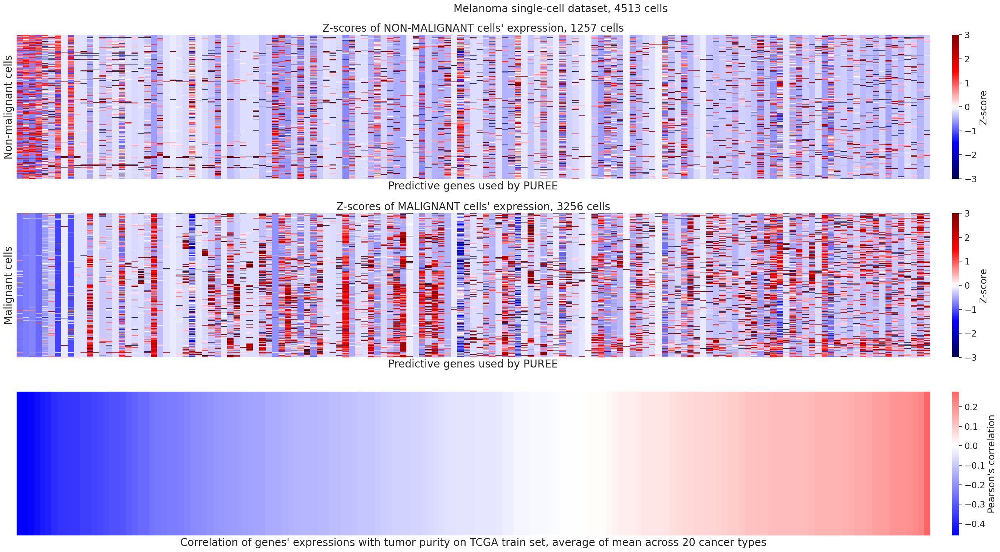

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(3, 1, figsize=(30,15))

sns.set(font_scale = 1.5)
for i,d in enumerate([(non_cancer_cells_sample_data_zscored_together.reindex(corr_df.index,axis=1)
                          .replace(0, np.nan)
                          .dropna(axis=1, how='all')), 
                      (cancer_cells_sample_data_zscored_together.reindex(corr_df.index,axis=1)
                           .replace(0, np.nan)
                           .dropna(axis=1, how='all'))
                     ]):
    sns.heatmap(d, 
                cmap="seismic", # for zscored data
                xticklabels=False,
                yticklabels=False,
                vmin = -3, # for zscored data
                vmax = 3,
                center = 0,
                cbar_kws={'label': "Z-score", "pad": 0.02},
                ax=ax[i],
               )

sns.heatmap(corr_df.loc[:, ['Metric']].T, 
            cmap="bwr",
            center=0,
            xticklabels=False,
            yticklabels=False,
            cbar_kws={'label': "Pearson's correlation", "pad": 0.02},
            ax=ax[2]
           )
    
ax[0].set_title("Z-scores of NON-MALIGNANT cells' expression, %s cells" % cancer_cells_sample_data_zscored_together.shape[0],
                   fontsize=20)
ax[1].set_title("Z-scores of MALIGNANT cells' expression, %s cells" % non_cancer_cells_sample_data_zscored_together.shape[0],
                   fontsize=20)
ax[0].set_ylabel('Non-malignant cells', fontsize=20)
ax[1].set_ylabel('Malignant cells', fontsize=20)
ax[0].set_xlabel('Predictive genes used by PUREE', fontsize=20)
ax[1].set_xlabel('Predictive genes used by PUREE', fontsize=20)
ax[2].set_xlabel("Correlation of genes' expressions with tumor purity on TCGA train set, average of mean across 20 cancer types", fontsize=20)
fig.suptitle('Melanoma single-cell dataset, %s cells' % total_num_cells, fontsize=20)
plt.tight_layout()
# plt.savefig("../plots/supplementary/S13b.pdf")
plt.show()